# This is a minimal solve_ivp example of the Pandya+22 "sapphire" SAM
### This project is a work in progress.
### Do not publicly share without permission from Viraj Pandya (vgp2108@columbia.edu)

In [159]:
# load modules
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from astropy.cosmology import Planck15, FlatLambdaCDM
from astropy.table import Table
from astropy import constants as const
from astropy import units as u
from astropy.io import fits
from scipy.interpolate import RegularGridInterpolator, UnivariateSpline, InterpolatedUnivariateSpline, interp2d, RectBivariateSpline
from scipy.ndimage import gaussian_filter1d
from glob import glob
import multiprocess
from scipy.integrate import simps, solve_ivp, trapz
import h5py 
from timeit import default_timer as timer
from scipy.signal import savgol_filter
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import LogNorm

import symlib # for this you just do "pip install symlib" 
from sparta import moria # for this, you clone his bitbucket repo, go into analysis directory, and then "python setup.py install" 

plt.rcParams['figure.dpi'] = 120
plt.rcParams['ytick.right'] = True
plt.rcParams['xtick.top'] = True

# read observed MW satellite data

In [2]:
# read in latest McConnachie+12 compilation from website 

hdu = fits.open('NearbyGalaxies_Jan2021_PUBLIC.fits')
tm12 = Table(hdu[1].data)
hdu.close()
tm12

GalaxyName,RA,Dec,EB-V,dmod,dmod+,dmod-,vh,vh+,vh-,Vmag,Vmag+,Vmag-,PA,PA+,PA-,e=1-b/a,e+,e-,muVo,muVo+,muVo-,rh,rh+,rh-,sigma_s,sigma_s+,sigma_s-,vrot_s,vrot_s+,vrot_s-,MHI,sigma_g,sigma_g+,sigma_g-,vrot_g,vrot_g+,vrot_g-,[Fe/H],feh+,feh-,F,pmra,epmra+,epmra-,pmdec,epmdec+,epmdec-,References
str16,str10,str11,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,float32,float32,float32,float32,float32,float32,str53
*Bootes3,13:57:12.0,26:48:0.0,0.021,18.35,0.1,0.1,197.5,3.8,3.8,12.6,0.5,0.5,90.0,999.0,999.0,0.5,999.0,999.0,31.3,0.3,0.3,999.0,999.0,999.0,14.0,3.2,3.2,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,-2.1,0.2,0.2,2,nan,nan,nan,nan,nan,nan,(14)(15)(99)
*CanisMajor,7:12:35.0,-27:40:0.0,0.264,14.29,0.3,0.3,87.0,4.0,4.0,-0.1,0.8,0.8,123.0,999.0,999.0,999.0,999.0,999.0,24.0,0.6,0.6,999.0,999.0,999.0,20.0,3.0,3.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,-0.5,0.2,0.2,4,nan,nan,nan,nan,nan,nan,(1)(2)(95)(176)
*Cetus2,1:17:52.8,-17:25:12.0,0.02,17.1,0.1,0.1,999.0,999.0,999.0,17.4,0.7,0.7,999.0,999.0,999.0,999.0,999.0,999.0,28.55,1.2,1.2,1.9,1.0,0.5,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,-1.28,0.07,0.07,5,2.84,0.05,0.07,0.46,0.06,0.07,(232)(260)(266)(267)
*Columba1,5:31:26.4,-28:1:48.0,0.025,21.3,0.22,0.22,153.7,5.0,4.8,16.8,0.2,0.2,999.0,999.0,999.0,999.0,999.0,999.0,27.95,0.7,0.7,1.9,0.5,0.4,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,9,0.19,0.06,0.06,-0.36,0.06,0.06,(232)(248)(266)(267)
*Draco2,15:52:47.6,64:33:55.0,0.018,16.67,0.05,0.05,-342.5,1.1,1.2,14.0,0.8,0.8,76.0,22.0,32.0,0.23,0.15,0.15,25.62,1.3,1.3,3.0,0.7,0.5,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,-2.7,0.1,0.1,5,1.08,0.07,0.07,0.91,0.08,0.08,(225)(259)(266)(267)
*Eridanus3,2:22:45.5,-52:17:1.0,0.025,19.7,0.2,0.2,999.0,999.0,999.0,17.33,0.86,0.86,62.0,11.0,11.0,0.32,0.13,0.13,22.84,4.28,2.13,0.29,0.23,0.23,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,9,1.08,0.14,0.45,-0.49,0.17,0.13,(226)(227)(255)(266)(267)
*Grus1,22:56:42.4,-50:9:48.0,0.008,20.4,0.2,0.2,-140.5,2.4,1.6,16.93,0.59,0.59,11.0,32.0,32.0,0.54,0.26,0.26,26.86,1.77,1.35,2.08,0.87,0.87,9.8,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,-1.42,0.55,0.42,2,0.07,0.05,0.05,-0.29,0.06,0.07,(226)(252)(255)(266)(267)
*Grus2,22:4:4.8,-46:26:24.0,0.016,18.62,0.21,0.21,-110.0,0.5,0.5,14.7,0.2,0.2,999.0,999.0,999.0,999.0,999.0,999.0,28.35,0.7,0.7,6.0,0.9,0.5,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,-2.51,0.11,0.11,3,0.38,0.03,0.03,-1.46,0.04,0.04,(232)(262)(266)(267)
*Horologium1,2:55:31.7,-54:7:8.0,0.014,19.5,0.2,0.2,112.8,2.5,2.6,15.95,0.56,0.56,50.0,26.0,26.0,0.31,0.16,0.16,26.28,1.1,0.99,1.54,0.34,0.34,4.9,2.8,0.9,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,-2.76,0.1,0.1,2,0.82,0.03,0.03,-0.61,0.03,0.03,(226)(227)(254)(255)(266)(267)


In [3]:
# remove the two galaxies without Vmag
tm12 = tm12[tm12['Vmag']!=999]

# following his paper, use distance modulus to convert apparent Vmag to absolute M_V
tm12['M_V'] = tm12['Vmag'] - tm12['dmod']

# convert absolute magnitude to solar luminosities assuming solar M_V=4.83
tm12['L_V'] = 10**((tm12['M_V'] - 4.83)/(-2.5)) # Lsun

# his stellar mass in Table 4 assumes M/L=1 so kind of meaningless... but let's assume it since old stellar pop would have M/L~2 (Simon19)
tm12['Mstar'] = 1.0 * tm12['L_V'] # Msun

# convert distance modulus to distance in kpc
tm12['distance'] = 1e-3 * 10**(1+tm12['dmod']/5.)

# Alan McConnachie said via email that to select MW satellites, you just do distance < Rvir ~ 300 kpc (no vhelio cut as in his 2012 Figure 2)
# he also said that he will release another updated table by Dec 22, 2023
len(tm12), len(tm12[tm12['distance']<300]) # yeah about ~60 MW satellites makes sense

(142, 62)

In [4]:
# read Drlica-Wagner Table 2 which lists all confirmed MW satellites combining McConnachie+12 with Simon+19

tdw20 =Table.read('drlicawagner20_MWsatellites.txt',format='mrt')

# restrict to confirmed/probable dwarfs by doing Class >= 3 as suggested in paper
tdw20 = tdw20[tdw20['Class']>=3]

tdw20

Name,Survey,Class,RAdeg,DEdeg,m-M,ah,l_e,e,D,r1/2,VMag,Ref
,,,deg,deg,mag,arcmin,,,kpc,pc,mag,
str17,str8,int64,float64,float64,float64,float64,str1,float64,int64,int64,float64,str6
Antlia II,--,4,143.8868,-36.7673,20.6,76.2,--,0.38,132,2301,-9.03,1
Aquarius II,PS1,4,338.4813,-9.3274,20.2,5.1,--,0.39,108,125,-4.4,2
Bootes I,PS1,4,210.02,14.5135,19.1,9.97,--,0.3,66,160,-6.02,3
Bootes II,PS1,4,209.5141,12.8553,18.1,3.17,--,0.25,42,33,-2.94,3
Bootes III,PS1,4,209.3,26.8,18.4,30.0,--,0.5,47,289,-5.75,4
Bootes IV,PS1,3,233.689,43.726,21.6,7.6,--,0.64,209,277,-4.53,5
Canes Venatici I,PS1,4,202.0091,33.5521,21.7,7.12,--,0.44,218,338,-8.8,3
Canes Venatici II,PS1,4,194.2927,34.3226,21.0,1.52,--,0.4,160,55,-5.17,3


In [5]:
# convert absolute Vmag to L_V and then Mstar assuming stellar pop has M/L=1
tdw20['L_V'] = 10**((tdw20['VMag'] - 4.83)/(-2.5)) # Lsun
tdw20['Mstar'] = 1.0 * tdw20['L_V'] # Msun

In [6]:
# annoying manual dict mapping Drlica-Wagner+20 name to McConnachie+12 to get Fe/H
# i dont feel like coming up with a clever way to do this right now -- alan will get back to me via email about selecting MW sats from his 

map_name = {'Antlia II':'Antlia2         ', 'Aquarius II':'Aquarius2       ', 
            'Bootes I':'Bootes(1)       ', 'Bootes II':'Bootes2         ', 'Bootes III':'*Bootes3        ',
            'Bootes IV':'Bootes4         ', 'Canes Venatici I':'CanesVenatici(1)', 'Canes Venatici II':'CanesVenatici2  ', 'Carina':'Carina          ',
            'Carina II':'Carina2         ', 'Carina III':'Carina3         ', 'Centaurus I':'Centaurus1      ', 'Cetus II':'*Cetus2         ', 
            'Cetus III':'Cetus3          ','Columba I':'*Columba1       ', 'Coma Berenices':'ComaBerenices   ', 'Crater II':'Crater2         ',
            'Draco':'Draco           ', 'Draco II':'*Draco2         ','Eridanus II':'Eridanus2       ', 'Fornax':'Fornax          ',
            'Grus I':'*Grus1          ', 'Grus II':'*Grus2          ', 'Hercules':'Hercules        ','Horologium I':'*Horologium1    ',
            'Horologium II':'*Horologium2    ', 'Hydra II':'Hydra2          ', 'Hydrus I':'Hydrus1         ', 'LMC':'LMC             ',
            'Leo I':'Leo1            ', 'Leo II':'Leo2            ', 'Leo IV':'Leo4            ', 'Leo V':'Leo5            ', 
            'Pegasus III':'*Pegasus3       ', 'Phoenix II':'*Phoenix2       ',
            'Pictor I':'*Pictor1        ', 'Pictor II':'Pictor2         ', 'Pisces II':'Pisces2         ', 'Reticulum II':'*Reticulum2     ',
            'Reticulum III':'*Reticulum3     ', 'Sagittarius':'SagittariusdSph ', 'Sagittarius II':'*Sagittarius2   ', 'Sculptor':'Sculptor        ',
            'Segue 1':'Segue(1)        ', 'Segue 2':'Segue2          ', 'Sextans':'Sextans(1)      ', 'SMC':'SMC             ', 
            'Triangulum II':'*Triangulum2    ','Tucana II':'Tucana2         ', 'Tucana III':'*Tucana3        ', 'Tucana IV':'*Tucana4        ',
            'Tucana V':'*Tucana5        ', 'Ursa Major I':'UrsaMajor(1)    ','Ursa Major II':'UrsaMajor2      ',
            'Ursa Minor':'UrsaMinor       ', 'Virgo I':'Virgo1          ', 'Willman 1':'Willman1        '}

# now get Fe/H from McConnachie+12 table for all MW sats in Drlica-Wagner+20 table
FeH_m12 = np.array([tm12[tm12['GalaxyName']==map_name[name]]['[Fe/H]'][0] for name in tdw20['Name']])
FeH_err_high = np.array([tm12[tm12['GalaxyName']==map_name[name]]['feh+'][0] for name in tdw20['Name']])
FeH_err_low = np.array([tm12[tm12['GalaxyName']==map_name[name]]['feh-'][0] for name in tdw20['Name']])

tdw20['Fe/H'] = FeH_m12
tdw20['Fe/H_err_high'] = FeH_err_high
tdw20['Fe/H_err_low'] = FeH_err_low

# download Symphony data -- should take only a few min and it's < 1 GB

these are not full tree files but much more convenient and compact 2D arrays where 0th row = main branch properties of host MW halo, nth row = main branch properties of nth subhalo (ordering of subhalo into rows is based on decreasing Mpeak)

http://web.stanford.edu/group/gfc/symphony/build/html/getting_started.html

In [7]:
# symlib.download_files('guest', '$YmPh0ny', "SymphonyMilkyWay", None, '/mnt/ceph/users/vpandya/symphony/', target='halos')

# print('Finished!')

# read Symphony data

In [8]:
base_dir = '/mnt/ceph/users/vpandya/symphony/'
suite_name = 'SymphonyMilkyWay'
n_hosts = symlib.n_hosts('SymphonyMilkyWay')

i_host = 12

sim_dir = symlib.get_host_directory(base_dir,'SymphonyMilkyWay', i_host)
print(n_hosts, sim_dir)

params = symlib.simulation_parameters(sim_dir)
print(params)

# set up astropy cosmology object with same parameters as simulation
cosmo = FlatLambdaCDM(H0=params['H0'],Om0=params['Om0'],Ob0=params['Ob0'])
print(cosmo)

### read data
s, hist = symlib.read_symfind(sim_dir) # symfind subhalo finder
r, hist_r = symlib.read_rockstar(sim_dir) # rockstar halo finder

# scale factors corresponding to each snapshot of the simulation
scale = symlib.scale_factors(sim_dir)

# convert scale factors to cosmic age (time since BB)
time = cosmo.age(1/scale-1).value # Gyr

### test subhalo selection
isubs = [i for i in range(1,len(r)) if r[i,-1]['ok'] == True and r[i,-1]['m']/r[0,-1]['m'] > 2e-4 and np.sqrt(np.sum(r[i,-1]['x']**2)) <= r[0,-1]['rvir']]

# print number of selected subhalos, number of total subhalos, and most massive mpeak (LMC is logmpeak~11)
print(len(isubs), len(r), np.max(hist_r[isubs]['mpeak'])/1e11)

# repeat using symfind -- maybe it found extra z=0 surviving subhalos? 
isubs_s = [i for i in range(1,len(s)) if s[i,-1]['ok'] == True and s[i,-1]['m']/r[0,-1]['m'] > 2e-4 and np.sqrt(np.sum(s[i,-1]['x']**2)) <= r[0,-1]['rvir']]
print(len(isubs_s), len(s), np.max(hist[isubs_s]['mpeak'])/1e11)

45 /mnt/ceph/users/vpandya/symphony/SymphonyMilkyWay/Halo414
{'flat': True, 'H0': 70.0, 'Om0': 0.286, 'Ob0': 0.049, 'sigma8': 0.82, 'ns': 0.95, 'eps': 0.17, 'mp': 281981.0, 'n_snap': 236, 'h100': 0.7}
FlatLambdaCDM(H0=70.0 km / (Mpc s), Om0=0.286, Tcmb0=0.0 K, Neff=3.04, m_nu=None, Ob0=0.049)
41 439 1.7242857472
37 439 4.0857141248


In [9]:
s.dtype

dtype([('x', '<f4', (3,)), ('v', '<f4', (3,)), ('r_tidal', '<f4'), ('r_half', '<f4'), ('m_tidal', '<f4'), ('m_tidal_bound', '<f4'), ('m', '<f4'), ('vmax', '<f4'), ('m_raw', '<f4'), ('ok', '?'), ('interp', '?'), ('f_core', '<f4'), ('f_core_rs', '<f4'), ('d_core_mbp', '<f4'), ('r_half_rs', '<f4'), ('ok_rs', '?'), ('is_err', '?'), ('is_err_rs', '?')])

In [10]:
len(isubs), len(isubs_s)

(41, 37)

In [11]:
### define constants and conversions 
const_mp = const.m_p.to('Msun').value 
cm_to_kpc = u.cm.to('kpc') # multiply something in cm by this to get to kpc 
kpc_to_cm = u.kpc.to('cm') # multiply something in kpc, it becomes units of cm
const_kB = const.k_B.to('erg/K').value # so that k*T = erg by default
yr_to_s = u.yr.to('s') # if you multiply something in yr by this, you get it in units of sec
s_to_yr = u.s.to('yr')
Msun_to_g = u.Msun.to('g') 
f_b = cosmo.Ob0 / cosmo.Om0 # ~15 %
G = const.G.to('cm**3 / (g * s**2)').value

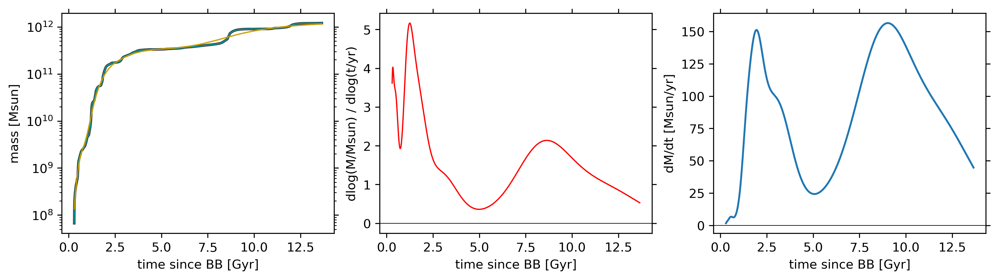

In [12]:
""" for host, convert Mvir(t) to Mpeak(<t), gaussian-smooth and interpolate to get dMpeak/dt """

# first get Mvir(t) from rockstar at snapshots where halo exists and has "ok" flag == True according to additional symlib sanity checks 
ok = r[0,:]["ok"] # 0th first index is for host 
Mvir = r[0,ok]["m"] # Mvir(t) from rockstar at snapshots where halo exists / is "ok" 

# at every snap, replace Mvir with Mpeak(<snap) with this list comprehension
Mpeak = [Mvir[0]] + [np.max(Mvir[:i+1]) for i in range(1,len(scale[ok]))]

# now apply a gaussian filter to ensure monotonicity and that dMpeak/dt cannot be negative 
Msmooth = 10**gaussian_filter1d(np.log10(Mpeak),10,mode='nearest')

# now fit cubic spline to log(M/Msun) vs log(t/yr)
time_yr = time*1e9 # Gyr to yr
interp_logMsmooth = InterpolatedUnivariateSpline(np.log(time_yr[ok]),np.log(Msmooth),k=3,ext=3)

# now take derivative of spline using its well-defined derivative function
# this is dlog(M/Msun)/dlog(t/yr) -- to convert to dM/dt in Msun/yr, you multiply by Mhalo(t)/t
interp_dlogM_dlogt = interp_logMsmooth.derivative()

fig, axes = plt.subplots(nrows=1,ncols=3,figsize=(11,3),constrained_layout=True,dpi=300)

interp_logt = np.linspace(np.log(time_yr[ok][0]),np.log(time_yr[ok][-1]),1000)

axes[0].plot(time[ok],r[0,ok]['m'],c='k',lw=2,alpha=0.8)
axes[0].plot(time[ok],Mpeak,c='c',lw=1,alpha=0.7)
axes[0].plot(time[ok],Msmooth,c='r',lw=1,alpha=0.7)
axes[0].plot(np.exp(interp_logt)*1e-9,np.exp(interp_logMsmooth(interp_logt)),'y-',alpha=0.8,lw=1)
axes[0].set_yscale('log')
axes[0].set_ylabel('mass [Msun]')

axes[1].plot(np.exp(interp_logt)*1e-9,interp_dlogM_dlogt(interp_logt),'r-',lw=1)
axes[1].axhline(0,color='k',lw=0.5) # note how the savitzky-golay version can end up with negative dM/dt for window_length same as sigma of gaussian_filter1d
axes[1].set_ylabel('dlog(M/Msun) / dlog(t/yr)')

### convert dlogM/dlogt to Msun/yr by multiplying by M(t)/t
axes[2].plot(np.exp(interp_logt)*1e-9,interp_dlogM_dlogt(interp_logt)*np.exp(interp_logMsmooth(interp_logt))/(np.exp(interp_logt)))
axes[2].axhline(0,color='k',lw=0.5)
axes[2].set_ylabel('dM/dt [Msun/yr]')

for ax in axes:
    ax.set_xlabel('time since BB [Gyr]')

In [13]:
""" other host halo interpolators that I need """

# faster to interpolate than do cosmology root-finding calculation; ext=3 means return boundary values at ends
interp_redshift = InterpolatedUnivariateSpline(time,1/scale-1,k=3,ext=3) # this can be done at all times regardless of "ok"

interp_logRvir = InterpolatedUnivariateSpline(time[ok],gaussian_filter1d(np.log(r[0,ok]['rvir']),10,mode='nearest'),k=3,ext=3) # proper kpc

Vvir_rockstar = np.sqrt(const.G * r[0,ok]['m']*u.Msun / (r[0,ok]['rvir']*u.kpc)).to('km/s').value # km/s
interp_logVvir = InterpolatedUnivariateSpline(time[ok],gaussian_filter1d(np.log(Vvir_rockstar),10,mode='nearest'),k=3,ext=3)

interp_logcNFW = InterpolatedUnivariateSpline(time[ok],gaussian_filter1d(np.log(r[0,ok]['cvir']),10,mode='nearest'),k=3,ext=3) # dimensionless

### From Austen -- just a placeholder for subhalo distance of host which is meaningless, but can be evaluated within integrator
interp_rsub_savgolay = InterpolatedUnivariateSpline(time[ok],savgol_filter(99*np.ones(r[0,ok].shape[0]) ,window_length=5,polyorder=4),k=3,ext=3) # proper kpc

### New Viraj: vmax for subhalos mostly for ram pressure stripping 
interp_logVmax = InterpolatedUnivariateSpline(time[ok],gaussian_filter1d(np.log(r[0,ok]['vmax']),10,mode='nearest'),k=3,ext=3) # dimensionless

### New Viraj: just a placeholder for orbital velocity (this is meaningless for central halo, only makes sense for subhalos)
vorb_vec = r[0,ok]['v'] # subhalo velocity vector (vx,vy,vz) relative to host central velocity in proper km/s
vorb = np.sqrt(np.sum(vorb_vec**2,axis=1)) # total magnitude of subhalo orbital velocity vector [proper km/s]
interp_vorb = InterpolatedUnivariateSpline(time[ok],savgol_filter(vorb,window_length=5,polyorder=4),k=3,ext=3)


In [14]:
###### UV background suppression of fb*Mdot_vir (relevant for m10 halos)

# First compute the "Filtering Mass" at which halos accrete only half of the incoming baryon fraction fb*Mdot_vir (Gnedin+00)
# The following is basically copied from Rachel's SAM code (module = stars.cc)
# This is the analytic model from Appendix B of Kravtsov+04

def m_filt(z, z_overlap=9.0, z_reionize=3.5, z_squelch=8.0):
    # from Rachel's param.sample, follows Kravtsov+04 appendix B
    # z1=z_overlap, z2=z_reionize, z_squelch = when suppression ('squelching') turned on
    # Rachel tuned these parameters to reproduce Okamoto+08, so do not over-interpret parameter names or modify values
    # NOTE: I should probably re-write this so the parameters reflect their intended meaning (eg z_reionize >> 3.5)
    
    a_o = 1.0/(1+z_overlap) # scale factor where multiple HII regions BEGIN TO overlap
    a_r = 1.0/(1+z_reionize) # scale factor of complete reionization
    a = 1.0 / (1+z) # current scale factor
    
    # Jeans mass in Msun; 0.59 is mean molecular weight
    m_jeans = 2.5E11 * cosmo.h**-1 * np.sqrt(cosmo.Om0)**-1 * (0.59)**-1.5 
    
    alpha = 6.0 # power that controls growth rate of UV background flux (Kravtsov+04 fixed alpha=6)
    
    if a < a_o:
        f_a = (3.0 * a / ((2.0+alpha)*(5.0+2.0*alpha))) * (a/a_o)**alpha
    elif a >= a_o and a <= a_r: 
        f_a = (3.0/a)*a_o**2*(1.0/(2+alpha) - (2*(a/a_o)**-0.5)/(5+2*alpha)) + a**2/10. - (a_o**2/10.)*(5-4*(a/a_o)**-0.5)
    elif a > a_r: 
        f1 = a_o**2*(1/(2+alpha) - 2*(a/a_o)**-0.5/(5+2*alpha))
        f2 = a_r**2/10.*(5-4*(a/a_r)**-0.5)
        f3 = a_o**2/10.*(5-4*(a/a_o)**-0.5)
        f4 = a*a_r/3. - a_r**2/3.*(3-2*(a/a_r)**-0.5)
        f_a = 3.0/a * (f1 + f2 - f3 + f4)
        
    mf = m_jeans * f_a**1.5
    
    # constant from Rachel's stars.cc implementation
    # this ensures Mfilt defined in this way matches the Okamoto+08 "M_characteristic" definition normalization
    Mfilt_factor = 0.0933 
    
    return Mfilt_factor * mf

# Next compute the actual suppression factor f_UV that depends on the filtering mass 
# Halos with Mvir >> Mfilt will have f_UV ~ 1 (no suppression), whereas much lower mass halos tend to f_UV ~ 0
# This is eqn (1) of Okamoto+08 who studied the UV background in hydro simulations
# NOTE: I should update this to use Faucher-Giguere+09 (or 18) to be consistent with FIRE
def collapse_fraction(m,mfilt):
    alpha = 2.0
    
    fcoll = (1+(2**(alpha/3.)-1.)*(m/mfilt)**-alpha)**(-3/alpha)
    
    return fcoll

In [15]:
""" interpolate sutherland & dopita 93 CIE cooling function """

# read the cooling table
# rows = temperature, columns = gas metallicities log(Z/Zsun), units = erg cm^3 / s
tcool = Table.read('newcool.dat',format='ascii',
                   names=('logT','-99','-3','-2','-1.5','-1.0','-0.5','0.0','0.5',))
# first convert tcool astropy Table into a 2D numpy array (this is the most elegant, easiest way I found to do this)
# NOTE: I omitted logZ=-99 to make interpolation easier since logZ=-99 (metal-free) is similar to logZ=-3 (extremely metal-poor)
arr_coolfunc = tcool.to_pandas().to_numpy(dtype='float')[:,2:]
# set up the (logT, logZ) meshgrid corresponding to each point in the 2D cooling function array
logT_bins = np.asarray(tcool['logT'])
logZ_bins = np.array(tcool.colnames[2:],dtype='float')
logT_mesh, logZ_mesh = np.meshgrid(logT_bins, logZ_bins) # for scatter plot 

# create linear 2D interpolator function (use 'nearest neighbor' extrapolation outside input range)
coolfunc_sd93 = interp2d(logT_bins, logZ_bins, arr_coolfunc.T, kind='linear', fill_value=None) 

# this seems better behaved for pairs (logT,logZ)
rgi_sd93 = RegularGridInterpolator((logT_bins,logZ_bins),arr_coolfunc,method='nearest',bounds_error=False,fill_value=None)

### test evaluation for a given (logT, logZcgm)
coolfunc_sd93(6.0,-1.0),rgi_sd93((6.0,-1.0)) # Lambda in erg*cm**3/s for CGM that has T=1e6 K and Zcgm=0.1Zsun everywhere

(array([-22.59]), array(-22.59))

In [16]:
"""
Fitting functions for free model parameters.
These are power laws where both the normalization and slope can depend on redshift.
The default values are motivated by Pandya+22 but they are designed to be varied. 
"""

def get_tdep(Vvir,redshift,A=3.0,alpha0=-3.0,alphaz=0.0,beta=-0.7): 
    """
    Returns ISM gas depletion time in Gyr for halo with Vvir [km/s] and redshift [dimensionless]
    Power law whose normalization and slope both can depend on redshift
    """
    alpha = alpha0 + alphaz*(1+redshift) 
    return A * (Vvir/125.)**alpha * (1+redshift)**beta

def get_etaM_ism(Vvir,redshift,A=1.0,alpha0=-3.7,alphaz=0.0,beta=2.4):
    """
    Returns ISM mass loading factor [dimensionless] for halo with Vvir [km/s] and redshift [dimensionless]
    Power law whose normalization and slope both can depend on redshift
    """    
    alpha = alpha0 + alphaz*(1+redshift)
    return A * (Vvir/125.)**alpha * (1+redshift)**beta

def get_etaE_ism(Vvir,redshift,A=0.1,alpha0=-0.5,alphaz=0.0,beta=0.0): # March 2023 -- this is not designed to be consistent with get_vB_ism
    """
    Returns ISM energy loading factor [dimensionless] for halo with Vvir [km/s] and redshift [dimensionless]
    Power law whose normalization and slope can both depend on redshift
    
    We don't want etaE to exceed 1 (which it might for certain slopes and normalizations) so we use np.minimum
    """
    alpha = alpha0 + alphaz*(1+redshift) 
    # hard check to see if float vs. array, so it works with both integrators right now
    if isinstance(Vvir, np.ndarray):
        etaE = A * (Vvir/125.)**alpha * (1+redshift)**beta 
        etaE[etaE > 1] = 1 
        return etaE 
    
    return np.min([A * (Vvir/125.)**alpha * (1+redshift)**beta, 1.0])


def get_etaZ_ism(Vvir,redshift,A=0.5,alpha0=0.0,alphaz=0.0,beta=0.0): # this is the Carr/Bryan approach for increasing Zwind > Zism 
    """
    Returns ISM metal loading factor [dimensionless] for halo with Vvir [km/s] and redshift [dimensionless] 
    Power law whose normalization and slope can both depend on redshift
    
    We don't want etaZ to exceed 1 (which it might for certain slopes and normalizations) so we use np.minimum
    """
    
    alpha = alpha0 + alphaz*(1+redshift)
    # hard check to see if float vs. array, so it works with both integrators right now
    if isinstance(Vvir, np.ndarray):
        etaZ = A * (Vvir/125.)**alpha * (1+redshift)**beta
        etaZ[etaZ > 1] = 1 
        return etaZ 

    return np.min([A * (Vvir/125.)**alpha * (1+redshift)**beta, 1.0]) 


def get_Zin_halo(Vvir,redshift,A=0.25,alpha0=2.2,alphaz=0.0,beta=-1.3):
    """
    Returns metal mass fraction of inflowing gas at Rvir for halo with Vvir [km/s] and redshift [dimensionless]
    Power law whose normalization and slope both can depend on redshift
    NOTE: we multiply the return value by 0.02 since the fiducial FIRE-2 calibrated parameters give Zin_halo in units of Zsun=0.02
    """      
    alpha = alpha0 + alphaz*(1+redshift)
    return 0.02 * A * (Vvir/125.)**alpha * (1+redshift)**beta

def get_fprev(Vvir,fmin=0.25,fmax=0.9641,fscale=-7.1348,fpivot=1.8775):
    """
    Returns halo gas accretion suppression factor [dimensionless] for halo with Vvir [km/s]
    Generalized logistic function
    """      
    return fmin + (fmax - fmin) / (1.0 + np.exp(fscale*(np.log10(Vvir) - fpivot)))    
    

In [17]:
def analytic_n0(Mcgm,Rvir,alpha_n):
    Rvir = Rvir * kpc_to_cm
    return (3+alpha_n)*Mcgm*Rvir**(alpha_n) / (4*np.pi * 0.59*const_mp * (Rvir**(3+alpha_n) - (0.1*Rvir)**(3+alpha_n))) # cm**-3

def analytic_T0(Ecgm,Rvir,n0,alpha_n,alpha_T):
    Rvir = Rvir * kpc_to_cm
    T0_est = (alpha_n+alpha_T+3)*Rvir**(alpha_n+alpha_T) * Ecgm / (6*np.pi*n0*const_kB*(Rvir**(alpha_n+alpha_T+3)-(0.1*Rvir)**(alpha_n+alpha_T+3))) # K
    # return np.nan_to_num(T0_est,nan=1,posinf=1,neginf=1) # at early times when Mcgm=0, n0=0 so T0=nan; return 1K
    return T0_est

In [524]:
"""
Set up the integrator function 
This should return the Mdot's at each timestep
"""



def integrator(logt, logy, parameters, tree_interpolators):
    
    # unpack the log10 state variables and raise to power 10 

    M_star = 10**logy[0]
    M_ism = 10**logy[1]
    M_cgm = 10**logy[2]
    Eth_cgm = 10**logy[3]
    MZ_star = 10**logy[4]
    MZ_ism = 10**logy[5]
    MZ_cgm = 10**logy[6]
    
    # also raise the log10(t/sec) to power of 10 and convert to Gyr for interpolation functions
    t_Gyr = 10**logt * s_to_yr * 1e-9 
    
    # unpack our SAM's free parameters
    alpha_n = parameters['alpha_n']
    alpha_T = parameters['alpha_T']
    tau_escape = parameters['tau_escape']
    f_recycle = parameters['f_recycle']
    e_wind_halo = parameters['e_wind_halo']
    yZ = parameters['yZ']
    etaM_A = parameters['etaM_A']
    etaM_alpha0 = parameters['etaM_alpha0']
    etaM_alphaz = parameters['etaM_alphaz']
    etaM_beta = parameters['etaM_beta']    
    tdep_A = parameters['tdep_A']
    tdep_alpha0 = parameters['tdep_alpha0']   
    tdep_alphaz = parameters['tdep_alphaz']   
    tdep_beta = parameters['tdep_beta']    
    etaE_A = parameters['etaE_A']
    etaE_alpha0 = parameters['etaE_alpha0']
    etaZ_A = parameters['etaZ_A']
    etaZ_alpha0 = parameters['etaZ_alpha0']
    etaZ_alphaz = parameters['etaZ_alphaz']
    etaZ_beta = parameters['etaZ_beta']    
    alpha_prev = parameters['alpha_prev'] 
    return_all = parameters['return_all']
    
      # unpack tree_interpolators (note the order of the returned list elements in read_trees/interpolate_trees.py module)
    interp_redshift, interp_logMAH, interp_logMvir, interp_logRvir, interp_logVvir, interp_logcNFW = tree_interpolators  
    
    # get Mdot_in_dm, Vvir and other quantities at this time using my interpolator functions 
    # I do .item() since scipy returns 0d array instead of scalar because of some convention ... 
    redshift = interp_redshift(t_Gyr).item() # dimensionless    
    logMAH = interp_logMAH(np.log(t_Gyr*1e9)).item() # dlogM/dlogt 
    Mvir = np.exp(interp_logMvir(np.log(t_Gyr*1e9))).item() # Msun
    Mdot_vir = logMAH * (Mvir/(t_Gyr*1e9)) # MAR in Msun/yr = dlnM/dlnt * (M/t)
    Rvir = np.exp(interp_logRvir(t_Gyr)).item() # proper kpc
    Vvir = np.exp(interp_logVvir(t_Gyr)).item() # proper km/s
    NFW_c = np.exp(interp_logcNFW(t_Gyr)).item() # dimensionless NFW halo concentration = Rvir/Rs_klypin
    
    # print('---------> logt=%s, t_Gyr=%s, redshift=%s'%(logt,t_Gyr,redshift))
    # print('logy=%s'%logy)        
    # print('logMAH=%s,Mvir=%.2e,Mdot_vir=%s,Rvir=%s,Vvir=%s,c=%s'%(logMAH,Mvir,Mdot_vir,Rvir,Vvir,NFW_c))
    
    # print(log
    
    
    # compute gas free-fall radius rff = radius of Vmax ~ 2.16*Rscale ~ 2.16 * Rvir/cNFW 
    rff = 2.16 * (Rvir / NFW_c) / Rvir # in units of Rvir
    
    # compute any other global halo quantities 
    Tvir = 35.9 * Vvir**2 # K 
    evir_halo = 3/2. * const_kB * Tvir / (0.59*const_mp) # erg/Msun  
    tdyn_halo = Rvir / (Vvir * 1e5*cm_to_kpc / (s_to_yr*1e-9)) # Gyr
    
    # analytic formula for NFW Vcirc(rff:=r/Rvir) rom Mo, van den Bosch & White eqn 11.26
    NFW_vcirc_num = np.log(1+NFW_c*rff) - NFW_c*rff/(1+NFW_c*rff)
    NFW_vcirc_den = rff*(np.log(1+NFW_c)-NFW_c/(1+NFW_c))
    NFW_vcirc = Vvir*np.sqrt(NFW_vcirc_num/NFW_vcirc_den) # km/s
    tdyn_ism = rff*Rvir / (NFW_vcirc * 1e5*cm_to_kpc / (s_to_yr*1e-9)) # Gyr
    
    # get SF and ISM wind scalings from FIRE 
    tdep_ism = get_tdep(Vvir,redshift,A=tdep_A,alpha0=tdep_alpha0,alphaz=tdep_alphaz,beta=tdep_beta) # Gyr 
    etaM_ism = get_etaM_ism(Vvir,redshift,A=etaM_A,alpha0=etaM_alpha0,alphaz=etaM_alphaz,beta=etaM_beta) # dimensionless
    etaE_ism = get_etaE_ism(Vvir,redshift,A=etaE_A,alpha0=etaE_alpha0,alphaz=0.0,beta=0.0) # dimensionless    
    etaZ_ism = get_etaZ_ism(Vvir,redshift,A=etaZ_A,alpha0=etaZ_alpha0,alphaz=etaZ_alphaz,beta=etaZ_beta) # dimensionless    

    # new FIRE Zdot/Mdot scalings for chemical evolution modeling
    Zin_halo = get_Zin_halo(Vvir,redshift) # dimensionless Zdot/Mdot (*not* normalized to Zsun)
    
    # compute log10 of CGM metallicity normalized to Zsun for cooling function
    log_Zcgm = np.log10(MZ_cgm / M_cgm / 0.02)
        
    ### compute Mdot_in_halo and Edot_in_halo terms 
    # first f_UV for UVB photoionization suppression of halo inflows
    Mfilt = m_filt(z=redshift)
    f_UV = collapse_fraction(Mvir,Mfilt)  
    
    # f_prev due to SN wind shock heating 
    # in the future will add zeta=Edot_out_halo_previous / (evir_halo*Mdot_in_halo) here 
    
    # assume this gas accretion brings in specific energy = evir_halo
    # f_prev will be computed and multiply both of these inflow rates AFTER we compute the halo energy outflow rate below
    Mdot_in_halo = f_UV * f_b * Mdot_vir # Msun/yr
    Edot_in_halo = Mdot_in_halo * evir_halo / yr_to_s # erg/s 
    
    ### compute Edot_cool and Mdot_cool terms
    # first get n0 for density profile and T0 for temperature profile (this can be done analytically)
    rarr = np.logspace(np.log10(0.1),np.log10(1.0),100)    

    n0_val = analytic_n0(M_cgm,Rvir,alpha_n) # cm**-3
    T0_val = analytic_T0(Eth_cgm,Rvir,n0_val,alpha_n,alpha_T) # K
    
    # now construct density and temperature profiles
    n_rarr = n0_val * rarr**alpha_n # cm**-3        
    T_rarr = T0_val * rarr**alpha_T # K  

    ##### NEW FOR AUSTEN -- USE CIE SD93 COOLING FUNCTION -- this is just a scalar number, no longer an array, so easier/faster to work with
    # halo_coolfunc = 10**coolfunc_sd93(np.log10(T0_val),log_Zcgm).item() # erg*cm**3/s 
    halo_coolfunc = 10**rgi_sd93((np.log10(T0_val),log_Zcgm)).item() # erg*cm**3/s
    # print('coolfunc=%s, T0_val=%s'%(halo_coolfunc,T0_val))
    
    # compute the Edot_cool integral, being careful with units (negative Edot_cool is OK, just means net heating)
    Edot_cool = trapz(y=4*np.pi*(rarr*Rvir*kpc_to_cm)**2*(n_rarr)**2*halo_coolfunc,x=rarr*Rvir*kpc_to_cm) # erg/s    
    
    # limit catastrophic cooling by taking minimum of Edot_cool and Eth/tff since CGM cannot lose energy faster than grav collapse (radiating away grav PE)
    Edot_cool = np.min([Edot_cool,Eth_cgm/(tdyn_halo*1e9*yr_to_s)])
    
    # compute an effective tcool as Energy_cgm / Edot_cool
    tcool_eff = (Eth_cgm / Edot_cool)*s_to_yr*1e-9 # Gyr    

    # compute effective free-fall time at pre-defined radius rff 
    tff_eff = (rff*Rvir*kpc_to_cm*1e-5 / NFW_vcirc)*s_to_yr*1e-9 # Gyr        

    # compute Mdot_cool as M_cgm / t_accrete where t_accrete = tcool,eff + tff,eff
    t_accrete = tcool_eff + tff_eff # Gyr
    Mdot_cool = M_cgm / (t_accrete*1e9) # Msun/yr        

    # print('Mdot_cool=%.1e, Edot_cool=%.1e, Eth/tdyn_halo=%.1e'%(Mdot_cool,Edot_cool,Eth_cgm/(tdyn_halo*1e9*yr_to_s)))
    
    ### compute SFR term
    Mdot_sfr = M_ism / (tdep_ism*1e9) # Msun/yr
    
    ### compute Mdot_wind and Edot_wind terms
    Mdot_wind = etaM_ism * Mdot_sfr # Msun/yr
    
    # March 2023 -- switch from parameterized vB back to parameterized etaE for computing Edot_wind 
    Edot_wind = etaE_ism * ((1e51/100.) * (Mdot_sfr/yr_to_s)) # erg/s
        
    ####### At z>8.989, no cooling tables so Mdot_cool = 0 hence M_ism can become negative (SFR still gets calculated e Mism/tdep)
    ## set Mdot_sfr = 0 and Mdot_wind = 0 otherwise ODE solver will try to accommodate this with crazy small timesteps
    # another hack: also enforce this when Mism < 1e3 and Mdot_cool=0.0 which happens at early times in the dwarfs
    # if redshift > 8.989 or (M_ism < 1e3 and Mdot_cool == 0.0): 
    #     Mdot_sfr = 0.0
    #     Mdot_wind = 0.0
    #     etaE_ism = 0.0
    
    
    ### compute Edot_out_halo and Mdot_out_halo terms 
    Ebind_cgm = evir_halo * M_cgm # erg
    Delta_Ecgm = Eth_cgm - Ebind_cgm # erg
    Edot_out_halo = np.max([0.0,Delta_Ecgm]) / (tau_escape*tdyn_halo*1e9*yr_to_s) # erg/s
    Mdot_out_halo = (Edot_out_halo/s_to_yr) / (e_wind_halo*(Eth_cgm/M_cgm)) # Msun/yr
    
    ### Go back and compute f_prev to reduce Mdot_in_halo and Edot_in_halo due to preventative feedback 
    # f_prev = np.min([1.0,kappa_heat * (Edot_out_halo / Edot_in_halo)])
    
    ### Nov 14 2022 -- parameterized fthermal_wind, fthermal_accretion, fprev
    f_prev = get_fprev(Vvir)#,redshift)
    
    # Carr+23/Pandya+20 style version where f_prev depends on ratio of Edot_out_halo and Edot_in_halo in the absence of preventative feedback
    # f_prev = np.min([alpha_prev * Edot_in_halo/Edot_out_halo, 1.0])
    
    Mdot_in_halo *= f_prev 
    Edot_in_halo *= f_prev 
        
    ##### New chemical evolution MZdot's 
    Zcgm = MZ_cgm / M_cgm # metal mass fraction of CGM (not normalized to solar and not log10)
    Zism = MZ_ism / M_ism # metal mass fraction of ISM     
    
    MZdot_sfr = Zism*(1.0-f_recycle)*Mdot_sfr # new long-lived stellar mass has same metallicity as ISM
    MZdot_cool = Zcgm*Mdot_cool # metal inflow rate from CGM to ISM
    MZdot_yield = yZ*Mdot_sfr # new metal mass produced by both short- and long-lived stars 
    MZdot_wind = Zism*Mdot_wind + etaZ_ism*MZdot_yield # metal outflow rate of ISM wind
    MZdot_in_halo = Zin_halo*Mdot_in_halo # metal inflow rate into CGM from cosmic accretion
    MZdot_out_halo = Zcgm*Mdot_out_halo # metal outflow rate from overpressurized halo
    
    ### Finally combine and return the total derivatives for the state variables (in the same order as y)
    # FIRST: since the time array (hence dt) will be in sec, convert all of these to Msun/s and erg/s
    Mdot_sfr_longlived = (1.0-f_recycle)*Mdot_sfr / yr_to_s # Msun/s
    Mdot_ism = (Mdot_cool - (1.0-f_recycle)*Mdot_sfr - Mdot_wind) / yr_to_s # Msun/s 
    Mdot_cgm = (Mdot_in_halo - Mdot_cool + Mdot_wind - Mdot_out_halo) / yr_to_s # Msun/s 
    Edot_cgm_th = Edot_in_halo - Edot_cool + Edot_wind - Edot_out_halo # erg/s
    MZdot_star = MZdot_sfr / yr_to_s # Msun/s
    MZdot_ism = (MZdot_cool + MZdot_yield - MZdot_sfr - MZdot_wind) / yr_to_s # Msun/s
    MZdot_cgm = (MZdot_in_halo - MZdot_cool + MZdot_wind - MZdot_out_halo) / yr_to_s # Msun/s
    
    # SECOND: since we are integrating log(state_variable) AND log(time), multiply RHS by 10**t[sec] / 10**state_variable
    #         thus these all become dimensionless logarithmic derivatives dlogX/dlogt
    Mdot_sfr_longlived *= 10**logt / M_star 
    Mdot_ism *= 10**logt / M_ism 
    Mdot_cgm *= 10**logt / M_cgm
    Edot_cgm_th *= 10**logt / Eth_cgm
    MZdot_star *= 10**logt / MZ_star
    MZdot_ism *= 10**logt / MZ_ism
    MZdot_cgm *= 10**logt / MZ_cgm    
    
#     print('---------> logt=%s, t_Gyr=%s, redshift=%s'%(logt,t_Gyr,redshift))
    
#     print('M_star=%s,M_ism=%s,M_cgm=%s,Eth_cgm=%s,Ekin_cgm=%s,MZ_star=%s,MZ_ism=%s,MZ_cgm=%s'%(logy[0],logy[1],logy[2],logy[3],logy[4],logy[5],logy[6],logy[7]))    
    
#     print('Mdot_sfr_longlived=%s,Mdot_ism=%s,Mdot_cgm=%s,Edot_cgm_th=%s,Edot_cgm_kin=%s,MZdot_star=%s,MZdot_ism=%s,MZdot_cgm=%s'%(Mdot_sfr_longlived,Mdot_ism,
#                                                                                                                                   Mdot_cgm,Edot_cgm_th,Edot_cgm_kin,
#                                                                                                                                   MZdot_star,MZdot_ism,MZdot_cgm))
    
#     print('T0=%s,Edot_in_halo_th=%s,Edot_diss=%s,Edot_cool=%s,Edot_wind_th=%s,Edot_out_halo_th=%s'%(T0_val,
#                                                                                                     Edot_in_halo_th*10**logt / Eth_cgm,
#                                                                                                     Edot_diss*10**logt / Eth_cgm,
#                                                                                                     Edot_cool*10**logt / Eth_cgm,
#                                                                                                     Edot_wind_th*10**logt / Eth_cgm,
#                                                                                                     Edot_out_halo_th*10**logt / Eth_cgm))

    if return_all is True:

        return [np.log10(Zism/0.02), M_star, Mdot_sfr]
        # return {'cosmic_age':t_Gyr, # Gyr, really this should be lookbacktime but can do abs(time - age(z=0)) or use interpolator
        #         'Mdot_sfr':Mdot_sfr, # Msun/yr
        #         'log_Zism':np.log10(Zism/0.02),'log_Zstar':np.log10(MZ_star/M_star/0.02)} # in log10 Zsun units

    else: 
        return [Mdot_sfr_longlived, Mdot_ism, Mdot_cgm, Edot_cgm_th, MZdot_star, MZdot_ism, MZdot_cgm]

        

In [269]:
# set up dict of SAM parameters 
parameters = {'return_all':False,
              'alpha_n':-3/2., # slope of CGM density power law
              'alpha_T':0.0, # slope of CGM temperature power law 
              'tau_escape':1.0, # scales the halo outflow timescale tdyn=tau*Rvir/Vvir
              'f_recycle':0.4, # instantaneous stellar-->ISM recycling fraction 
              'e_wind_halo':1.0, # specific energy of halo wind relative to Ecgm/Mcgm              
              'yZ':0.02, # metal yield of 1 SN per 100 Msun of stars formed (2 Msun / 100 Msun = 0.02 for 10 Msun of SN ejecta)
              'etaM_A':0.1,
              'etaM_alpha0':-0.5,
              'etaM_alphaz':0.0,
              'etaM_beta':0.0,
              'tdep_A':3.0,
              'tdep_alpha0':-3.0,
              'tdep_alphaz':0.0,
              'tdep_beta':-0.7,
              'etaE_A':0.3,
              'etaE_alpha0':-0.5,
              'etaZ_A':0.5,
              'etaZ_alpha0':0.0,
              'etaZ_alphaz':0.0,
              'etaZ_beta':0.0,
              'alpha_prev':2.0}

# set up range of integration times: from earliest redshift where we have Wiersma cooling func (z~8.98) to z=0 (t~13.79 Gyr)
# LOGARITHMIC since we are integrating dlogX/dlogt 
z_init = 10.0 # previously z=8.98 
logt_init = np.log10(cosmo.age(z_init).value * 1e9 * yr_to_s) # Gyr to sec
z_final = 1/scale[-1] - 1
logt_final = np.log10(cosmo.age(z_final).value * 1e9 * yr_to_s) 

# set up output times at which to return dense_output -- let's say we want 1000 points between t_init and t_final
logt_eval = np.linspace(logt_init,logt_final,1000)

### initial conditions for state variables -- LOGARITHMIC since we are integrating dlogX/dlogt 
# order: Mstar [Msun], Mism [Msun], Mcgm [Msun], Eth_cgm [erg] MZ_star, MZ_ism, MZ_cgm 
Mcgm_init = 0.5*f_b*np.exp(interp_logMsmooth(np.log(10**logt_init*s_to_yr))) # just say initially the halo has Mcgm ~ half baryon budget (we dont know any better)
Ecgm_init = (Mcgm_init*u.Msun * (np.exp(interp_logVvir(10**logt_init*s_to_yr*1e-9))*u.km/u.s)**2).to('erg').value 
Mstar_init = 1. # arbitrary small number
Mism_init = 1. # arbitrary small number
Z_init = 1e-4 * 0.02 # assume initial metallicity is 1E-4/Zsun, multiply initial masses by this factor to get initial metal *mass*

initial_conditions = np.log10([Mstar_init,Mism_init,Mcgm_init,Ecgm_init,Z_init*Mstar_init,Z_init*Mism_init,Z_init*Mcgm_init])

#### tolerances
# just choose reasonably small ones based on experimentation -- rtol gives requested error on exponent of variables, atol relevant for early evolution
rtol = 1e-5
atol = 1e-3

#### list of tree interpolator functions 
tree_funcs = [interp_redshift,interp_dlogM_dlogt,interp_logMsmooth,interp_logRvir,interp_logVvir,interp_logcNFW]

In [271]:
# run solve_ivp 
ode_method = 'RK23'

tstart = timer()
sol = solve_ivp(integrator,[logt_init,logt_final],initial_conditions,dense_output=True,method=ode_method,
                atol=atol,rtol=rtol,args=(parameters,tree_funcs))

print('\n',sol.message,'solve_ivp took %.3f seconds'%(timer()-tstart),'\n')


 The solver successfully reached the end of the integration interval. solve_ivp took 0.081 seconds 



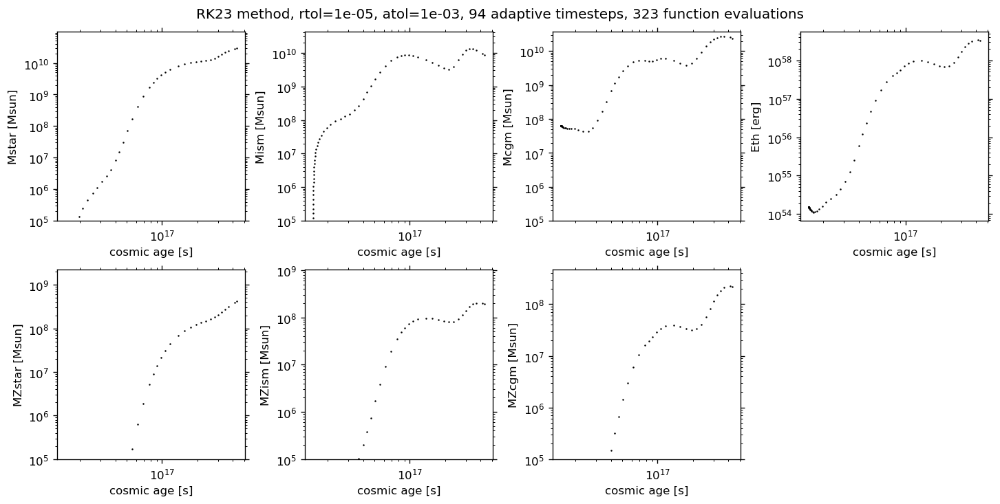

In [272]:
labels = {0:'Mstar [Msun]',1:'Mism [Msun]',2:'Mcgm [Msun]',3:'Eth [erg]',4:'MZstar [Msun]',5:'MZism [Msun]',6:'MZcgm [Msun]'}
          
fig, axes = plt.subplots(nrows=2,ncols=4,figsize=(12,6),constrained_layout=True)
allax = np.ravel(axes)
allax[-1].axis('off')

for varnum in np.arange(7):
    
    allax[varnum].loglog(10**sol.t,10**sol.y[varnum],'k.',ms=3,mec='none')
    allax[varnum].set_xlabel('cosmic age [s]')
    allax[varnum].set_ylabel(labels[varnum])

fig.suptitle('%s method, rtol=%.0e, atol=%.0e, %i adaptive timesteps, %i function evaluations'%(ode_method,rtol,atol,len(sol.t),sol.nfev))

for axnum in [0,1,2,4,5,6]:
    allax[axnum].set_ylim(1e5,None)

# plt.savefig('solve_ivp_logarithmic_%s_%s_benchmark.png'%(halo_name,ode_method),bbox_inches='tight',dpi=150,facecolor='white')

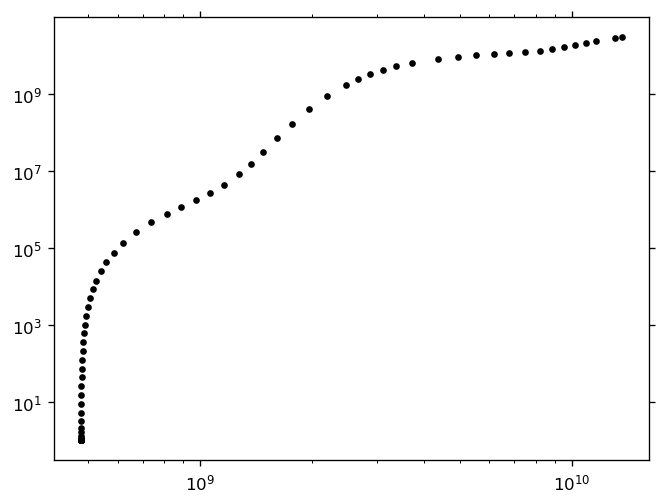

In [349]:
plt.loglog(10**sol.t*s_to_yr,10**sol.y[0],'k.')

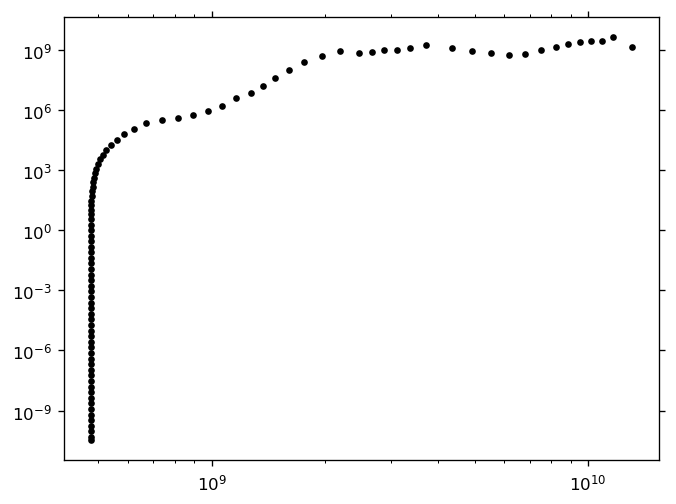

In [571]:
plt.loglog(10**sol.t[:-1]*s_to_yr,np.diff(10**sol.y[0]),'k.')

In [350]:
from synthesizer.filters import FilterCollection
from synthesizer.grid import Grid
from synthesizer.parametric import SFH, Stars, ZDist
from synthesizer.parametric.galaxy import Galaxy
from synthesizer.sed import plot_spectra_as_rainbow
from unyt import Angstrom, Msun, Myr

In [356]:
### downloaded manually bc03 grid from https://flaresimulations.github.io/synthesizer/grids/grids.html
### put it in synthesizer_data 

grid_name = "bc03_chabrier03-0.1,100.hdf5"
grid_dir = "../../synthesizer_data/"
grid = Grid(grid_name, grid_dir=grid_dir, read_lines=False)

In [360]:
grid.metallicity

array([0.0004, 0.001 , 0.004 , 0.008 , 0.019 , 0.03  ])

In [ ]:
grid.log10age

array([ 5.        ,  5.10000158,  5.15000075,  5.19999913,  5.25000014,
        5.30000167,  5.35000172,  5.40000062,  5.45000109,  5.50000169,
        5.55000197,  5.600002  ,  5.65000234,  5.7000024 ,  5.75000207,
        5.80000252,  5.85000259,  5.90000315,  5.95000295,  6.        ,
        6.0200006 ,  6.04000071,  6.05999863,  6.0799984 ,  6.10000158,
        6.12000107,  6.13999866,  6.16000007,  6.17999964,  6.19999913,
        6.22000081,  6.23999979,  6.2599998 ,  6.27999984,  6.2999995 ,
        6.31999873,  6.33999968,  6.36000044,  6.37999947,  6.39999889,
        6.42000033,  6.4400002 ,  6.45999977,  6.47999975,  6.49999895,
        6.51999984,  6.53999893,  6.55999993,  6.57999955,  6.59999981,
        6.6199996 ,  6.63999917,  6.65999982,  6.67999901,  6.69999893,
        6.71999962,  6.73999931,  6.75999929,  6.77999958,  6.79999907,
        6.81999905,  6.83999939,  6.85999942,  6.8799991 ,  6.89999932,
        6.91999908,  6.93999921,  6.95999912,  6.97999882,  6.99

In [569]:
np.abs(10**ode_logt * s_to_yr - Planck15.age(0).to('yr').value)

array([1.00000000e+06, 1.03218848e+06, 1.06541306e+06, 1.09970709e+06,
       1.13510499e+06, 1.17164229e+06, 1.20935568e+06, 1.24828300e+06,
       1.28846333e+06, 1.32993701e+06, 1.37274566e+06, 1.41693225e+06,
       1.46254115e+06, 1.50961813e+06, 1.55821044e+06, 1.60836687e+06,
       1.66013775e+06, 1.71357506e+06, 1.76873244e+06, 1.82566525e+06,
       1.88443064e+06, 1.94508760e+06, 2.00769701e+06, 2.07232173e+06,
       2.13902662e+06, 2.20787863e+06, 2.27894689e+06, 2.35230273e+06,
       2.42801978e+06, 2.50617405e+06, 2.58684398e+06, 2.67011056e+06,
       2.75605736e+06, 2.84477066e+06, 2.93633950e+06, 3.03085581e+06,
       3.12841445e+06, 3.22911336e+06, 3.33305361e+06, 3.44033954e+06,
       3.55107884e+06, 3.66538267e+06, 3.78336577e+06, 3.90514657e+06,
       4.03084730e+06, 4.16059415e+06, 4.29451735e+06, 4.43275134e+06,
       4.57543487e+06, 4.72271117e+06, 4.87472806e+06, 5.03163815e+06,
       5.19359894e+06, 5.36077299e+06, 5.53332813e+06, 5.71143755e+06,
      

In [565]:
10**logy_sol[0,1] - 10**logy_sol[0,0]

-68448.6796951294

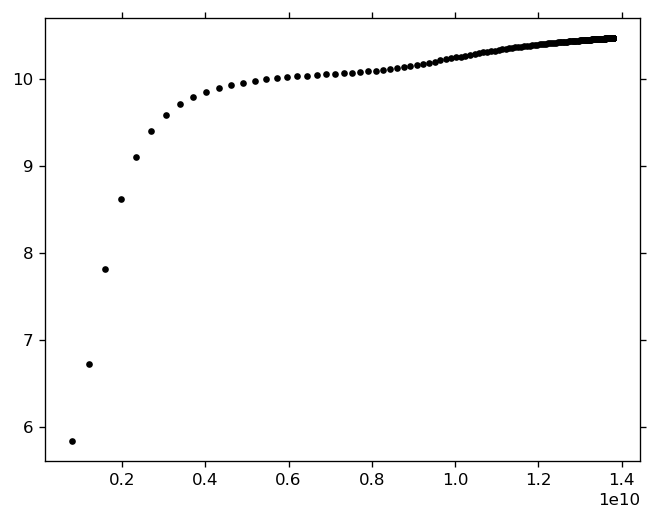

In [575]:
plt.plot(10**ode_logt*s_to_yr,logy_sol[0,:],'k.')

(691663507.1565546, 15910048815.467018)

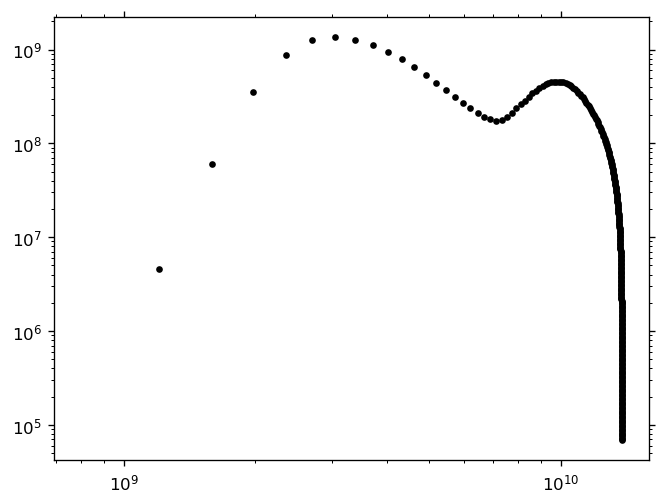

In [589]:
plt.loglog(10**ode_logt[:-1]*s_to_yr,np.abs(np.diff(10**logy_sol[0,:])),'k.')

plt.xlim(691663507.1565546, 15910048815.467018)

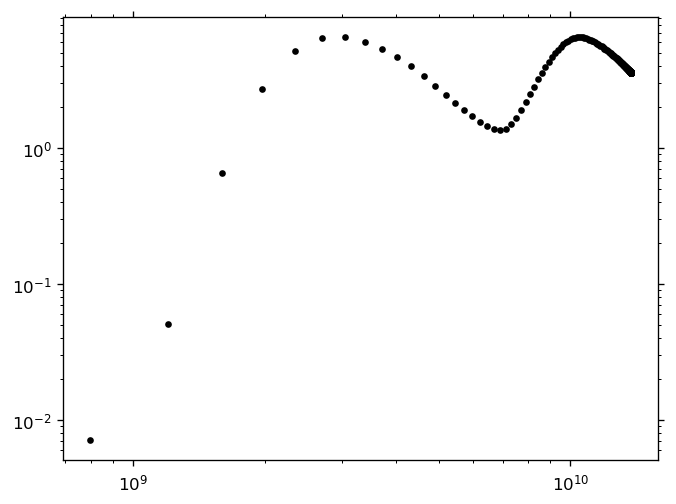

In [592]:
plt.loglog(10**ode_logt*s_to_yr, sfh_out[:,2],'k.')

(691663507.1565546, 15910048815.467018)

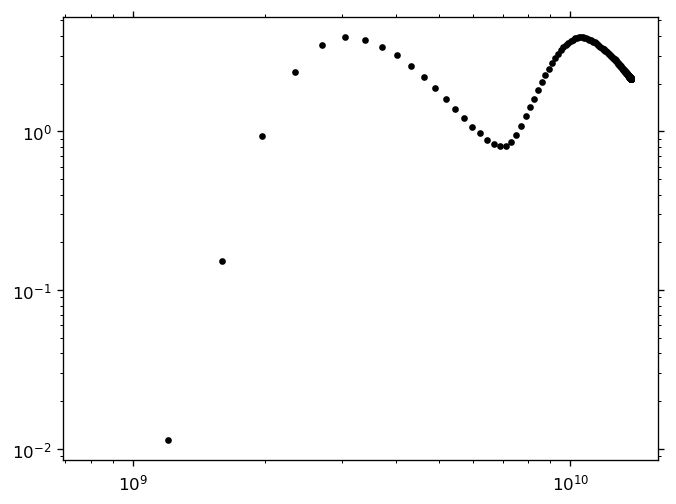

In [591]:
plt.loglog(10**ode_logt[:-1]*s_to_yr,np.abs(np.diff(10**logy_sol[0,:]))/np.abs(np.diff(10**ode_logt*s_to_yr)),'k.')

plt.xlim(691663507.1565546, 15910048815.467018)

In [582]:
10**logy_sol[0,1] - 10**logy_sol[0,0]

-68448.6796951294

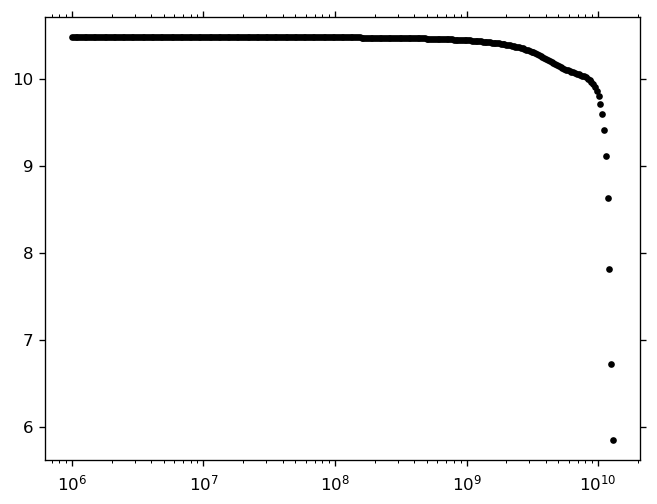

In [576]:
plt.semilogx(tbins,logy_sol[0,:],'k.')

In [797]:
"""
May 28, 2024

save SFH on a 2D age-metallicity grid
This is really just evaluating the integrator function on an arbitrary time (age) and Zstar grid
and have it spit out only the time, SFR and Zstar that then gets reshaped

Additional stuff to think about
0. Chris Lovell said ideally give mstar_formed, not instantaneous SFR. But this is just SFR * delta(t)
1. Chris Lovell said given how simple my SFHs are, really just need list of tuples (age, metallicity, mstar_formed) 
2. Sparse matrix since most entries will be zero (compared to or before dense basis SFH compression?)
3. Instead of storing floats for (age,metallicity) can just store indices to access age-metallicity grid (saves data space)
"""

### From Kartheik/Chris synthesizer ipynb
### https://colab.research.google.com/drive/1IkHg37bDtxspJUeTLi0fIRkjT0S_8VLM?usp=sharing#scrollTo=1nVX3g6Vrin8 

# define metallicity grid -- this is log10(Zism/Zsun) 
logZbins = np.linspace(-2.5,0.6,10)

# generate age grid -- this is lookback time spaced uniformly in log(years) from 1 Myr to 10 Gyr
# this uniform-log spacing makes it so that we have finer age resolution (more bins) at smaller lookback times, less at very high-z
tbins = np.logspace(6,np.log10(13e9),300) # years 

# we want to know Mformed and Zism within these lookback time age bins (e.g., between tbins[0] and tbins[1] years ago)
# for this we need to evaluate ODE solution at these age times, but we need to convert from lookback time to cosmic age in log(seconds)
# converting lookback time to cosmic age is just np.abs(Planck15.age(z=0) - lookback_time), making sure of years units
ode_logt = np.log10(np.abs(Planck15.age(0).to('yr').value - tbins) * yr_to_s) # forward cosmic_age in log seconds

# evaluate logy state variables at these forward cosmic age times
logy_sol = sol.sol(ode_logt)

# now call the ODE integrator function to get the tuples of (log(Zism/Zsun),Mstar,SFR) at each forward age given logy_sol
parameters['return_all'] = True 
sfh_out = np.array([integrator(ode_logt[tsol],logy_sol[:,tsol],parameters,tree_funcs) for tsol in range(len(ode_logt))])

# first two should be nearly equal as long as 
# last one shows that formed mas is ~0.2 dex higher which makes sense since we're dividing by 1-R=0.6
print(logy_sol[0,0], np.log10(np.sum(np.abs(np.diff(sfh_out[:,1])))),np.log10(np.sum(np.abs(np.diff(sfh_out[:,1]/(1-0.4))))))

### Compute formed mass by doing np.diff on Mstar(t) that and divide by (1-R)=0.6 to get back to formed mass history
# this should give mass formed between successive forward cosmic age bins, which is already 1:1-mapped with lookback time tbins
mformed = np.append(np.abs(np.diff(sfh_out[:,1]))/(1-parameters['f_recycle']), 0.0) # append 0.0 at end for highest redshift bin

# finally package this up into tuples (lookback time, log(Zism/Zsun), Mformed)
# note: lookback time is already 1:1 mapped with mformed 
# mformed appears to be smaller at lower redshifts only because our tbins are smaller size at lower redshift
sfh_inputs = np.array([(tbins[i],sfh_out[i][0],mformed[i]) for i in range(len(sfh_out))])

# test: try making the last thing the SFR instead of mformed
# sfh_inputs = np.array([(tbins[i],sfh_out[i][0],sfh_out[i][2]) for i in range(len(sfh_out))])



10.476480326814526 10.476470236718228 10.698318986334584


In [798]:
sfh_inputs[:,1][0]

0.06627608509158027

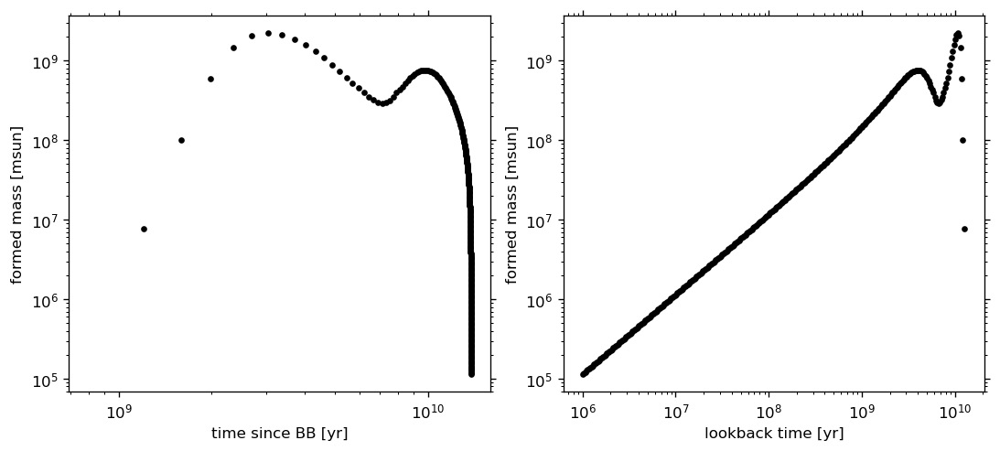

In [799]:
fig, axes = plt.subplots(nrows=1,ncols=2,figsize=(9,4),constrained_layout=True)

axes[0].loglog(10**ode_logt*s_to_yr,mformed,'k.')
axes[0].set_xlabel('time since BB [yr]')

axes[1].loglog(sfh_inputs[:,0], sfh_inputs[:,2],'k.')
axes[1].set_xlabel('lookback time [yr]')

for ax in axes:
    ax.set_ylabel('formed mass [msun]')

In [211]:
### create 1D metal enrichment history time series



In [329]:
Z_indices

array([8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 7, 7, 7,
       7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 7])

In [330]:
age_indices

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100])

In [800]:
### out of curiosity, place output SFH into 2D age-metallicity grid and plot with colormap

# initial empty 2D array of zeros
SFH_grid = np.zeros((len(tbins),len(logZbins))) # mformed in each age--metallicity bin

# digitize age and metallicity bins to find their age and metallicity bin idnices
age_indices = np.digitize(sfh_inputs[:,0],tbins) - 1
Z_indices = np.digitize(sfh_inputs[:,1],logZbins)

# assign Mformed to correspond indices of SFH_grid
SFH_grid[age_indices, Z_indices] = sfh_inputs[:,2]

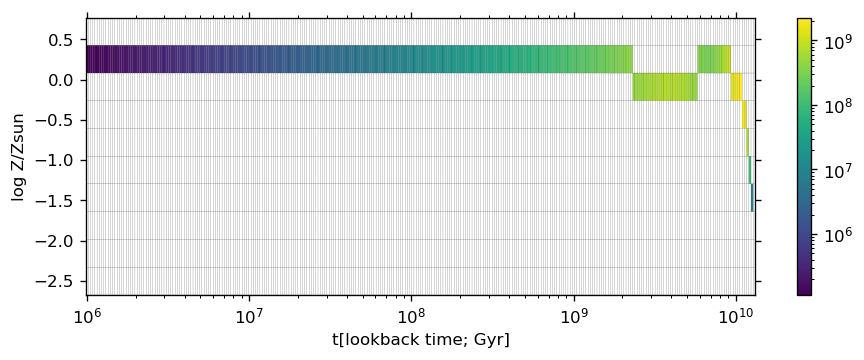

In [801]:
### create a 2D age-metallicity grid color-coded by SFR

plt.figure(figsize=(9,3))
plt.pcolor(tbins,logZbins,  SFH_grid.T,norm=LogNorm(),lw=0.05,edgecolor='k')
plt.xlabel('t[lookback time; Gyr]')
plt.ylabel('log Z/Zsun')
plt.colorbar()
plt.xscale('log')

In [658]:
SFH_grid[0]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 3.56935546, 0.        ])

In [610]:
np.log10(np.sum(sfh_inputs[:,2][sfh_inputs[:,0]<3e9])), np.log10(np.sum(sfh_inputs[:,2]))

(10.184251594630767, 10.698318986334584)

In [613]:
tbins.shape, logZbins.shape, sfh_inputs.shape, SFH_grid.shape

((300,), (10,), (300, 3), (300, 10))

In [374]:
from synthesizer.parametric import SFH, Stars, ZDist
from unyt import Myr


In [375]:
logZ_bins

array([-3. , -2. , -1.5, -1. , -0.5,  0. ,  0.5])

----------
SUMMARY OF BINNED SFZH
median age: 4569.79 Myr
mean age: 5634.25 Myr
mean metallicity: 0.0227
----------



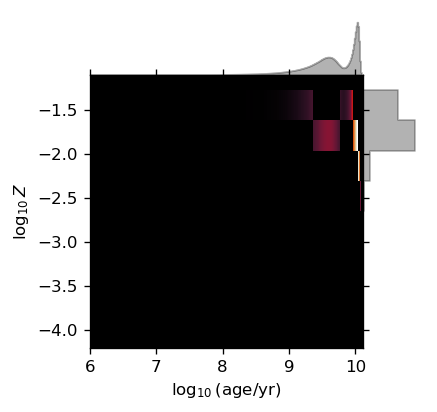

In [802]:
# Create arrays for SFH and ZDist

# log10ages = np.log10(tbins)

sf_hist = np.zeros_like(tbins)
metal_dist = np.zeros_like(logZbins)
# sf_hist[10:15] = 1
# sf_hist[15:20] = 0.5
# metal_dist[5:6] = 1
# metal_dist[6:8] = 0.5

# Get the Stars
arr_stars = Stars(
    log10ages=np.log10(tbins), # should be log10(years)
    metallicities=10**logZbins*0.02, # should just be metal mass fraction, not log10 and no Zsun division
    sfzh = SFH_grid, # should be in units 
    # sf_hist=sf_hist,
    # metal_dist=metal_dist,
    # initial_mass=10**9,
)
print(arr_stars)
fig, ax = arr_stars.plot_sfzh(show=True)

('Constant', 'ExponentialTruncatedExponential', 'LogNormal', 'ExponentiallyyDeclining', 'DelayedExponentiallyDeclining', 'DoublePowerLaw')
('DeltaConstant', 'Normal')
----------
SUMMARY OF PARAMETERISED METAL ENRICHMENT HISTORY
<class 'synthesizer.parametric.metal_dist.Normal'>
mean: 0.0199526231496888
sigma: 0.005
----------

----------
SUMMARY OF PARAMETERISED STAR FORMATION HISTORY
<class 'synthesizer.parametric.sf_hist.LogNormal'>
tau: 0.5
peak_age: 10000 Myr
max_age: 13000 Myr
median age: 8326.00 Myr
mean age: 7800.28 Myr
----------

----------
SUMMARY OF BINNED SFZH
median age: 10000.00 Myr
mean age: 8649.99 Myr
mean metallicity: 0.0097
----------



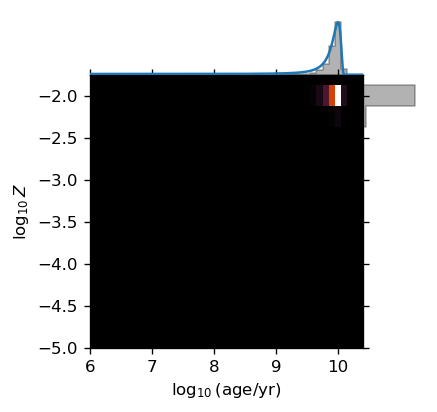

In [714]:
### try a constant or lognormal parametric SFH to debug

print(SFH.parametrisations)
print(ZDist.parametrisations)


# define log10ages and log10metallicities
test_log10ages = np.arange(6.0, 10.5, 0.1)  # log10(age/yr)
test_log10metallicities = np.arange(-5.0, -1.5, 0.25)
test_metallicities = 10**test_log10metallicities

# Define a gaussian function for metallicity
test_metal_dist = ZDist.Normal(mean=10**-1.7,sigma=0.005) # ZDist.DeltaConstant(log10metallicity=-2.0)
print(test_metal_dist)

# Define a Lognormal SFH
test_sfh = SFH.LogNormal(tau=0.5, max_age=13000 * Myr, peak_age=10000 * Myr) #  SFH.Constant(duration=100 * Myr)
print(test_sfh)

# Create the Stars object
const_stars = Stars(
    test_log10ages,
    test_metallicities,
    sf_hist=test_sfh,
    metal_dist=test_metal_dist,
    initial_mass=5e10,
)
print(const_stars)
fig, ax = const_stars.plot_sfzh(show=True)

In [715]:
galaxy2 = Galaxy(const_stars)

np.sum(galaxy2.stars.sfzh)/1e10

4.999999999999998

In [718]:
galaxy2.stars.metallicities

array([1.00000000e-05, 1.77827941e-05, 3.16227766e-05, 5.62341325e-05,
       1.00000000e-04, 1.77827941e-04, 3.16227766e-04, 5.62341325e-04,
       1.00000000e-03, 1.77827941e-03, 3.16227766e-03, 5.62341325e-03,
       1.00000000e-02, 1.77827941e-02])

In [720]:
new_galaxy2 = _load_SCSAM_parametric_galaxy(galaxy2.stars.sfzh,
                                            10**galaxy2.stars.log10ages/1e9,
                                            galaxy2.stars.metallicities,'RGI',grid)

spec2 = new_galaxy2.stars.get_spectra_incident(grid)
spec2

Text(0, 0.5, 'Flux [nJy]')

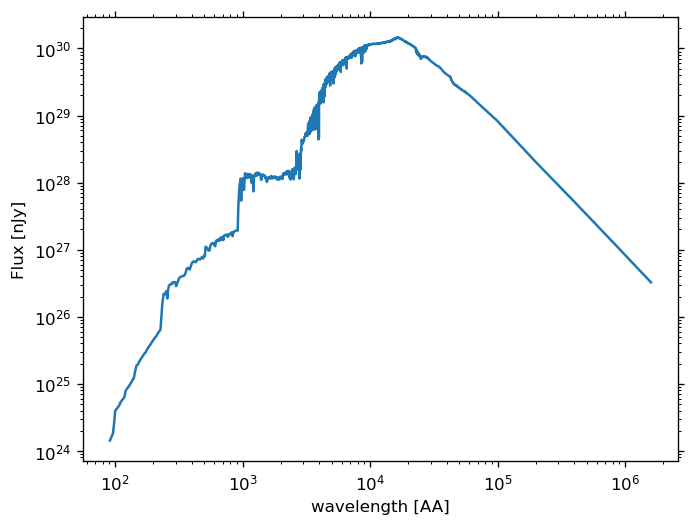

In [721]:
plt.loglog(spec2.lam, spec2.get_fnu(Planck15,0.0,igm=None))

plt.xlabel('wavelength [AA]')
plt.ylabel('Flux [nJy]')

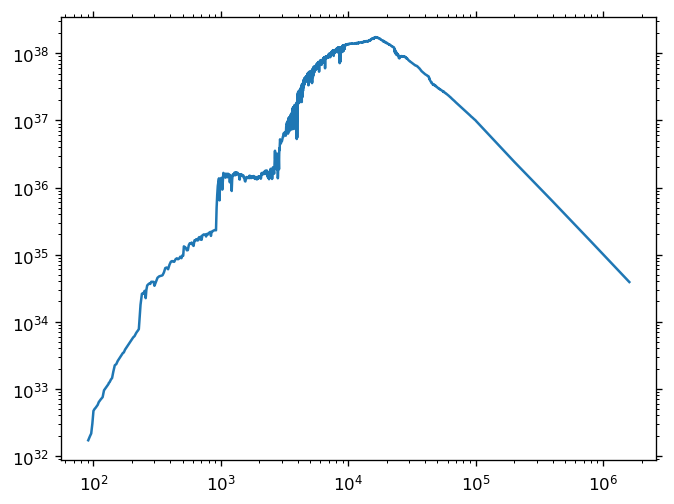

In [722]:
plt.loglog(new_galaxy2.stars.spectra['incident'].lam,new_galaxy2.stars.spectra['incident'].lnu)

('Constant', 'ExponentialTruncatedExponential', 'LogNormal', 'ExponentiallyyDeclining', 'DelayedExponentiallyDeclining', 'DoublePowerLaw')
('DeltaConstant', 'Normal')
----------
SUMMARY OF PARAMETERISED METAL ENRICHMENT HISTORY
<class 'synthesizer.parametric.metal_dist.Normal'>
mean: 0.0199526231496888
sigma: 0.005
----------

----------
SUMMARY OF PARAMETERISED STAR FORMATION HISTORY
<class 'synthesizer.parametric.sf_hist.LogNormal'>
tau: 0.5
peak_age: 10000 Myr
max_age: 13000 Myr
median age: 8326.00 Myr
mean age: 7800.28 Myr
----------

----------
SUMMARY OF BINNED SFZH
median age: 9250.00 Myr
mean age: 8719.20 Myr
mean metallicity: 0.0177
----------



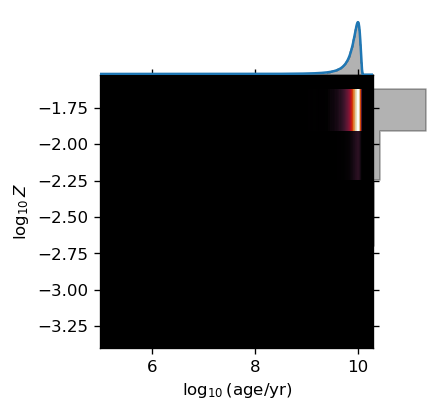

In [727]:
### try a constant or lognormal parametric SFH to debug

print(SFH.parametrisations)
print(ZDist.parametrisations)


# define log10ages and log10metallicities
test_log10ages = grid.log10age # np.arange(6.0, 10.5, 0.1)  # log10(age/yr)
test_metallicities = grid.metallicity # 10**test_log10metallicities
test_log10metallicities = np.log10(test_metallicities) # np.arange(-5.0, -1.5, 0.25)

# Define a gaussian function for metallicity
test_metal_dist = ZDist.Normal(mean=10**-1.7,sigma=0.005) # ZDist.DeltaConstant(log10metallicity=-2.0)
print(test_metal_dist)

# Define a Lognormal SFH
test_sfh = SFH.LogNormal(tau=0.5, max_age=13000 * Myr, peak_age=10000 * Myr) #  SFH.Constant(duration=100 * Myr)
print(test_sfh)

# Create the Stars object
const_stars = Stars(
    test_log10ages,
    test_metallicities,
    sf_hist=test_sfh,
    metal_dist=test_metal_dist,
    initial_mass=5e10,
)
print(const_stars)
fig, ax = const_stars.plot_sfzh(show=True)

In [728]:
galaxy2 = Galaxy(const_stars)

np.sum(galaxy2.stars.sfzh)/1e10

5.0

In [729]:
spec2 = galaxy2.stars.get_spectra_incident(grid)
spec2

Text(0, 0.5, 'Flux [nJy]')

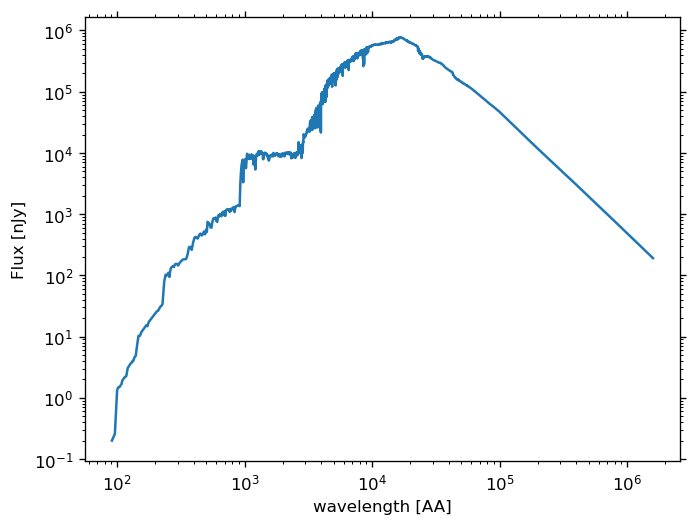

In [762]:
plt.loglog(spec2.lam, spec2.get_fnu(Planck15,0.1,igm=None))

plt.xlabel('wavelength [AA]')
plt.ylabel('Flux [nJy]')

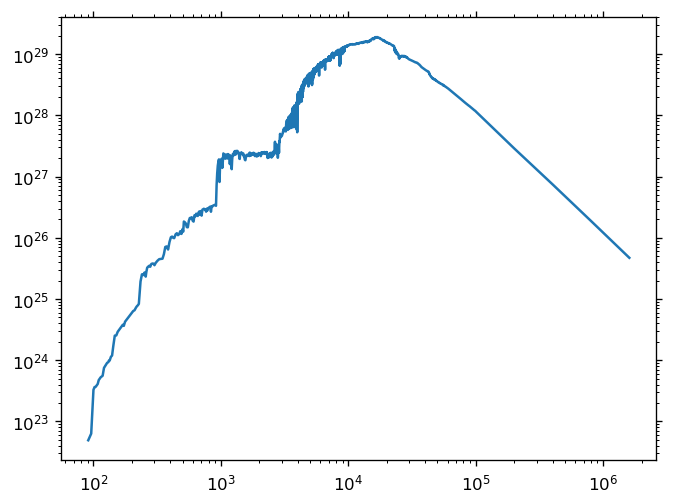

In [733]:
plt.loglog(spec2.lam,spec2.lnu)

In [779]:
"""
May 28, 2024

save SFH on a 2D age-metallicity grid
This is really just evaluating the integrator function on an arbitrary time (age) and Zstar grid
and have it spit out only the time, SFR and Zstar that then gets reshaped

Additional stuff to think about
0. Chris Lovell said ideally give mstar_formed, not instantaneous SFR. But this is just SFR * delta(t)
1. Chris Lovell said given how simple my SFHs are, really just need list of tuples (age, metallicity, mstar_formed) 
2. Sparse matrix since most entries will be zero (compared to or before dense basis SFH compression?)
3. Instead of storing floats for (age,metallicity) can just store indices to access age-metallicity grid (saves data space)
"""

### From Kartheik/Chris synthesizer ipynb
### https://colab.research.google.com/drive/1IkHg37bDtxspJUeTLi0fIRkjT0S_8VLM?usp=sharing#scrollTo=1nVX3g6Vrin8 

# define metallicity grid -- this is log10(Zism/Zsun) 
logZbins = np.log10(grid.metallicity) # np.linspace(-2.5,0.6,10)

# generate age grid -- this is lookback time spaced uniformly in log(years) from 1 Myr to 10 Gyr
# this uniform-log spacing makes it so that we have finer age resolution (more bins) at smaller lookback times, less at very high-z
tbins = 10**grid.log10age # np.logspace(6,np.log10(13e9),300) # years 

# we want to know Mformed and Zism within these lookback time age bins (e.g., between tbins[0] and tbins[1] years ago)
# for this we need to evaluate ODE solution at these age times, but we need to convert from lookback time to cosmic age in log(seconds)
# converting lookback time to cosmic age is just np.abs(Planck15.age(z=0) - lookback_time), making sure of years units
ode_logt = np.log10(np.abs(Planck15.age(0).to('yr').value - tbins) * yr_to_s) # forward cosmic_age in log seconds

# evaluate logy state variables at these forward cosmic age times
logy_sol = sol.sol(ode_logt)

# now call the ODE integrator function to get the tuples of (log(Zism/Zsun),Mstar,SFR) at each forward age given logy_sol
parameters['return_all'] = True 
sfh_out = np.array([integrator(ode_logt[tsol],logy_sol[:,tsol],parameters,tree_funcs) for tsol in range(len(ode_logt))])

#### For all tbins > 13 Gyr, set logy_sol=0 and log10(Z/Zsun)=-6, Mformed=SFR=0
ind_bad = np.where(tbins>13e9)[0]
logy_sol[:,ind_bad] = 0.0
sfh_out[ind_bad,0] = -6.0
sfh_out[ind_bad,1] = 0.0
sfh_out[ind_bad,2] = 0.0

# first two should be nearly equal as long as 
# last one shows that formed mas is ~0.2 dex higher which makes sense since we're dividing by 1-R=0.6
print(logy_sol[0,0], np.log10(np.sum(np.abs(np.diff(sfh_out[:,1])))),np.log10(np.sum(np.abs(np.diff(sfh_out[:,1]/(1-0.4))))))

### Compute formed mass by doing np.diff on Mstar(t) that and divide by (1-R)=0.6 to get back to formed mass history
# this should give mass formed between successive forward cosmic age bins, which is already 1:1-mapped with lookback time tbins
mformed = np.append(np.abs(np.diff(sfh_out[:,1]))/(1-parameters['f_recycle']), 0.0) # append 0.0 at end for highest redshift bin

# finally package this up into tuples (lookback time, log(Zism/Zsun), Mformed)
# note: lookback time is already 1:1 mapped with mformed 
# mformed appears to be smaller at lower redshifts only because our tbins are smaller size at lower redshift
sfh_inputs = np.array([(tbins[i],sfh_out[i][0]+np.log10(0.02),mformed[i]) for i in range(len(sfh_out))])

# test: try making the last thing the SFR instead of mformed
# sfh_inputs = np.array([(tbins[i],sfh_out[i][0],sfh_out[i][2]) for i in range(len(sfh_out))])



10.476508069348405 10.476508069348405 10.698356818964761


/tmp/ipykernel_178482/746022353.py:91: RuntimeWarning: invalid value encountered in scalar divide
  log_Zcgm = np.log10(MZ_cgm / M_cgm / 0.02)
/tmp/ipykernel_178482/1277326743.py:7: RuntimeWarning: invalid value encountered in scalar divide
  T0_est = (alpha_n+alpha_T+3)*Rvir**(alpha_n+alpha_T) * Ecgm / (6*np.pi*n0*const_kB*(Rvir**(alpha_n+alpha_T+3)-(0.1*Rvir)**(alpha_n+alpha_T+3))) # K
/tmp/ipykernel_178482/746022353.py:162: RuntimeWarning: invalid value encountered in scalar divide
  Mdot_out_halo = (Edot_out_halo/s_to_yr) / (e_wind_halo*(Eth_cgm/M_cgm)) # Msun/yr
/tmp/ipykernel_178482/746022353.py:177: RuntimeWarning: invalid value encountered in scalar divide
  Zcgm = MZ_cgm / M_cgm # metal mass fraction of CGM (not normalized to solar and not log10)
/tmp/ipykernel_178482/746022353.py:178: RuntimeWarning: invalid value encountered in scalar divide
  Zism = MZ_ism / M_ism # metal mass fraction of ISM
/tmp/ipykernel_178482/746022353.py:199: RuntimeWarning: divide by zero encountered

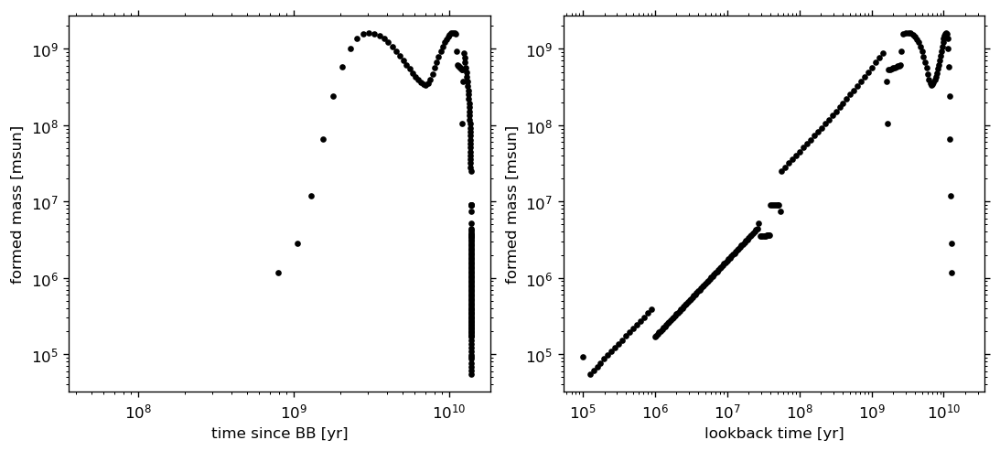

In [763]:
fig, axes = plt.subplots(nrows=1,ncols=2,figsize=(9,4),constrained_layout=True)

axes[0].loglog(10**ode_logt*s_to_yr,mformed,'k.')
axes[0].set_xlabel('time since BB [yr]')

axes[1].loglog(sfh_inputs[:,0], sfh_inputs[:,2],'k.')
axes[1].set_xlabel('lookback time [yr]')

for ax in axes:
    ax.set_ylabel('formed mass [msun]')

In [211]:
### create 1D metal enrichment history time series



In [781]:
logZbins

array([-3.39794001, -3.        , -2.39794001, -2.09691001, -1.7212464 ,
       -1.52287875])

In [783]:
### out of curiosity, place output SFH into 2D age-metallicity grid and plot with colormap

# initial empty 2D array of zeros
SFH_grid = np.zeros((len(tbins),len(logZbins))) # mformed in each age--metallicity bin

# digitize age and metallicity bins to find their age and metallicity bin idnices
age_indices = np.digitize(sfh_inputs[:,0],tbins) - 1
Z_indices = np.digitize(sfh_inputs[:,1],logZbins)

# assign Mformed to correspond indices of SFH_grid
SFH_grid[age_indices, Z_indices] = sfh_inputs[:,2]

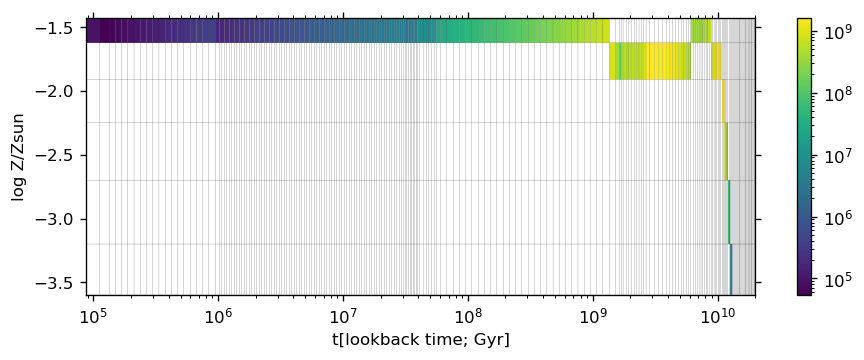

In [784]:
### create a 2D age-metallicity grid color-coded by SFR

plt.figure(figsize=(9,3))
plt.pcolor(tbins,logZbins,  SFH_grid.T,norm=LogNorm(),lw=0.05,edgecolor='k')
plt.xlabel('t[lookback time; Gyr]')
plt.ylabel('log Z/Zsun')
plt.colorbar()
plt.xscale('log')

In [658]:
SFH_grid[0]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 3.56935546, 0.        ])

In [610]:
np.log10(np.sum(sfh_inputs[:,2][sfh_inputs[:,0]<3e9])), np.log10(np.sum(sfh_inputs[:,2]))

(10.184251594630767, 10.698318986334584)

In [613]:
tbins.shape, logZbins.shape, sfh_inputs.shape, SFH_grid.shape

((300,), (10,), (300, 3), (300, 10))

In [374]:
from synthesizer.parametric import SFH, Stars, ZDist
from unyt import Myr


----------
SUMMARY OF BINNED SFZH
median age: 4500.00 Myr
mean age: 5619.55 Myr
mean metallicity: 0.0202
----------



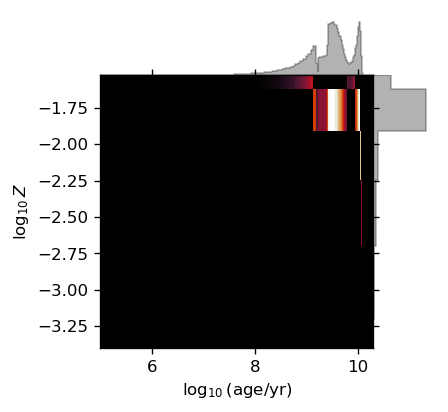

In [789]:
# Create arrays for SFH and ZDist

# log10ages = np.log10(tbins)

sf_hist = np.zeros_like(tbins)
metal_dist = np.zeros_like(logZbins)
# sf_hist[10:15] = 1
# sf_hist[15:20] = 0.5
# metal_dist[5:6] = 1
# metal_dist[6:8] = 0.5

# Get the Stars
arr_stars = Stars(
    log10ages=np.log10(tbins), # should be log10(years)
    metallicities=10**logZbins,#*0.02, # should just be metal mass fraction, not log10 and no Zsun division
    sfzh = SFH_grid, # should be in units 
    # sf_hist=sf_hist,
    # metal_dist=metal_dist,
    # initial_mass=10**9,
)
print(arr_stars)
fig, ax = arr_stars.plot_sfzh(show=True)

In [793]:
galaxy3 = Galaxy(arr_stars)

np.sum(galaxy3.stars.sfzh)/1e10

4.9929454239149775

In [794]:
spec3 = galaxy3.stars.get_spectra_incident(grid)
spec3

Text(0, 0.5, 'Flux [nJy]')

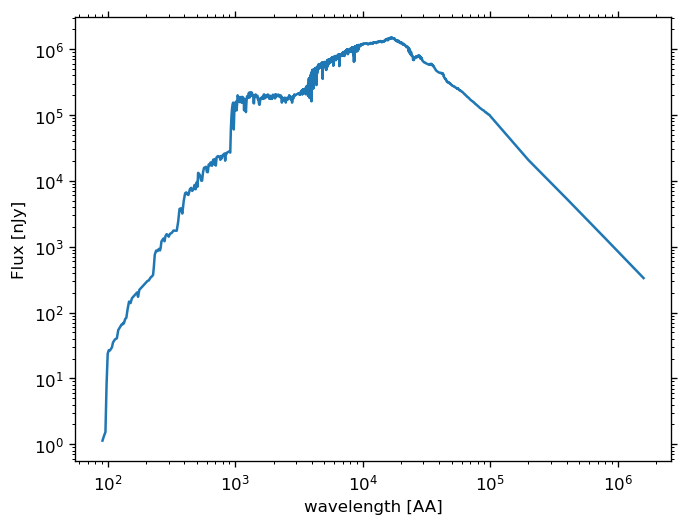

In [795]:
plt.loglog(spec3.lam, spec3.get_fnu(Planck15,0.1,igm=None))

plt.xlabel('wavelength [AA]')
plt.ylabel('Flux [nJy]')

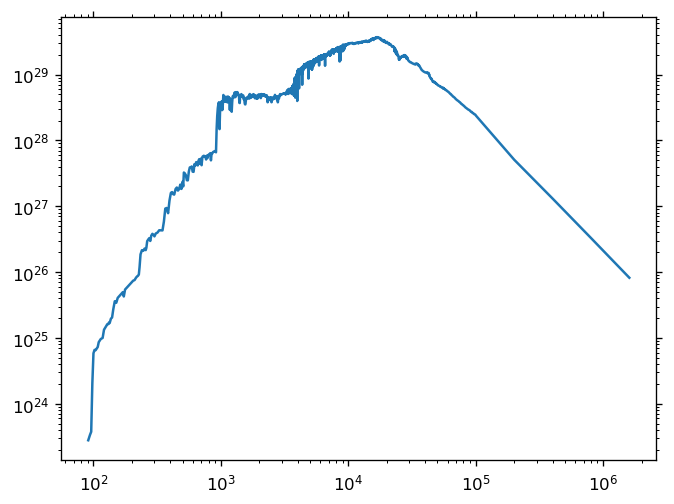

In [796]:
plt.loglog(spec3.lam,spec3.lnu)

In [644]:
### https://github.com/flaresimulations/synthesizer/blob/main/src/synthesizer/load_data/load_scsam.py

from synthesizer.load_data.load_scsam import _load_SCSAM_parametric_galaxy

help(_load_SCSAM_parametric_galaxy)

Help on function _load_SCSAM_parametric_galaxy in module synthesizer.load_data.load_scsam:

_load_SCSAM_parametric_galaxy(SFH, age_lst, Z_lst, method, grid, verbose=False)
    Obtain galaxy SED using the parametric method.
    This is done by interpolating the grid.
    Returns a galaxy object.
    Adapted from code by Kartheik Iyer.
    
    Args:
    SFH: age x Z SFH array as given by SC-SAM for a single galaxy
    age_lst: age bins in the SFH array (Gyr)
    Z_lst: metallicity bins in the SFH array (unitless)
    method: method of interpolating the grid
            'NNI' - scipy's nearest ND interpolator
            'RGI' - scipy's regular grid interpolator



In [803]:
# we should probably write our own sapphire specific one eventually
# note here age is input in Gyr (no log10), and metallicity as mass fraction (no log10, no division by Zsun)

# dividing by 1e9 since that's what's assuming for SCSAM units
new_galaxy = _load_SCSAM_parametric_galaxy(SFH_grid/1e9,tbins/1e9,10**logZbins*0.02,'RGI',grid)

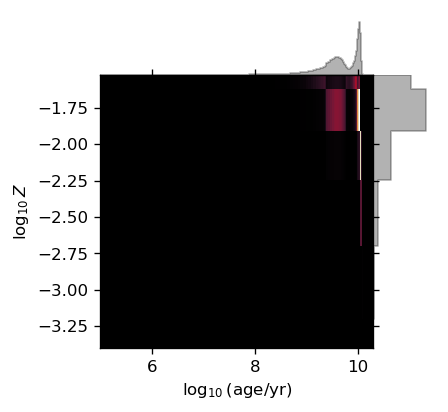

(<Figure size 420x420 with 3 Axes>,
 <Axes: xlabel='$\\log_{10}(\\mathrm{age}/\\mathrm{yr})$', ylabel='$\\log_{10}Z$'>)

In [804]:
new_galaxy.stars.plot_sfzh()

In [624]:
new_galaxy.stars.log10ages

array([ 5.        ,  5.10000158,  5.15000075,  5.19999913,  5.25000014,
        5.30000167,  5.35000172,  5.40000062,  5.45000109,  5.50000169,
        5.55000197,  5.600002  ,  5.65000234,  5.7000024 ,  5.75000207,
        5.80000252,  5.85000259,  5.90000315,  5.95000295,  6.        ,
        6.0200006 ,  6.04000071,  6.05999863,  6.0799984 ,  6.10000158,
        6.12000107,  6.13999866,  6.16000007,  6.17999964,  6.19999913,
        6.22000081,  6.23999979,  6.2599998 ,  6.27999984,  6.2999995 ,
        6.31999873,  6.33999968,  6.36000044,  6.37999947,  6.39999889,
        6.42000033,  6.4400002 ,  6.45999977,  6.47999975,  6.49999895,
        6.51999984,  6.53999893,  6.55999993,  6.57999955,  6.59999981,
        6.6199996 ,  6.63999917,  6.65999982,  6.67999901,  6.69999893,
        6.71999962,  6.73999931,  6.75999929,  6.77999958,  6.79999907,
        6.81999905,  6.83999939,  6.85999942,  6.8799991 ,  6.89999932,
        6.91999908,  6.93999921,  6.95999912,  6.97999882,  6.99

In [625]:
grid.log10age

array([ 5.        ,  5.10000158,  5.15000075,  5.19999913,  5.25000014,
        5.30000167,  5.35000172,  5.40000062,  5.45000109,  5.50000169,
        5.55000197,  5.600002  ,  5.65000234,  5.7000024 ,  5.75000207,
        5.80000252,  5.85000259,  5.90000315,  5.95000295,  6.        ,
        6.0200006 ,  6.04000071,  6.05999863,  6.0799984 ,  6.10000158,
        6.12000107,  6.13999866,  6.16000007,  6.17999964,  6.19999913,
        6.22000081,  6.23999979,  6.2599998 ,  6.27999984,  6.2999995 ,
        6.31999873,  6.33999968,  6.36000044,  6.37999947,  6.39999889,
        6.42000033,  6.4400002 ,  6.45999977,  6.47999975,  6.49999895,
        6.51999984,  6.53999893,  6.55999993,  6.57999955,  6.59999981,
        6.6199996 ,  6.63999917,  6.65999982,  6.67999901,  6.69999893,
        6.71999962,  6.73999931,  6.75999929,  6.77999958,  6.79999907,
        6.81999905,  6.83999939,  6.85999942,  6.8799991 ,  6.89999932,
        6.91999908,  6.93999921,  6.95999912,  6.97999882,  6.99

In [805]:
spec = new_galaxy.stars.get_spectra_incident(grid)
spec

In [883]:
help(spec.get_fnu0)

Help on method get_fnu0 in module synthesizer.sed:

get_fnu0() method of synthesizer.sed.Sed instance
    Calculate a dummy observed frame spectral energy distribution.
    Useful when you want rest-frame quantities.
    
    Uses a standard distance of 10 pcs.
    
    Returns:
        fnu (ndarray)
            Spectral flux density calcualted at d=10 pc.



In [900]:
spec.get_fnu(Planck15, 0.1, igm=None)

unyt_array([  0.90401996,   1.0963761 ,   1.22214579, ..., 480.85903352,
            352.99936051, 269.97389575], 'nJy')

In [879]:
spec.get_fnu0()

unyt_array([1.85689976e+15, 2.25200838e+15, 2.51034527e+15, ...,
            9.87707204e+17, 7.25077386e+17, 5.54539154e+17], 'nJy')

In [444]:
spec.fnu

unyt_array([1.32110811e+06, 1.60058057e+06, 1.78220832e+06, ...,
            5.64840199e+08, 4.14630472e+08, 3.17098377e+08], 'nJy')

In [629]:
spec.lam

unyt_array([9.1e+01, 9.4e+01, 9.6e+01, ..., 1.2e+06, 1.4e+06, 1.6e+06], 'Å')

In [630]:
((2*u.micron)**2 * const.c**-1 * 1e-14 * u.erg * u.s**-1 * u.cm**-2 * u.AA**-1).to('nJy') 

<Quantity 1.33425638e+08 nJy>

unyt_array([2.22177162e+23, 2.69451718e+23, 3.00361603e+23, ...,
            1.18178691e+26, 8.67551600e+25, 6.63503426e+25], 'erg/(Hz*s)')

Text(0, 0.5, 'Flux [nJy]')

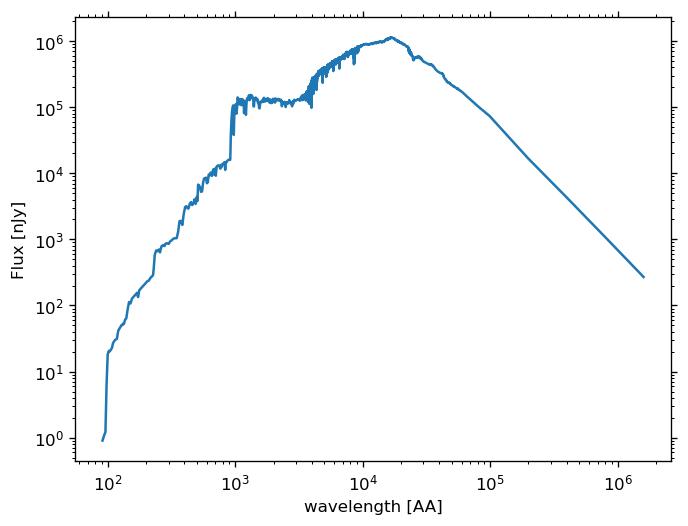

In [928]:
plt.loglog(spec.lam, spec.get_fnu(Planck15,0.1,igm=None))

plt.xlabel('wavelength [AA]')
plt.ylabel('Flux [nJy]')

Text(0, 0.5, 'Flux [nJy]')

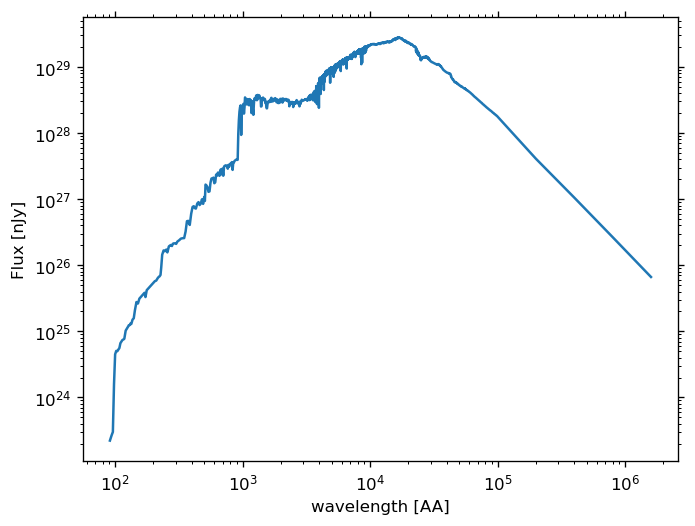

In [809]:
plt.loglog(spec.lam, spec.lnu)

plt.xlabel('wavelength [AA]')
plt.ylabel('Flux [nJy]')

In [810]:
from synthesizer.filters import Filter, FilterCollection

In [811]:
filter_codes = [f"SLOAN/SDSS.{f}" for f in ["u", "g"]]

In [918]:
filter_codes = [f"SLOAN/SDSS.{f}" for f in ['u','g','r','i','z']] +['JWST/NIRCam.F%sW'%f for f in ['150','200','277','356','444']]

filter_codes

['SLOAN/SDSS.u',
 'SLOAN/SDSS.g',
 'SLOAN/SDSS.r',
 'SLOAN/SDSS.i',
 'SLOAN/SDSS.z',
 'JWST/NIRCam.F150W',
 'JWST/NIRCam.F200W',
 'JWST/NIRCam.F277W',
 'JWST/NIRCam.F356W',
 'JWST/NIRCam.F444W']

In [919]:
new_filters = FilterCollection(filter_codes=filter_codes, new_lam=grid.lam)

In [818]:
spec.lam

unyt_array([9.1e+01, 9.4e+01, 9.6e+01, ..., 1.2e+06, 1.4e+06, 1.6e+06], 'Å')

In [920]:
new_filters.filters

{'SLOAN/SDSS.u': <synthesizer.filters.Filter at 0x15526b9cbd30>,
 'SLOAN/SDSS.g': <synthesizer.filters.Filter at 0x15526b9c9e10>,
 'SLOAN/SDSS.r': <synthesizer.filters.Filter at 0x15526b9ca470>,
 'SLOAN/SDSS.i': <synthesizer.filters.Filter at 0x15526b70cbb0>,
 'SLOAN/SDSS.z': <synthesizer.filters.Filter at 0x15526b70c430>,
 'JWST/NIRCam.F150W': <synthesizer.filters.Filter at 0x15526b70cca0>,
 'JWST/NIRCam.F200W': <synthesizer.filters.Filter at 0x15526b70cc40>,
 'JWST/NIRCam.F277W': <synthesizer.filters.Filter at 0x15526b6bb9a0>,
 'JWST/NIRCam.F356W': <synthesizer.filters.Filter at 0x15526b6b8cd0>,
 'JWST/NIRCam.F444W': <synthesizer.filters.Filter at 0x15526b6bb6d0>}

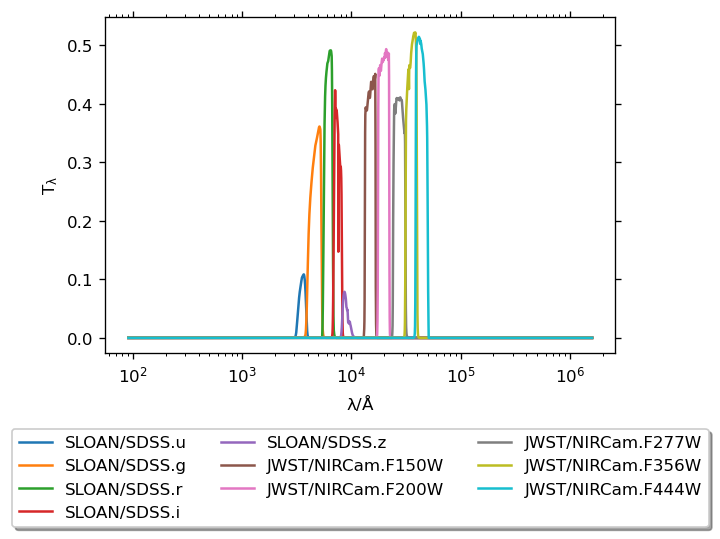

In [921]:
### look into new_filters.unify_with_grid method

fig, ax = new_filters.plot_transmission_curves()#show=True)
ax.set_xscale('log')
# ax.set_xlim(1000,7000)

In [901]:
spec.get_photo_fluxes(new_filters)

In [895]:
spec.get_photo_luminosities(new_filters)

In [896]:
spec.photo_luminosities.photo_luminosities

unyt_array([3.71880560e+28, 8.09702448e+28], 'erg/(Hz*s)')

In [897]:
spec.photo_fluxes.photometry.to('mJy')

unyt_array([3.79538369e-05, 1.46022511e-04], 'mJy')

In [902]:
from synthesizer.conversions import fnu_to_apparent_mag
fnu_to_apparent_mag(spec.photo_fluxes.photo_fluxes)

array([18.57727521, 17.82611497])

In [903]:
18.5-17.82, 27.45-25.98

(0.6799999999999997, 1.4699999999999989)

In [898]:
from synthesizer.conversions import fnu_to_apparent_mag
fnu_to_apparent_mag(spec.photo_fluxes.photo_fluxes)

array([27.45186078, 25.98895047])

In [899]:
from synthesizer.conversions import fnu_to_lnu, lnu_to_absolute_mag
lnu_to_absolute_mag(spec.photo_luminosities.photo_luminosities)

array([-19.8312313 , -20.67603625])

In [904]:
-19.83 - (-20.67)

0.8400000000000034

In [905]:
spec.photo_fluxes.photo_fluxes.to('nJy')

unyt_array([134613.90245386, 268877.22121162], 'nJy')

In [906]:
new_filters.mean_lams

unyt_array([3545.97034815, 4669.64061161], 'Å')

(2.6887722121162246e-32, 1e-26)

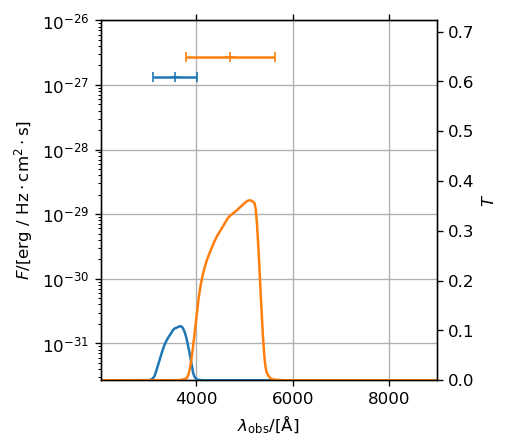

In [857]:
fig, ax = spec.photo_fluxes.plot_photometry()

ax.set_ylim(None,1e-26)

Text(0.5, 0.98, 'sapphire+synthesizer synthetic spectra + photometry in SDSS-ugriz and JWST NIRCAM')

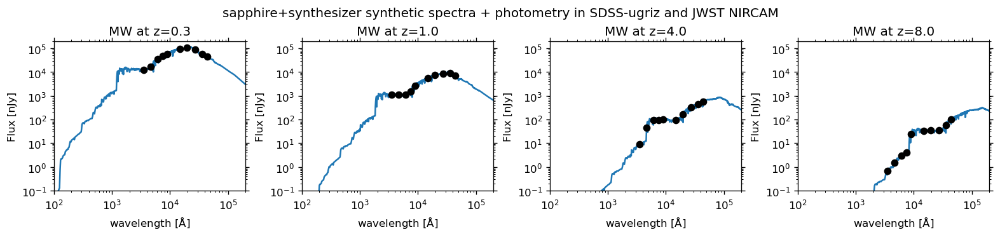

In [942]:
fig, axes = plt.subplots(nrows=1,ncols=4,figsize=(13,3),constrained_layout=True)

for testi,testz in enumerate([0.3,1.0,4.0,8.0]):

    axes[testi].loglog((1+testz)*spec.lam, spec.get_fnu(Planck15,testz,igm=None))
    
    spec.get_photo_fluxes(new_filters)

    axes[testi].plot(new_filters.mean_lams, spec.photo_fluxes.photo_fluxes.to('nJy'),'ko')    
    
    axes[testi].set_title('MW at z=%s'%testz)

for ax in axes:
    ax.set_xlabel(r'wavelength [$\rm{\AA}$]')
    ax.set_ylabel('Flux [nJy]')

    ax.set_xlim(1e2,2e5)
    ax.set_ylim(1e-1,2e5)
    
fig.suptitle('sapphire+synthesizer synthetic spectra + photometry in SDSS-ugriz and JWST NIRCAM')    

In [906]:
new_filters.mean_lams

unyt_array([3545.97034815, 4669.64061161], 'Å')

In [849]:
for f in new_filters:
    phot = f.apply_filter(spec._fnu, nu=spec._obsnu)
    print(phot)

134613.9024538647
268877.22121162195


In [ ]:
 f.apply_filter(seds[z]._fnu, nu=seds[z]._obsnu)

In [447]:
galaxy.stars.initial_mass

unyt_quantity(1.e+09, 'Msun')

In [423]:
from synthesizer.filters import UVJ

fc = UVJ(grid.lam)

fc

--------------------------------------------------
|               PHOTOMETRY (FLUX)                |
|--------------------|---------------------------|
| U (λ = 3.64e+03 Å) | 4.07e-22 erg/(Hz*cm**2*s) |
|--------------------|---------------------------|
| V (λ = 5.50e+03 Å) | 1.98e-21 erg/(Hz*cm**2*s) |
|--------------------|---------------------------|
| J (λ = 1.22e+04 Å) | 1.81e-21 erg/(Hz*cm**2*s) |
--------------------------------------------------



(<Figure size 420x600 with 2 Axes>,
 <Axes: xlabel='$\\lambda_\\mathrm{obs}/[\\mathrm{\\AA}]$', ylabel='$F/[\\mathrm{\\rm{erg} \\ / \\ \\rm{Hz \\cdot \\rm{cm}^{2} \\cdot \\rm{s}}}]$'>)

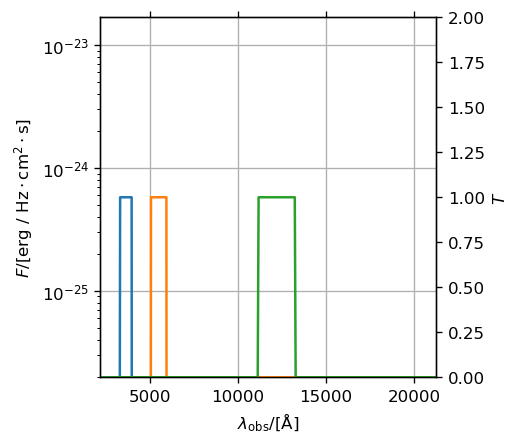

In [428]:
uvj = spec.get_photo_fluxes(fc)
print(uvj)
uvj.plot_photometry(show=True)

In [390]:
new_galaxy.stars.get_spectra_incident(grid)

In [399]:
new_galaxy.stars.spectra['incident'].lnu

unyt_array([2.67943979e+32, 3.24625913e+32, 3.61463217e+32, ...,
            1.14559535e+35, 8.40943579e+34, 6.43131323e+34], 'erg/(Hz*s)')

In [407]:
new_galaxy.stars.spectra['incident'].llam

unyt_array([9.70022751e+46, 1.10140788e+47, 1.17582407e+47, ...,
            2.38500587e+41, 1.28626808e+41, 7.53148126e+40], 'erg/(s*Å)')

In [395]:
new_galaxy.stars.spectra['incident'].lam

unyt_array([9.1e+01, 9.4e+01, 9.6e+01, ..., 1.2e+06, 1.4e+06, 1.6e+06], 'Å')

In [633]:
new_galaxy.stars.spectra['incident'].lnu

unyt_array([2.22177162e+32, 2.69451718e+32, 3.00361603e+32, ...,
            1.18178691e+35, 8.67551600e+34, 6.63503426e+34], 'erg/(Hz*s)')

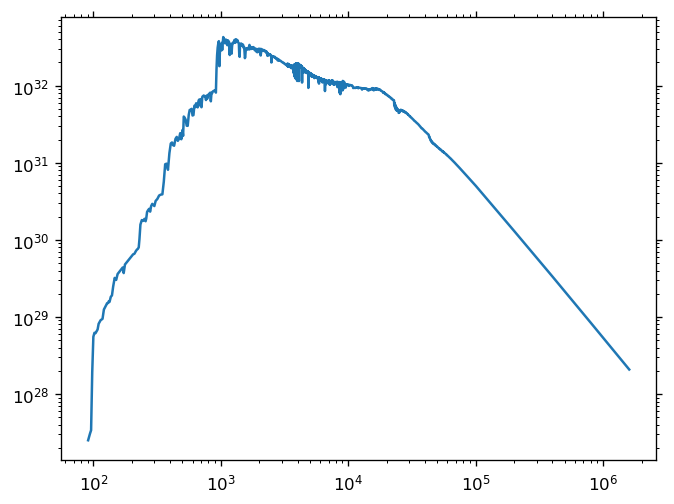

In [654]:
plt.loglog(new_galaxy.stars.spectra['incident'].lam,new_galaxy.stars.spectra['incident'].lnu)

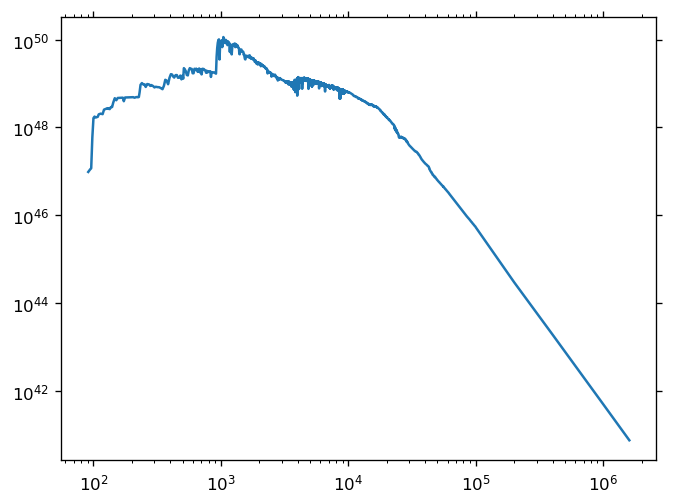

In [408]:
plt.loglog(new_galaxy.stars.spectra['incident'].lam,new_galaxy.stars.spectra['incident'].llam)

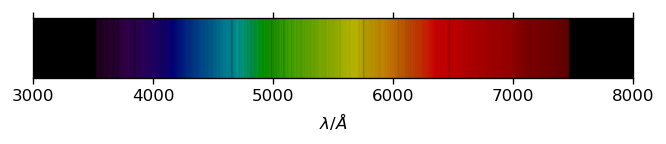

In [400]:
fig, ax = plot_spectra_as_rainbow(new_galaxy.stars.spectra['incident'])

In [402]:
galaxy.stars.get_spectra_

IndexError: index 8 is out of bounds for axis 1 with size 6

# Now modify the above code to also solve for subhalo evolution

In [22]:
### get row numbers of subhalos that still exist at z=0 and have Mpeak/Mvir_host(z=0) > fraction say 1e-4 (i.e., Mpeak > 1e8 for MW host)

# NOTE: change Dec 13 to instead use Msub(z=0)/Mvir_host(z=0) > 1e-4 as advocated by Nadler+23 since Mpeak-Msub relation is non-trivial
#       for example Mpeak~1e8 could've been at z~8 but if by z~0 it has ~1e7 that is not resolved (DM particle mass ~ 4e5 Msun)

# isubs = [i for i in range(1,len(r)) if r[i,-1]['ok'] == True and hist[i]['mpeak']/r[0,-1]['m'] > 1e-4]
# isubs = [i for i in range(1,len(r)) if r[i,-1]['ok'] == True and r[i,-1]['m']/r[0,-1]['m'] > 2e-4] # 2e-4 is a bit more conservative ---> 500 particles

# December 14 -- add condition to only model surviving satellites at z=0 that are within Rvir of host to ignore splashback subhalos...
isubs = [i for i in range(1,len(r)) if r[i,-1]['ok'] == True and r[i,-1]['m']/r[0,-1]['m'] > 2e-4 and np.sqrt(np.sum(r[i,-1]['x']**2)) <= r[0,-1]['rvir']]

# print number of selected subhalos, number of total subhalos, and most massive mpeak (LMC is logmpeak~11)
len(isubs), len(r), np.max(hist[isubs]['mpeak'])/1e11

(41, 439, 1.7242857472)

In [23]:
# for those subhalos, create a list of redshifts when they first fell into the host halo
# for now, we will always treat subhalos as centrals before t_merge and as subhalos afterwards (this ignores flyby and splashback cases)

redshifts = 1/scale - 1
zmerge = np.array([-99] + [redshifts[hist[i]['merger_snap']] for i in isubs]) # prepending with z=-99 for host halo since it never becomes a subhalo

# similarly, find the earliest redshift when each subhalo first exists in the rockstar catalog
# prior to this, all subhalo ODEs will be set to 0 so we do not extrapolate interpolators and so subhalo's state variables do not change
# the [0]+isubs prepends the starting halo's redshift
zstart = np.array([redshifts[np.argmax(r[i,:]['ok'])] for i in [0]+isubs]) # argmax gives index of first occurrence of True

# zmerge, zstart


In [24]:
### create parallelized function that returns list of interpolators for time series of needed properties for each subhalo

# access global arrays needed just once
Rvir_host = r[0,:]['rvir'] 
time_yr = time*1e9 # Gyr to yr

def interp_subhalo(i):
    """ 
    i is one element of isubs (the row to index the r and hist arrays) 
    """
    
    ok = r[i,:]['ok'] # time series of whether (sub)halo exists or not (True/False)    
    
    """ ratio dsub/Rvir """
    x = r[i,:]['x'] # subhalo position vector (x,y,z) relative to host halo center in proper kpc 
    
    # convert x to halo-centric distance in proper kpc by just doing sqrt(sum(x**2)) since (x,y,z) are halo-centric distances
    dsub = np.sqrt(np.sum(x[ok]**2,axis=1))
    
    # get Rvir(t) of host halo 
    # ok_host = r[0,:]['ok'] # we will IGNORE this one since host generally exists -- it's easier this way... 
    Rvir_host_ok = Rvir_host[ok] # just access Rvir at same snapshots where subhalo exists    
    
    # divide to get subhalo radial distance in units of host Rvir(t)
    rsub = dsub / Rvir_host_ok
    
    # smooth and interpolate -- for extrapolation, return boundary value (assuming at late times, subhalo will always end at rsub << 1)
    # we use Savitzky-Golay filter here insteadof simple gaussian filter to better capture the peaks/troughs 
    # Feb 8 - fixed bug, this should be interpolating on time grid, not scale factor grid (Austen had also already caught this)
    interp_rsub_savgolay = InterpolatedUnivariateSpline(time[ok],savgol_filter(rsub,window_length=5,polyorder=4),k=3,ext=3) # proper kpc
    
    """ repeat for parent-centric subhalo ORBITAL velocity """
    vorb_vec = r[i,ok]['v'] # subhalo velocity vector (vx,vy,vz) relative to host central velocity in proper km/s
    vorb = np.sqrt(np.sum(vorb_vec**2,axis=1)) # total magnitude of subhalo orbital velocity vector [proper km/s]
    interp_vorb = InterpolatedUnivariateSpline(time[ok],savgol_filter(vorb,window_length=5,polyorder=4),k=3,ext=3)
    
    
    """ mass accretion history """
    Msub = r[i,ok]['m'] # Mvir(t) from rockstar at snapshots where halo exists / is "ok" -- for subhalos, this is Mbound 
    
    # at every snap, replace Mvir with Mpeak(<snap) with this list comprehension
    # subhalo mass loss phase: replace with Mpeak(>t) instead to prevent any mass increases (hence monotonic mass loss) 
    Mpeak = [Msub[0]] + [np.max(Msub[:isnap+1]) if isnap<hist[i]['merger_snap'] else np.max(Msub[isnap:]) for isnap in range(1,len(scale[ok]))]

    # now apply a gaussian filter to ensure monotonicity and that dMpeak/dt cannot switch sign
    Msmooth = 10**gaussian_filter1d(np.log10(Mpeak),10,mode='nearest')

    # now fit cubic spline to log(M/Msun) vs log(t/yr)
    interp_logMsmooth = InterpolatedUnivariateSpline(np.log(time_yr[ok]),np.log(Msmooth),k=3,ext=3)

    # now take derivative of spline using its well-defined derivative function
    # this is dlog(M/Msun)/dlog(t/yr) -- to convert to dM/dt in Msun/yr, you multiply by Mhalo(t)/t
    interp_dlogM_dlogt = interp_logMsmooth.derivative()
    
    """ Rvir """
    interp_logRvir = InterpolatedUnivariateSpline(time[ok],gaussian_filter1d(np.log(r[i,ok]['rvir']),10,mode='nearest'),k=3,ext=3) # proper kpc

    """ Vvir """
    Vvir_rockstar = np.sqrt(G*r[i,ok]['m']*Msun_to_g / (r[i,ok]['rvir']*kpc_to_cm))*1e-5
    interp_logVvir = InterpolatedUnivariateSpline(time[ok],gaussian_filter1d(np.log(Vvir_rockstar),10,mode='nearest'),k=3,ext=3)

    """ cNFW """
    interp_logcNFW = InterpolatedUnivariateSpline(time[ok],gaussian_filter1d(np.log(r[i,ok]['cvir']),10,mode='nearest'),k=3,ext=3) # dimensionless    
    
    """ vmax """ 
    interp_logVmax = InterpolatedUnivariateSpline(time[ok],gaussian_filter1d(np.log(r[i,ok]['vmax']),10,mode='nearest'),k=3,ext=3) # dimensionless        
    
    # return the interpolators in same order as for central
    return interp_dlogM_dlogt, interp_logMsmooth, interp_logRvir, interp_logVvir, interp_logcNFW, interp_rsub_savgolay, interp_logVmax, interp_vorb



In [25]:
r.dtype

dtype([('id', '<i4'), ('m', '<f4'), ('vmax', '<f4'), ('rvmax', '<f4'), ('x', '<f4', (3,)), ('v', '<f4', (3,)), ('ok', '?'), ('rvir', '<f4'), ('cvir', '<f4')])

In [26]:
# call in parallel to get stacked list of lists of interpolators for all subhalos with row indices in isubs

PoolProcesses = multiprocess.cpu_count()

tstart = timer()
pool = multiprocess.Pool(processes = PoolProcesses)

interpolators = pool.map(interp_subhalo,isubs)

# close pool processes to free memory
pool.close()
pool.join()

print('finished interpolating histories of %s subhalos in %s sec'%(len(isubs),timer()-tstart))

finished interpolating histories of 41 subhalos in 0.3950287789921276 sec


In [27]:
# prepend the central halo's interpolators to the list of lists of subhalo interpolators 
# making this a numpy array to enable slicing 
# NEW: host halo's rsub interpolator is meaningless but this preserves data structure and enables fast array evaluation of interpolators
# final element of central halo is nan since it doesn't have/need a subhalo distance interpolator
tree_interpolators = np.array([(interp_dlogM_dlogt,interp_logMsmooth,interp_logRvir,interp_logVvir,interp_logcNFW,interp_rsub_savgolay,interp_logVmax,interp_vorb)] 
                              + interpolators )


In [28]:
np.exp(tree_interpolators[0][6](time))

array([ 25.42062   ,  25.42062   ,  25.42062   ,  25.42062   ,
        25.42062   ,  25.42062   ,  25.42062   ,  25.42062   ,
        25.42062   ,  25.42062   ,  25.42062   ,  25.42062   ,
        25.42062   ,  25.42062   ,  25.42062   ,  25.42062   ,
        25.42062   ,  25.42062   ,  25.42062   ,  25.42062   ,
        25.42062   ,  25.42062   ,  25.42062   ,  25.42062   ,
        25.79849464,  26.19048971,  26.59408975,  27.00668435,
        27.42568671,  27.84864669,  28.27337684,  28.69805656,
        29.12135179,  29.5424654 ,  29.96120258,  30.37795046,
        30.7936812 ,  31.20989218,  31.62850108,  32.05173122,
        32.48198769,  32.92168519,  33.37311084,  33.83827699,
        34.31877882,  34.81566485,  35.32933775,  35.85949697,
        36.40508427,  36.96429511,  37.5345657 ,  38.11270734,
        38.69493798,  39.27701607,  39.85441207,  40.42250146,
        40.97671071,  41.51271775,  42.02659817,  42.51502002,
        42.97536443,  43.40583511,  43.80557428,  44.17

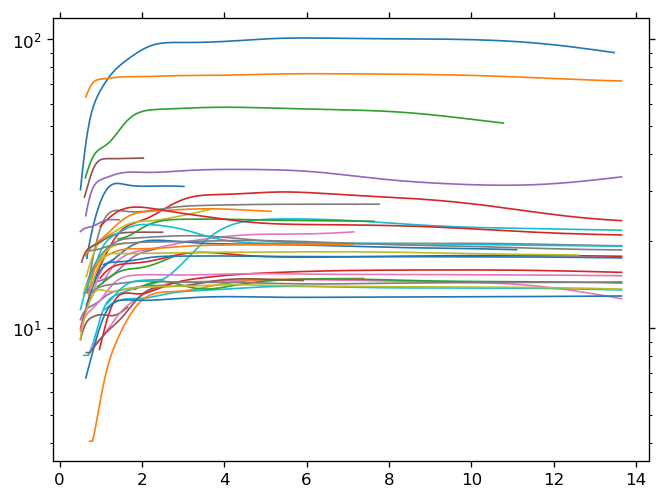

In [29]:
for isub in range(1,len(tree_interpolators)):
    ok = r[isub,:]['ok']
    plt.semilogy(time[ok][50:],np.exp(tree_interpolators[isub][6](time[ok])[50:]),lw=1)

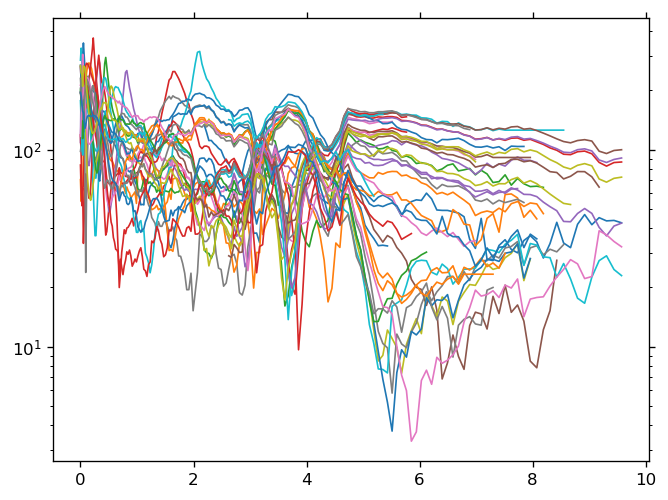

In [30]:
for isub in range(1,len(tree_interpolators)):
    ok = r[isub,:]['ok']
    plt.semilogy(interp_redshift(time[ok][50:]),tree_interpolators[isub][7](time[ok])[50:],lw=1)
    

235 186.22806
224 103.06988
208 142.9185
236 70.40639
224 96.58289
115 194.78342
155 95.70431
184 129.45604
142 79.53836
228 90.97047
131 20.477097
163 125.756905
143 104.485146
201 83.533806
117 113.55694
132 36.397568
79 95.18751
228 108.75086
104 188.65622
236 180.0456
208 175.7553
176 180.11661
110 77.94435
201 197.52284
106 73.01431
113 68.69858
214 225.08649
217 75.40431
208 380.2079
196 82.362946
197 80.44541
176 198.93068
169 284.5277
202 150.53131
135 120.18805
169 207.74902
236 59.831135
213 90.27293
236 190.34184
93 89.51526
224 166.86552


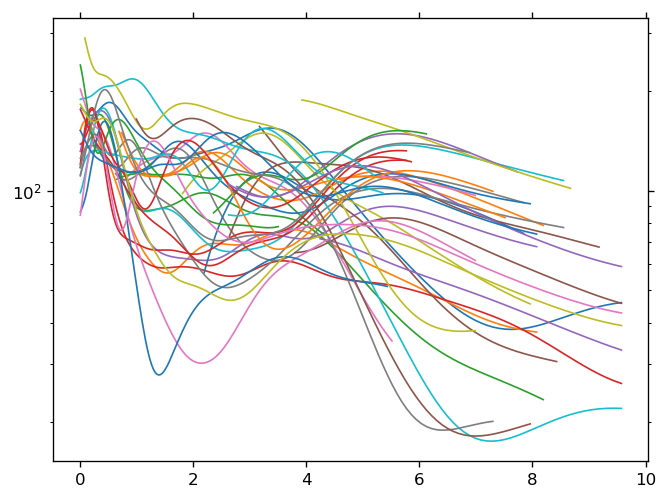

In [31]:
for i in range(1,len(tree_interpolators)):
        
    ok = r[i,:]['ok'] # time series of whether (sub)halo exists or not (True/False)            
    
    """ repeat for parent-centric subhalo ORBITAL velocity """
    vorb_vec = r[i,ok]['v'] # subhalo velocity vector (vx,vy,vz) relative to host central velocity in proper km/s
    vorb = np.sqrt(np.sum(vorb_vec**2,axis=1)) # total magnitude of subhalo orbital velocity vector [proper km/s]
    
    # s_vec = s[i,
    # s_vorb = 
    
    print(len(vorb),vorb[-1])
    
    # interp_vorb = InterpolatedUnivariateSpline(time[ok],savgol_filter(vorb,window_length=5,polyorder=4),k=3,ext=3)
    interp_vorb = InterpolatedUnivariateSpline(time[ok],gaussian_filter1d(vorb,10,mode='nearest'),k=3,ext=3)
    
    plt.semilogy(interp_redshift(time[ok][50:]),interp_vorb(time[ok])[50:],lw=1)    

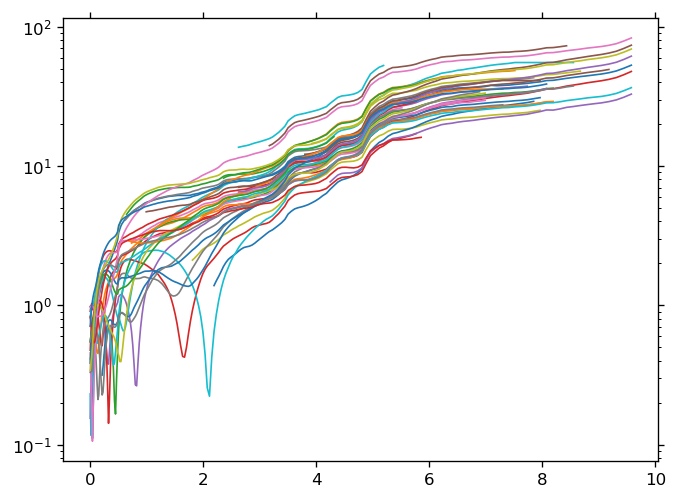

In [32]:
for isub in range(1,len(tree_interpolators)):
    ok = r[isub,:]['ok']
    plt.semilogy(interp_redshift(time[ok][50:]),tree_interpolators[isub][5](time[ok])[50:],lw=1)

In [33]:
"""
Set up ODE integrator function including subhalos (array-based operations)
"""

def integrator(logt, logy, parameters, interp_redshift, tree_interpolators, zmerge, zstart):
    """ 
    logt = log(current time in seconds)
    logy = 2D array of log(state variables) for host (0th row) and subhalos (other rows) at current time
    parameters = dictionary of model/runtime parameters
    interp_redshift = interpolator for mapping current time to redshift (faster to interpolate than re-evaluate cosmology functions)    
    tree_interpolators = list of lists of tree interpolators for host (0th index list) followed by subhalos
                         ---> the order of the interpolators is [logMAH,logMvir,logRvir,logVvir,logcNFW]
    zmerge = list of redshifts at which each subhalo first falls into host (before this, subhalos evolve as centrals, afterwards they evolve as satellites) 
    zstart = list of earliest redshifts at which each halo first appears in merger trees (before this, all ODEs should be 0 so halo does not evolve)
    """
    
    # Austen's approach: reshape flattened logy to have shape (N halos, 7 state variables)
    logy = logy.reshape(len(tree_interpolators), 7)
    
    # unpack the log10 state variables and raise to power 10 

    M_star = 10**logy[:,0]
    M_ism = 10**logy[:,1]
    M_cgm = 10**logy[:,2]
    Eth_cgm = 10**logy[:,3]
    MZ_star = 10**logy[:,4]
    MZ_ism = 10**logy[:,5]
    MZ_cgm = 10**logy[:,6]
    
    # also raise the log10(t/sec) to power of 10 and convert to Gyr for interpolation functions
    t_Gyr = 10**logt * s_to_yr * 1e-9 
    
    # unpack our SAM's free parameters
    alpha_n = parameters['alpha_n']
    alpha_T = parameters['alpha_T']
    tau_escape = parameters['tau_escape']
    f_recycle = parameters['f_recycle']
    e_wind_halo = parameters['e_wind_halo']
    yZ = parameters['yZ']
    etaM_A = parameters['etaM_A']
    etaM_alpha0 = parameters['etaM_alpha0']
    etaM_alphaz = parameters['etaM_alphaz']
    etaM_beta = parameters['etaM_beta']    
    tdep_A = parameters['tdep_A']
    tdep_alpha0 = parameters['tdep_alpha0']   
    tdep_alphaz = parameters['tdep_alphaz']   
    tdep_beta = parameters['tdep_beta']    
    etaE_A = parameters['etaE_A']
    etaE_alpha0 = parameters['etaE_alpha0']
    etaZ_A = parameters['etaZ_A']
    etaZ_alpha0 = parameters['etaZ_alpha0']
    etaZ_alphaz = parameters['etaZ_alphaz']
    etaZ_beta = parameters['etaZ_beta']    
    alpha_prev = parameters['alpha_prev'] 
    return_all = parameters['return_all']
    
    # interpolate from current time to current redshift (faster than doing cosmology calculation)
    redshift = interp_redshift(t_Gyr).item()
    
    # unpack tree_interpolators: every subhalo has its own set of interpolators -- this is all a list of lists
    interp_logMAH = tree_interpolators[:,0]
    interp_logMvir = tree_interpolators[:,1]    
    interp_logRvir = tree_interpolators[:,2]    
    interp_logVvir = tree_interpolators[:,3]    
    interp_logcNFW = tree_interpolators[:,4]    
    
    # evaluate the interpolator functions for every subhalo at the current time using list comprehension
    logMAH = np.array([interp(np.log(t_Gyr*1e9)).item() for interp in interp_logMAH]) # dlogM/dlogt (this is slope)
    
    # Prevent negative MAH for subhalos even prior to zmerge
    logMAH = np.clip(logMAH,0,None)
    
    Mvir = np.exp([interp(np.log(t_Gyr*1e9)).item() for interp in interp_logMvir]) # Mvir in Msun
    Mdot_vir = logMAH * (Mvir/(t_Gyr*1e9)) # MAR in Msun/yr via dlnM/dlnt * (M/t)
    Rvir = np.exp([interp(t_Gyr).item() for interp in interp_logRvir]) # proper kpc -- note the input is t in Gyr, unlike log(t/yr) for Mvir and MAH
    Vvir = np.exp([interp(t_Gyr).item() for interp in interp_logVvir]) # proper km/s 
    NFW_c = np.exp([interp(t_Gyr).item() for interp in interp_logcNFW]) # dimensionless NFW halo concentration Rvir/Rs_klypin
    
    # print('---------> logt=%s, t_Gyr=%s, redshift=%s'%(logt,t_Gyr,redshift))
    # print('logy=%s'%logy)        
    # print('logMAH=%s,Mvir=%s,Mdot_vir=%s,Rvir=%s,Vvir=%s,c=%s'%(logMAH,Mvir,Mdot_vir,Rvir,Vvir,NFW_c))

    """ 
    everything that follows is now an array operation 
    i.e., same calculation for host halo and all its subhalos simultaneously unless otherwise noted/modified
    """
    
    # compute gas free-fall radius rff = radius of Vmax ~ 2.16*Rscale ~ 2.16 * Rvir/cNFW 
    rff = 2.16 * (Rvir / NFW_c) / Rvir # in units of Rvir
    
    # compute any other global halo quantities 
    Tvir = 35.9 * Vvir**2 # K 
    evir_halo = 3/2. * const_kB * Tvir / (0.59*const_mp) # erg/Msun  
    tdyn_halo = Rvir / (Vvir * 1e5*cm_to_kpc / (s_to_yr*1e-9)) # Gyr
    
    # analytic formula for NFW Vcirc(rff:=r/Rvir) rom Mo, van den Bosch & White eqn 11.26
    NFW_vcirc_num = np.log(1+NFW_c*rff) - NFW_c*rff/(1+NFW_c*rff)
    NFW_vcirc_den = rff*(np.log(1+NFW_c)-NFW_c/(1+NFW_c))
    NFW_vcirc = Vvir*np.sqrt(NFW_vcirc_num/NFW_vcirc_den) # km/s
    tdyn_ism = rff*Rvir / (NFW_vcirc * 1e5*cm_to_kpc / (s_to_yr*1e-9)) # Gyr
    
    # get SF and ISM wind scalings from FIRE 
    tdep_ism = get_tdep(Vvir,redshift,A=tdep_A,alpha0=tdep_alpha0,alphaz=tdep_alphaz,beta=tdep_beta) # Gyr 
    etaM_ism = get_etaM_ism(Vvir,redshift,A=etaM_A,alpha0=etaM_alpha0,alphaz=etaM_alphaz,beta=etaM_beta) # dimensionless
    etaE_ism = get_etaE_ism(Vvir,redshift,A=etaE_A,alpha0=etaE_alpha0,alphaz=0.0,beta=0.0) # dimensionless    
    etaZ_ism = get_etaZ_ism(Vvir,redshift,A=etaZ_A,alpha0=etaZ_alpha0,alphaz=etaZ_alphaz,beta=etaZ_beta) # dimensionless    

    # new FIRE Zdot/Mdot scalings for chemical evolution modeling
    Zin_halo = get_Zin_halo(Vvir,redshift) # dimensionless Zdot/Mdot (*not* normalized to Zsun)
    
    # compute log10 of CGM metallicity normalized to Zsun for cooling function
    log_Zcgm = np.log10(MZ_cgm / M_cgm / 0.02)
        
    ### compute Mdot_in_halo and Edot_in_halo terms 
    # first f_UV for UVB photoionization suppression of halo inflows
    Mfilt = m_filt(z=redshift)
    f_UV = collapse_fraction(Mvir,Mfilt)  
    
    # f_prev due to SN wind shock heating 
    # in the future will add zeta=Edot_out_halo_previous / (evir_halo*Mdot_in_halo) here 
    
    # assume this gas accretion brings in specific energy = evir_halo
    # f_prev will be computed and multiply both of these inflow rates AFTER we compute the halo energy outflow rate below
    Mdot_in_halo = f_UV * f_b * Mdot_vir # Msun/yr
    Edot_in_halo = Mdot_in_halo * evir_halo / yr_to_s # erg/s 
    
    ### compute Edot_cool and Mdot_cool terms
    # first get n0 for density profile and T0 for temperature profile (this can be done analytically)
    rarr = np.logspace(np.log10(0.1),np.log10(1.0),100)    

    n0_val = analytic_n0(M_cgm,Rvir,alpha_n) # cm**-3
    T0_val = analytic_T0(Eth_cgm,Rvir,n0_val,alpha_n,alpha_T) # K
    
    # now construct density and temperature profiles
    # NOTE: this now has a list comprehension due to working with subhalos: it's a 2D array, where each row is radial profile of n(r) for each subhalo
    n_rarr = np.array([n0 * rarr**alpha_n for n0 in n0_val]) # cm**-3
    T_rarr = np.array([T0 * rarr**alpha_T for T0 in T0_val]) # K     

    ##### NEW FOR AUSTEN -- USE CIE SD93 COOLING FUNCTION -- this is just a scalar number, no longer an array, so easier/faster to work with
    # halo_coolfunc = 10**coolfunc_sd93(np.log10(T0_val),log_Zcgm).item() # erg*cm**3/s 
    halo_coolfunc = 10**rgi_sd93(list(zip(np.log10(T0_val),log_Zcgm)))
    # print('coolfunc=%s, T0_val=%s'%(halo_coolfunc,T0_val))
    
    # compute the Edot_cool integral in erg/s
    # NOTE: this needs to be a list comprehension since integration of radial profiles happens for each halo
    Edot_cool = np.array([trapz(y=4*np.pi*(rarr*Rvir[i]*kpc_to_cm)**2*(n_rarr[i])**2*halo_coolfunc[i],x=rarr*Rvir[i]*kpc_to_cm) 
                          for i in range(len(Rvir))])
    
    # limit catastrophic cooling by taking minimum of Edot_cool and Eth/tff since CGM cannot lose energy faster than grav collapse (radiating away grav PE)
    # NOTE: added axis=0 for np.min over subhalo array
    Edot_cool = np.min([Edot_cool,Eth_cgm/(tdyn_halo*1e9*yr_to_s)], axis=0)
    
    # compute an effective tcool as Energy_cgm / Edot_cool
    tcool_eff = (Eth_cgm / Edot_cool)*s_to_yr*1e-9 # Gyr    

    # compute effective free-fall time at pre-defined radius rff 
    tff_eff = (rff*Rvir*kpc_to_cm*1e-5 / NFW_vcirc)*s_to_yr*1e-9 # Gyr        

    # compute Mdot_cool as M_cgm / t_accrete where t_accrete = tcool,eff + tff,eff
    t_accrete = tcool_eff + tff_eff # Gyr
    Mdot_cool = M_cgm / (t_accrete*1e9) # Msun/yr        
    
    ### NEW for subhalos with zmerge < current redshift, they are satellites and not allowed to accrete ISM gas, so set Mdot_cool=0 and Edot_cool=
    # this is accomplished by converting zmerge into 0 or 1 for each halo depending on whether its zmerge happened before current redshift (i.e., at higher z)
    # and then multiplying the Mdot_cool and Edot_cool by this flag to zero it out (for current satellites) or keep it as-is (for current centrals)
    satellite_flag = np.where(zmerge>redshift, 0, 1) # assigns 0 for halos that have already fallen into the host (i.e., are currently satellites)
    Edot_cool *= satellite_flag
    Mdot_cool *= satellite_flag
    
    # ALSO apply this satellite flag to prevent any new subhalo accretion (or loss), i.e., Mdot_in_halo = 0 and Edot_in_halo = 0
    Mdot_in_halo *= satellite_flag
    Edot_in_halo *= satellite_flag
    

    # print('Mdot_cool=%.1e, Edot_cool=%.1e, Eth/tdyn_halo=%.1e'%(Mdot_cool,Edot_cool,Eth_cgm/(tdyn_halo*1e9*yr_to_s)))
    
    ### compute SFR term
    Mdot_sfr = M_ism / (tdep_ism*1e9) # Msun/yr
    
    ### compute Mdot_wind and Edot_wind terms
    Mdot_wind = etaM_ism * Mdot_sfr # Msun/yr
    
    # March 2023 -- switch from parameterized vB back to parameterized etaE for computing Edot_wind 
    Edot_wind = etaE_ism * ((1e51/100.) * (Mdot_sfr/yr_to_s)) # erg/s
    
    
    ### compute Edot_out_halo and Mdot_out_halo terms 
    Ebind_cgm = evir_halo * M_cgm # erg
    Delta_Ecgm = Eth_cgm - Ebind_cgm # erg
    Edot_out_halo = np.maximum(0.0,Delta_Ecgm) / (tau_escape*tdyn_halo*1e9*yr_to_s) # erg/s; NOTE: switched to np.maximum to take axis=0 by default
    Mdot_out_halo = (Edot_out_halo/s_to_yr) / (e_wind_halo*(Eth_cgm/M_cgm)) # Msun/yr
    
    ### Go back and compute f_prev to reduce Mdot_in_halo and Edot_in_halo due to preventative feedback 
    # f_prev = np.min([1.0,kappa_heat * (Edot_out_halo / Edot_in_halo)])
    
    ### Nov 14 2022 -- parameterized fthermal_wind, fthermal_accretion, fprev
    f_prev = get_fprev(Vvir)#,redshift)
    
    # Carr+23/Pandya+20 style version where f_prev depends on ratio of Edot_out_halo and Edot_in_halo in the absence of preventative feedback
    # f_prev = np.min([alpha_prev * Edot_in_halo/Edot_out_halo, 1.0])
    
    Mdot_in_halo *= f_prev 
    Edot_in_halo *= f_prev 
        
    ##### New chemical evolution MZdot's 
    Zcgm = MZ_cgm / M_cgm # metal mass fraction of CGM (not normalized to solar and not log10)
    Zism = MZ_ism / M_ism # metal mass fraction of ISM     
    
    MZdot_sfr = Zism*(1.0-f_recycle)*Mdot_sfr # new long-lived stellar mass has same metallicity as ISM
    MZdot_cool = Zcgm*Mdot_cool # metal inflow rate from CGM to ISM
    MZdot_yield = yZ*Mdot_sfr # new metal mass produced by both short- and long-lived stars 
    MZdot_wind = Zism*Mdot_wind + etaZ_ism*MZdot_yield # metal outflow rate of ISM wind
    MZdot_in_halo = Zin_halo*Mdot_in_halo # metal inflow rate into CGM from cosmic accretion
    MZdot_out_halo = Zcgm*Mdot_out_halo # metal outflow rate from overpressurized halo
    
    ### Finally combine and return the total derivatives for the state variables (in the same order as y)
    # FIRST: since the time array (hence dt) will be in sec, convert all of these to Msun/s and erg/s
    Mdot_sfr_longlived = (1.0-f_recycle)*Mdot_sfr / yr_to_s # Msun/s
    Mdot_ism = (Mdot_cool - (1.0-f_recycle)*Mdot_sfr - Mdot_wind) / yr_to_s # Msun/s 
    Mdot_cgm = (Mdot_in_halo - Mdot_cool + Mdot_wind - Mdot_out_halo) / yr_to_s # Msun/s 
    Edot_cgm_th = Edot_in_halo - Edot_cool + Edot_wind - Edot_out_halo # erg/s
    MZdot_star = MZdot_sfr / yr_to_s # Msun/s
    MZdot_ism = (MZdot_cool + MZdot_yield - MZdot_sfr - MZdot_wind) / yr_to_s # Msun/s
    MZdot_cgm = (MZdot_in_halo - MZdot_cool + MZdot_wind - MZdot_out_halo) / yr_to_s # Msun/s
    
    # NEW: at high-redshift, check which subhalos actually exist yet, and only let the state variables change/evolve for those existing subhalos
    # this is accomplished similarly to zmerge above: translate zstart array to 0 or 1 based on whether each subhalo's main branch has already started
    # then multiply total ODEs by this binary flag array to zero out (for subhalos that don't exist yet) or keep calculations as-is (for existing subhalos)
    early_flag = np.where(zstart<redshift,0,1) # assigns 0 for subhalos that start at a lower redshift than current redshift
    Mdot_sfr_longlived *= early_flag
    Mdot_ism *= early_flag
    Mdot_cgm *= early_flag # * satellite_flag
    Edot_cgm_th *= early_flag # * satellite_flag
    MZdot_star *= early_flag
    MZdot_ism *= early_flag
    MZdot_cgm *= early_flag # * satellite_flag
    
    # SECOND: since we are integrating log(state_variable) AND log(time), multiply RHS by 10**t[sec] / 10**state_variable
    #         thus these all become dimensionless logarithmic derivatives dlogX/dlogt
    # NOTE: for non-existing subhalos, these will all still be dlogX/dlogt = 0 aka zero change in logarithmic value of state variables 
    Mdot_sfr_longlived *= 10**logt / M_star 
    Mdot_ism *= 10**logt / M_ism 
    Mdot_cgm *= 10**logt / M_cgm
    Edot_cgm_th *= 10**logt / Eth_cgm
    MZdot_star *= 10**logt / MZ_star
    MZdot_ism *= 10**logt / MZ_ism
    MZdot_cgm *= 10**logt / MZ_cgm    
    
#     print('---------> logt=%s, t_Gyr=%s, redshift=%s'%(logt,t_Gyr,redshift))
    
#     print('M_star=%s,M_ism=%s,M_cgm=%s,Eth_cgm=%s,Ekin_cgm=%s,MZ_star=%s,MZ_ism=%s,MZ_cgm=%s'%(logy[0],logy[1],logy[2],logy[3],logy[4],logy[5],logy[6],logy[7]))    
    
#     print('Mdot_sfr_longlived=%s,Mdot_ism=%s,Mdot_cgm=%s,Edot_cgm_th=%s,T0=%s,MZdot_star=%s,MZdot_ism=%s,MZdot_cgm=%s'%(Mdot_sfr_longlived,Mdot_ism,
#                                                                                                                   Mdot_cgm,Edot_cgm_th,T0_val,
#                                                                                                                   MZdot_star,MZdot_ism,MZdot_cgm))
    
#     print('Mdot_in_halo=%s,Mdot_cool=%s,Mdot_wind=%s,Mdot_out_halo=%s'%(Mdot_in_halo,Mdot_cool,Mdot_wind,Mdot_out_halo))
#     print('Edot_in_halo=%s,Edot_cool=%s,Edot_wind=%s,Edot_out_halo=%s'%(Edot_in_halo,Edot_cool,Edot_wind,Edot_out_halo))    
    
#     print('T0=%s,Edot_in_halo_th=%s,Edot_diss=%s,Edot_cool=%s,Edot_wind_th=%s,Edot_out_halo_th=%s'%(T0_val,
#                                                                                                     Edot_in_halo_th*10**logt / Eth_cgm,
#                                                                                                     Edot_diss*10**logt / Eth_cgm,
#                                                                                                     Edot_cool*10**logt / Eth_cgm,
#                                                                                                     Edot_wind_th*10**logt / Eth_cgm,
#                                                                                                     Edot_out_halo_th*10**logt / Eth_cgm))

    if return_all is True:

        return {'cosmic_age':t_Gyr,'Mdot_in_halo':Mdot_in_halo,'Edot_in_halo':Edot_in_halo,'f_prev':f_prev} 

    else: # Austen's approach: return flattened array of ODEs 
        return np.vstack([Mdot_sfr_longlived, Mdot_ism, Mdot_cgm, Edot_cgm_th, MZdot_star, MZdot_ism, MZdot_cgm]).T.flatten()

        

In [34]:
### set integration times in log (t/sec)
z_init = 10.0 # previously z=8.98 
logt_init = np.log10(cosmo.age(z_init).value * 1e9 * yr_to_s) # Gyr to sec
z_final = 1/scale[-1] - 1
logt_final = np.log10(cosmo.age(z_final).value * 1e9 * yr_to_s) 

# output times at which to evaluate dense solution
logt_eval = np.linspace(logt_init,logt_final,1000)

### initial conditions for central and all subhalos 

# function that returns list of initial values for any halo given its interpolator functions
def ic_halo(logt_init,interp_logMvir,interp_logVvir):
    # just say initially the halo has Mcgm ~ half baryon budget (we dont know any better)
    Mcgm_init = 0.5*f_b*np.exp(interp_logMvir(np.log(10**logt_init*s_to_yr)))  # input is logt in yr
    Ecgm_init = (Mcgm_init*u.Msun * (np.exp(interp_logVvir(10**logt_init*s_to_yr*1e-9))*u.km/u.s)**2).to('erg').value # input is t in Gyr

    Mstar_init = 1. # arbitrary small number
    Mism_init = 1. # arbitrary small number
    Z_init = 1e-4 * 0.02 # assume initial metallicity is 1E-4/Zsun, multiply initial masses by this factor to get initial metal *mass*
    
    return np.log10([Mstar_init,Mism_init,Mcgm_init,Ecgm_init,Z_init*Mstar_init,Z_init*Mism_init,Z_init*Mcgm_init])
    
# use list comprehension to initialize for host halo and all subhalos at once
logy_init = np.array([ic_halo(logt_init,tree_interpolators[i][1],tree_interpolators[i][3]) for i in range(len(tree_interpolators))])


In [35]:
tstart = timer()
sol = solve_ivp(integrator,[logt_init,logt_final],logy_init.flatten(),dense_output=True,method=ode_method,
                atol=atol,rtol=rtol,args=(parameters,interp_redshift,tree_interpolators,zmerge,zstart))

telapsed = timer()-tstart

print('\n',sol.message,'solve_ivp took %.3f seconds'%(telapsed),'\n')

/tmp/ipykernel_1648251/1715700730.py:22: RuntimeWarning: overflow encountered in power
  M_star = 10**logy[:,0]
/tmp/ipykernel_1648251/1715700730.py:24: RuntimeWarning: overflow encountered in power
  M_cgm = 10**logy[:,2]
/tmp/ipykernel_1648251/1715700730.py:25: RuntimeWarning: overflow encountered in power
  Eth_cgm = 10**logy[:,3]
/tmp/ipykernel_1648251/1715700730.py:26: RuntimeWarning: overflow encountered in power
  MZ_star = 10**logy[:,4]
/tmp/ipykernel_1648251/1715700730.py:28: RuntimeWarning: overflow encountered in power
  MZ_cgm = 10**logy[:,6]
/tmp/ipykernel_1648251/1715700730.py:112: RuntimeWarning: invalid value encountered in divide
  log_Zcgm = np.log10(MZ_cgm / M_cgm / 0.02)
/tmp/ipykernel_1648251/1277326743.py:7: RuntimeWarning: invalid value encountered in divide
  T0_est = (alpha_n+alpha_T+3)*Rvir**(alpha_n+alpha_T) * Ecgm / (6*np.pi*n0*const_kB*(Rvir**(alpha_n+alpha_T+3)-(0.1*Rvir)**(alpha_n+alpha_T+3))) # K
/tmp/ipykernel_1648251/1715700730.py:189: RuntimeWarning: 


 The solver successfully reached the end of the integration interval. solve_ivp took 3.886 seconds 



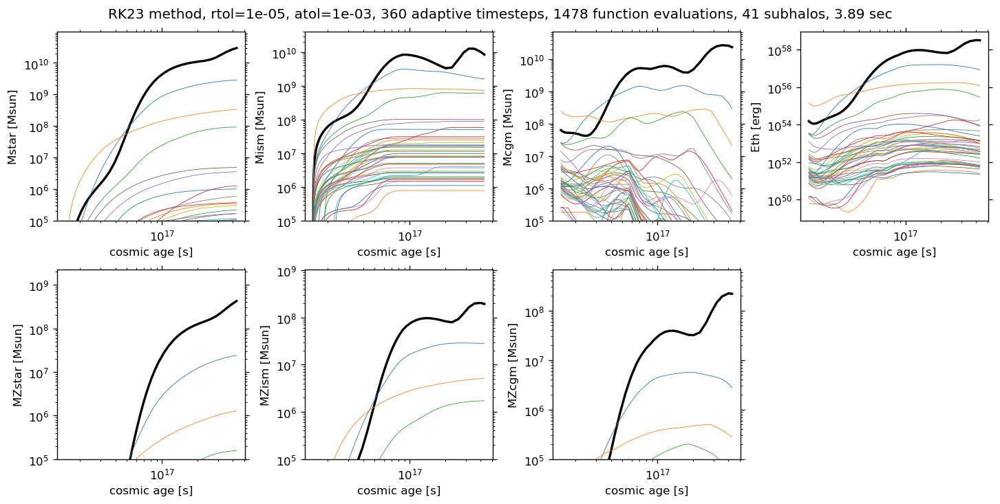

In [36]:
labels = {0:'Mstar [Msun]',1:'Mism [Msun]',2:'Mcgm [Msun]',3:'Eth [erg]',4:'MZstar [Msun]',5:'MZism [Msun]',6:'MZcgm [Msun]'}
          
fig, axes = plt.subplots(nrows=2,ncols=4,figsize=(12,6),constrained_layout=True)
allax = np.ravel(axes)
allax[-1].axis('off')

# reshape output for easier access
sol_rs = sol.y.reshape(len(tree_interpolators),7,sol.y.shape[-1]) # (Nhalos, Nstatevars, Ntimes)

for hnum in np.arange(len(tree_interpolators)):

    # access current halo's state variable vs time array
    hsol = sol_rs[hnum]
    
    if hnum == 0: 
        cstr, lw = 'k-', 2
    else: 
        cstr, lw = '-', 0.5
    
    for varnum in np.arange(7):

        allax[varnum].loglog(10**sol.t,10**hsol[varnum],cstr,lw=lw,mec='none')
        allax[varnum].set_xlabel('cosmic age [s]')
        allax[varnum].set_ylabel(labels[varnum])

fig.suptitle('%s method, rtol=%.0e, atol=%.0e, %i adaptive timesteps, %i function evaluations, %i subhalos, %.2f sec'%(ode_method,rtol,atol,len(sol.t),
                                                                                                                       sol.nfev,len(tree_interpolators)-1,
                                                                                                                       telapsed))

for axnum in [0,1,2,4,5,6]:
    allax[axnum].set_ylim(1e5,None)

# plt.savefig('solve_ivp_logarithmic_%s_%s_benchmark.png'%(halo_name,ode_method),bbox_inches='tight',dpi=150,facecolor='white')

In [37]:
### plot subhalo mass function in terms of Mpeak and Msub(z=0), and satellite stellar mass function -- all in the usual CDF way

# get list of mpeak and msub(z=0) for all subhalos we used (i.e., for indices in isubs)
vals_mpeak = np.array([hist[i]['mpeak'] for i in isubs])
vals_msub = np.array([r[i,-1]['m'] for i in isubs])

# and get list of mstar from final step of ODE solutions for all of these (1:1 mapped) 
vals_mstar = np.array([10**sol_rs[i][0][-1] for i in range(1,len(isubs))])

# bin definitions for CDFs of Mpeak, Msub and Mstar 
bins_mpeak = 10**np.linspace(8,12,100)
bins_msub = 10**np.linspace(8,12,100)
bins_mstar = 10**np.linspace(4,9,100)

# construct CDFs
n_mpeak, _ = np.histogram(vals_mpeak,bins=bins_mpeak)
N_mpeak = np.cumsum(n_mpeak[::-1])[::-1]

n_msub, _ = np.histogram(vals_msub,bins=bins_msub)
N_msub = np.cumsum(n_msub[::-1])[::-1]

n_mstar, _ = np.histogram(vals_mstar,bins=bins_mstar)
N_mstar = np.cumsum(n_mstar[::-1])[::-1]

# observed CDF from McConnachie+12 (latest 2021 table from website)
n_m12, _ = np.histogram(tm12['Mstar'],bins=bins_mstar)
N_m12 = np.cumsum(n_m12[::-1])[::-1]

n_dw20, _ = np.histogram(tdw20['Mstar'],bins=bins_mstar)
N_dw20 = np.cumsum(n_dw20[::-1])[::-1]

# bincenters for plotting
bincenters_mpeak = (bins_mpeak[1:]+bins_mpeak[:-1])/2.
bincenters_msub = (bins_msub[1:]+bins_msub[:-1])/2.
bincenters_mstar = (bins_mstar[1:]+bins_mstar[:-1])/2.


In [38]:
# Halo occupation fraction
# cannot do this until we model also disrupted/merged halos ??? 



57 45


Text(0.5, 0.98, 'SymphonyMilkyWay/Halo414: only includes subhalos that are still surviving at z=0')

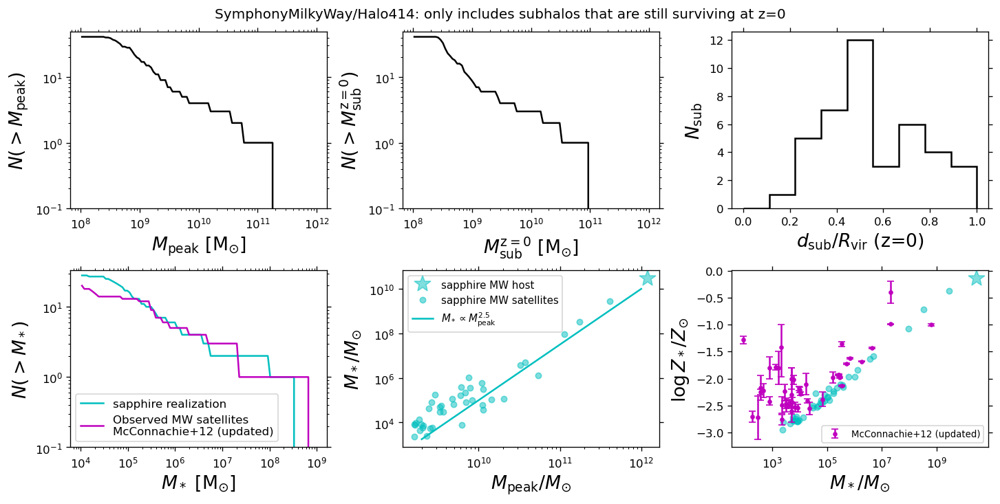

In [45]:
fig, axes = plt.subplots(nrows=2,ncols=3,figsize=(12,6),constrained_layout=True)
axes = np.ravel(axes)

axes[0].plot(bincenters_mpeak, N_mpeak,'k-')
# axes[0].plot(np.sort(vals_mpeak),np.arange(len(vals_mpeak))[::-1],'m-') # empirical way without arbitrary histogram binning
axes[0].set_xlabel(r'$M_{\rm peak}$ [M$_{\odot}$]',fontsize=16)
axes[0].set_ylabel(r'$N(>M_{\rm peak})$',fontsize=16)

axes[1].plot(bincenters_msub, N_msub,'k-')
axes[1].set_xlabel(r'$M_{\rm sub}^{\rm z=0}$ [M$_{\odot}$]',fontsize=16)
axes[1].set_ylabel(r'$N(>M_{\rm sub}^{\rm z=0})$',fontsize=16)

### radial distance distributions
# this has nothing to do with our model right now since we don't have orphans
# so this is just the positions of the surviving z=0 subhalos in units of host Rvir
dsubs = np.array([np.sqrt(np.sum(r[i,-1]['x']**2)) for i in isubs]) / r[0,-1]['rvir']
### this reveals lots of splashback halos which are included in symlink catalogs by default
# we can get rid of them by adding the < Rvir conditions when creating isubs list above 
bins_dsub = np.linspace(0,1,10)
_ = axes[2].hist(dsubs,bins=bins_dsub,histtype='step',lw=1.5,color='k')
axes[2].set_xlabel(r'$d_{\rm sub}/R_{\rm vir}$ (z=0)',fontsize=16)
axes[2].set_ylabel(r'$N_{\rm sub}$',fontsize=16) 

axes[3].plot(bincenters_mstar, N_mstar,'c-',label='sapphire realization')
# axes[2].plot(bincenters_mstar, N_m12, 'm-',label='McConnachie 2021') # includes also M31 and LG dwarfs, not just MW satellites
axes[3].plot(bincenters_mstar, N_dw20, 'm-',label='Observed MW satellites\nMcConnachie+12 (updated)')
axes[3].set_xlabel(r'$M_{\rm *}$ [M$_{\odot}$]',fontsize=16)
axes[3].set_ylabel(r'$N(>M_{\rm *})$',fontsize=16)
axes[3].legend(loc='lower left')

for hnum in np.arange(len(tree_interpolators)):

    # access current halo's state variable vs time array
    hsol = sol_rs[hnum]
    
    if hnum == 0: 
        cstr, ms, label = 'c*', 15, 'sapphire MW host'
    elif hnum == 1: 
        cstr, ms, label = 'co', 5, 'sapphire MW satellites'        
    else: 
        cstr, ms, label = 'co', 5, '__none__'
    
    # print(10**hsol[0][-1])
    axes[4].plot(hist[hnum]['mpeak'],10**hsol[0][-1],cstr,markersize=ms,alpha=0.5,label=label) # Zstar/Zsun vs. Mstar
    
    axes[5].plot(10**hsol[0][-1],np.log10(10**hsol[4][-1]/10**hsol[0][-1]/0.02),cstr,markersize=ms,alpha=0.5,label='__none__') # Zstar/Zsun vs. Mstar

    
mpeak_arr = np.logspace(9.3,12) 
mstar_b13 = 1e-8 * mpeak_arr**1.41 
mstar_manual = 1e-20*mpeak_arr**2.5 
axes[4].plot(mpeak_arr,mstar_manual,'c-',label=r'$M_*\propto M_{\rm peak}^{2.5}$')
# axes[4].plot(mpeak_arr,mstar_b13,'m-',label=r'Behroozi+13 ')
axes[4].legend(loc='upper left',fontsize=9)
axes[4].set_xlabel(r'$M_{\rm peak}/M_{\odot}$',fontsize=16)
axes[4].set_ylabel(r'$M_*/M_{\odot}$',fontsize=16) 
axes[4].set_xscale('log')
axes[4].set_yscale('log')


# now plot the observed MW satellites' MZR assuming [Fe/H] := Z := [M/H] 
tdw20_zmet = tdw20[(tdw20['Fe/H'] != 999) & (tdw20['Fe/H_err_low'] != 999) & (tdw20['Fe/H_err_high'] != 999)] 
print(len(tdw20), len(tdw20_zmet))
axes[5].errorbar(tdw20_zmet['Mstar'],tdw20_zmet['Fe/H'],yerr=[tdw20_zmet['Fe/H_err_high'],tdw20_zmet['Fe/H_err_low']],
            fmt='mo',markersize=3,capsize=3,label='McConnachie+12 (updated)')    
axes[5].set_xlabel(r'$M_*/M_{\odot}$',fontsize=16)
axes[5].set_ylabel(r'$\log Z_*/Z_{\odot}$',fontsize=16)
axes[5].set_xscale('log')
axes[5].legend(loc='lower right',fontsize=8)   
    
    
for axnum in [0,1,3]:
    axes[axnum].set_xscale('log')
    axes[axnum].set_yscale('log')
    
    axes[axnum].set_ylim(1e-1,None)

fig.suptitle('%s: only includes subhalos that are still surviving at z=0'%sim_dir[sim_dir.find('SymphonyMilkyWay'):])
    
    

# Now with ram pressure stripping of CGM and ISM

In [43]:
# From Austen: calculating CGM mass between two radii 
### This will be used to compute CGM mass to be RP stripped between R_rp and Rvir (if R_rp <= 0.1Rvir, entire CGM stripped on sound crossing timescale)
def mCGM_r1_r2(n0, Rstart, Rend, alpha_n):
    Rstart = Rstart * kpc_to_cm
    Rend = Rend * kpc_to_cm
    
    return n0 * (4*np.pi *0.59*const_mp * (Rend**(3+alpha_n) - (Rstart)**(3+alpha_n))) / ((3+alpha_n)*Rend**(alpha_n) )


# 

In [56]:
"""
Set up ODE integrator function including subhalos (array-based operations)
"""

def integrator(logt, logy, parameters, interp_redshift, tree_interpolators, zmerge, zstart):
    """ 
    logt = log(current time in seconds)
    logy = 2D array of log(state variables) for host (0th row) and subhalos (other rows) at current time
    parameters = dictionary of model/runtime parameters
    interp_redshift = interpolator for mapping current time to redshift (faster to interpolate than re-evaluate cosmology functions)    
    tree_interpolators = list of lists of tree interpolators for host (0th index list) followed by subhalos
                         ---> the order of the interpolators is [logMAH,logMvir,logRvir,logVvir,logcNFW]
    zmerge = list of redshifts at which each subhalo first falls into host (before this, subhalos evolve as centrals, afterwards they evolve as satellites) 
    zstart = list of earliest redshifts at which each halo first appears in merger trees (before this, all ODEs should be 0 so halo does not evolve)
    """
    
    # Austen's approach: reshape flattened logy to have shape (N halos, 7 state variables) 
    logy = logy.reshape(len(logy_init), 7)
    
    # unpack the log10 state variables and raise to power 10 

    M_star = 10**logy[:,0]
    M_ism = 10**logy[:,1]
    M_cgm = 10**logy[:,2]
    Eth_cgm = 10**logy[:,3]
    MZ_star = 10**logy[:,4]
    MZ_ism = 10**logy[:,5]
    MZ_cgm = 10**logy[:,6]
    
    # also raise the log10(t/sec) to power of 10 and convert to Gyr for interpolation functions
    t_Gyr = 10**logt * s_to_yr * 1e-9 
    
    # unpack our SAM's free parameters
    alpha_n = parameters['alpha_n']
    alpha_T = parameters['alpha_T']
    tau_escape = parameters['tau_escape']
    f_recycle = parameters['f_recycle']
    e_wind_halo = parameters['e_wind_halo']
    yZ = parameters['yZ']
    etaM_A = parameters['etaM_A']
    etaM_alpha0 = parameters['etaM_alpha0']
    etaM_alphaz = parameters['etaM_alphaz']
    etaM_beta = parameters['etaM_beta']    
    tdep_A = parameters['tdep_A']
    tdep_alpha0 = parameters['tdep_alpha0']   
    tdep_alphaz = parameters['tdep_alphaz']   
    tdep_beta = parameters['tdep_beta']    
    etaE_A = parameters['etaE_A']
    etaE_alpha0 = parameters['etaE_alpha0']
    etaZ_A = parameters['etaZ_A']
    etaZ_alpha0 = parameters['etaZ_alpha0']
    etaZ_alphaz = parameters['etaZ_alphaz']
    etaZ_beta = parameters['etaZ_beta']    
    alpha_prev = parameters['alpha_prev'] 
    return_all = parameters['return_all']
    
    # interpolate from current time to current redshift (faster than doing cosmology calculation)
    redshift = interp_redshift(t_Gyr).item()
    
    # unpack tree_interpolators: every subhalo has its own set of interpolators -- this is all a list of lists
    interp_logMAH = tree_interpolators[:,0]
    interp_logMvir = tree_interpolators[:,1]    
    interp_logRvir = tree_interpolators[:,2]    
    interp_logVvir = tree_interpolators[:,3]    
    interp_logcNFW = tree_interpolators[:,4]  
    interp_rRatio = tree_interpolators[:,5]   
    interp_logVmax = tree_interpolators[:,6]
    interp_vorb = tree_interpolators[:,7]    
    
    # evaluate the interpolator functions for every subhalo at the current time using list comprehension
    logMAH = np.array([interp(np.log(t_Gyr*1e9)).item() for interp in interp_logMAH]) # dlogM/dlogt (this is slope)
    
    # Prevent negative MAH for subhalos even prior to zmerge
    logMAH = np.clip(logMAH,0,None)
    
    Mvir = np.exp([interp(np.log(t_Gyr*1e9)).item() for interp in interp_logMvir]) # Mvir in Msun
    Mdot_vir = logMAH * (Mvir/(t_Gyr*1e9)) # MAR in Msun/yr via dlnM/dlnt * (M/t)
    Rvir = np.exp([interp(t_Gyr).item() for interp in interp_logRvir]) # proper kpc -- note the input is t in Gyr, unlike log(t/yr) for Mvir and MAH
    Vvir = np.exp([interp(t_Gyr).item() for interp in interp_logVvir]) # proper km/s 
    NFW_c = np.exp([interp(t_Gyr).item() for interp in interp_logcNFW]) # dimensionless NFW halo concentration Rvir/Rs_klypin
    rRatio = np.array([interp(t_Gyr).item() for interp in interp_rRatio]) # subhalo distance in units of host Rvir
    Vmax = np.exp([interp(t_Gyr).item() for interp in interp_logVmax]) # proper km/s
    vorb = np.array([interp(t_Gyr).item() for interp in interp_vorb]) # proper km/s
    
    ### NEW for subhalos with zmerge < current redshift, they are satellites and not allowed to accrete ISM gas, so set Mdot_cool=0 and Edot_cool=
    # this is accomplished by converting zmerge into 0 or 1 for each halo depending on whether its zmerge happened before current redshift (i.e., at higher z)
    # Following Austen -- moved this up here, and changed satellite flag to depend on rRatio < 1 (within Rvir of host) instead of zmerge
    #                     Unclear yet what the best flag is (currently, satellites that wiggle around Rvir may be numerically unstable
    #                     due to switching on and off ODE terms; OTOH, we might treat something as satellite always after zmerge even if its rRatio becomes > 1 )
    #                     A third possibility is in the interpolator, after zmerge, never let rRatio be > 1 again (pre-process time series of rRatio)
    # satellite_flag = np.where(zmerge>redshift, 0, 1) # assigns 0 for halos that have already fallen into the host (i.e., are currently satellites)    
    satellite_flag = np.where(rRatio < 1, 0, 1) # assigns 0 for halos that have already fallen into the host (i.e., are currently satellites)        
    
    print('---------> logt=%s, t_Gyr=%s, redshift=%s'%(logt,t_Gyr,redshift))
    # print('rRatio=%s'%rRatio)
    # print('logy=%s'%logy)
    # print('Mstar=%s,Mism=%s,Mcgm=%s,Eth=%s'%(M_star,M_ism,M_cgm,Eth_cgm))
    # print('logMAH=%s,Mvir=%s,Mdot_vir=%s,Rvir=%s,Vvir=%s,c=%s'%(logMAH,Mvir,Mdot_vir,Rvir,Vvir,NFW_c))

    """ 
    everything that follows is now an array operation 
    i.e., same calculation for host halo and all its subhalos simultaneously unless otherwise noted/modified
    """
    
    # compute gas free-fall radius rff = radius of Vmax ~ 2.16*Rscale ~ 2.16 * Rvir/cNFW 
    rff = 2.16 * (Rvir / NFW_c) / Rvir # in units of Rvir
    
    # compute any other global halo quantities 
    Tvir = 35.9 * Vvir**2 # K 
    evir_halo = 3/2. * const_kB * Tvir / (0.59*const_mp) # erg/Msun  
    tdyn_halo = Rvir / (Vvir * 1e5*cm_to_kpc / (s_to_yr*1e-9)) # Gyr
    
    # analytic formula for NFW Vcirc(rff:=r/Rvir) rom Mo, van den Bosch & White eqn 11.26
    NFW_vcirc_num = np.log(1+NFW_c*rff) - NFW_c*rff/(1+NFW_c*rff)
    NFW_vcirc_den = rff*(np.log(1+NFW_c)-NFW_c/(1+NFW_c))
    NFW_vcirc = Vvir*np.sqrt(NFW_vcirc_num/NFW_vcirc_den) # km/s
    tdyn_ism = rff*Rvir / (NFW_vcirc * 1e5*cm_to_kpc / (s_to_yr*1e-9)) # Gyr
    
    # get SF and ISM wind scalings from FIRE 
    tdep_ism = get_tdep(Vvir,redshift,A=tdep_A,alpha0=tdep_alpha0,alphaz=tdep_alphaz,beta=tdep_beta) # Gyr 
    etaM_ism = get_etaM_ism(Vvir,redshift,A=etaM_A,alpha0=etaM_alpha0,alphaz=etaM_alphaz,beta=etaM_beta) # dimensionless
    etaE_ism = get_etaE_ism(Vvir,redshift,A=etaE_A,alpha0=etaE_alpha0,alphaz=0.0,beta=0.0) # dimensionless    
    etaZ_ism = get_etaZ_ism(Vvir,redshift,A=etaZ_A,alpha0=etaZ_alpha0,alphaz=etaZ_alphaz,beta=etaZ_beta) # dimensionless    

    # new FIRE Zdot/Mdot scalings for chemical evolution modeling
    Zin_halo = get_Zin_halo(Vvir,redshift) # dimensionless Zdot/Mdot (*not* normalized to Zsun)
    
    # compute log10 of CGM metallicity normalized to Zsun for cooling function
    log_Zcgm = np.log10(MZ_cgm / M_cgm / 0.02)
        
    ### compute Mdot_in_halo and Edot_in_halo terms 
    # first f_UV for UVB photoionization suppression of halo inflows
    Mfilt = m_filt(z=redshift)
    f_UV = collapse_fraction(Mvir,Mfilt)  
    
    # f_prev due to SN wind shock heating 
    # in the future will add zeta=Edot_out_halo_previous / (evir_halo*Mdot_in_halo) here 
    
    # assume this gas accretion brings in specific energy = evir_halo
    # f_prev will be computed and multiply both of these inflow rates AFTER we compute the halo energy outflow rate below
    Mdot_in_halo = f_UV * f_b * Mdot_vir # Msun/yr
    Edot_in_halo = Mdot_in_halo * evir_halo / yr_to_s # erg/s 
    
    ### compute Edot_cool and Mdot_cool terms
    # first get n0 for density profile and T0 for temperature profile (this can be done analytically)
    rarr = np.logspace(np.log10(0.1),np.log10(1.0),100)    

    n0_val = analytic_n0(M_cgm,Rvir,alpha_n) # cm**-3
    T0_val = analytic_T0(Eth_cgm,Rvir,n0_val,alpha_n,alpha_T) # K
    
    # now construct density and temperature profiles
    # NOTE: this now has a list comprehension due to working with subhalos: it's a 2D array, where each row is radial profile of n(r) for each subhalo
    n_rarr = np.array([n0 * rarr**alpha_n for n0 in n0_val]) # cm**-3
    T_rarr = np.array([T0 * rarr**alpha_T for T0 in T0_val]) # K     

    ##### NEW FOR AUSTEN -- USE CIE SD93 COOLING FUNCTION -- this is just a scalar number, no longer an array, so easier/faster to work with
    # halo_coolfunc = 10**coolfunc_sd93(np.log10(T0_val),log_Zcgm).item() # erg*cm**3/s 
    halo_coolfunc = 10**rgi_sd93(list(zip(np.log10(T0_val),log_Zcgm)))
    # print('coolfunc=%s, T0_val=%s'%(halo_coolfunc,T0_val))
    
    # compute the Edot_cool integral in erg/s
    # NOTE: this needs to be a list comprehension since integration of radial profiles happens for each halo
    Edot_cool = np.array([trapz(y=4*np.pi*(rarr*Rvir[i]*kpc_to_cm)**2*(n_rarr[i])**2*halo_coolfunc[i],x=rarr*Rvir[i]*kpc_to_cm) 
                          for i in range(len(Rvir))])
    
    # limit catastrophic cooling by taking minimum of Edot_cool and Eth/tff since CGM cannot lose energy faster than grav collapse (radiating away grav PE)
    # NOTE: added axis=0 for np.min over subhalo array
    Edot_cool = np.min([Edot_cool,Eth_cgm/(tdyn_halo*1e9*yr_to_s)], axis=0)
    
    # compute an effective tcool as Energy_cgm / Edot_cool
    tcool_eff = (Eth_cgm / Edot_cool)*s_to_yr*1e-9 # Gyr    

    # compute effective free-fall time at pre-defined radius rff 
    tff_eff = (rff*Rvir*kpc_to_cm*1e-5 / NFW_vcirc)*s_to_yr*1e-9 # Gyr        

    # compute Mdot_cool as M_cgm / t_accrete where t_accrete = tcool,eff + tff,eff
    t_accrete = tcool_eff + tff_eff # Gyr
    Mdot_cool = M_cgm / (t_accrete*1e9) # Msun/yr        
        
    # Multiplying the Mdot_cool and Edot_cool by satellite flag to zero these out (for current satellites) or keep it as-is (for current centrals)
    # QUESTION: do we instead want to make this a free parameter to suppress gas cooling/accretion? Currently this enforces starvation for all satellites
    Edot_cool *= satellite_flag # Feb 2024 -- satellite CGMs still radiatively cool, just do not collapse. (They may also mix / get heated by host CGM)
    Mdot_cool *= satellite_flag
    
    # ALSO apply this satellite flag to prevent any new subhalo accretion (or loss), i.e., Mdot_in_halo = 0 and Edot_in_halo = 0
    Mdot_in_halo *= satellite_flag
    Edot_in_halo *= satellite_flag
    
    """ CGM ram pressure stripping for current satellites (Viraj adapted from Austen + minor OOM simplifications for now) """
    Mcgm_strip = np.zeros(len(tree_interpolators))
    
    # compute CGM density of host at current radius of every subhalo (we will impose satellite_flag afterwards) 
    rho_host = 0.59*const_mp*n0_val[0]*rRatio**alpha_n # Msun/cm**3 
    
    # compute radius beyond which CGM mass ram pressure exceeds grav restoring force using simple OOM formula
    # this analytic formula assumes both satellite CGM and total mass profiles go as r**-2
    # there should probably be an order unity geometric pre-factor that accounts for CGM projected density effects
    Rram_cgm_old = np.sqrt((Vmax**2/vorb**2) * M_cgm/(rho_host * Rvir*kpc_to_cm))*cm_to_kpc
    Rram_cgm = np.sqrt((Vmax**2/Vmax[0]**2) * M_cgm/(rho_host * Rvir*kpc_to_cm))*cm_to_kpc # vorb is noisy / not stitched properly to z=0 for symfind/rockstar
    # print('Rram_cgm_old=%s,Rram_cgm_new=%s'%(Rram_cgm_old,Rram_cgm))
    # print('Rram_cgm/Rvir=%s'%(Rram_cgm/Rvir))
    
    # compute CGM mass between R_rp and Rvir to be stripped (this will be 0 for non-satellites)
    Mcgm_strip[satellite_flag==0] = mCGM_r1_r2(n0_val[satellite_flag==0], Rram_cgm[satellite_flag==0], Rvir[satellite_flag==0], alpha_n)
    # print('Mcgm_strip=%s'%Mcgm_strip)
    
    # if R_rp <= 0.1Rvir, entire satellite CGM mass is eligible for stripping
    Mcgm_strip[(satellite_flag==0) & (Rram_cgm <= 0.1*Rvir)] = M_cgm[(satellite_flag==0) & (Rram_cgm <= 0.1*Rvir)]
    
    # just to prevent bugs, if R_rp > Rvir, set Mcgm_strip to 0 since otherwise it would be negative
    Mcgm_strip[(satellite_flag==0) & (Rram_cgm > Rvir)] = 0.
    
    # print('Mcgm_strip=%s, Mcgm=%s'%(Mcgm_strip,M_cgm))
    
    # Compute sound crossing time as the CGM RP stripping timescale -- approximated as Rvir_sub / cs_host 
    cs_host = np.sqrt((5/3.) * const_kB * T0_val[0] / (0.59*const_mp*Msun_to_g))*1e-5 # km/s 
    tram_cgm = (Rvir*kpc_to_cm*1e-5 / cs_host)*s_to_yr # yr; this is computed for all halos including non-satellites 
    Mdot_ram_cgm = Mcgm_strip / tram_cgm # Msun/yr -- this will be 0 for non-satellites since Mcgm_strip is 0 
    
    # for simplicity, assume this stripped CGM gas has same specific energy (temperature) as host CGM
    ecgm_host = 3/2. * const_kB * T0_val[0] / (0.59*const_mp) # erg/Msun     
    Edot_ram_cgm = Mdot_ram_cgm * ecgm_host / yr_to_s # erg/s ; this will still be 0 for non-satellites since Mdot_ram_cgm=0
    
    # # finally, if Mcgm < threshold, don't apply ram pressure stripping
    Mdot_ram_cgm[(satellite_flag==0) & (M_cgm < 100)] = 0
    Edot_ram_cgm[(satellite_flag==0) & (M_cgm < 100)] = 0
    
    """ ISM ram pressure stripping """
    
    
    # print('Mdot_cool=%.1e, Edot_cool=%.1e, Eth/tdyn_halo=%.1e'%(Mdot_cool,Edot_cool,Eth_cgm/(tdyn_halo*1e9*yr_to_s)))
    
    ### compute SFR term
    Mdot_sfr = M_ism / (tdep_ism*1e9) # Msun/yr
    
    ### compute Mdot_wind and Edot_wind terms
    Mdot_wind = etaM_ism * Mdot_sfr # Msun/yr
    
    # March 2023 -- switch from parameterized vB back to parameterized etaE for computing Edot_wind 
    Edot_wind = etaE_ism * ((1e51/100.) * (Mdot_sfr/yr_to_s)) # erg/s
    
    
    # print('Mdot_ram_cgm=%s, Mdot_wind=%s, Mcgm/Mdot_ram=%s, tram=%s, T0=%s'%(Mdot_ram_cgm,Mdot_wind,M_cgm/Mdot_ram_cgm,tram_cgm,T0_val))        
    
    ### compute Edot_out_halo and Mdot_out_halo terms 
    Ebind_cgm = evir_halo * M_cgm # erg
    Delta_Ecgm = Eth_cgm - Ebind_cgm # erg
    Edot_out_halo = np.maximum(0.0,Delta_Ecgm) / (tau_escape*tdyn_halo*1e9*yr_to_s) # erg/s; NOTE: switched to np.maximum to take axis=0 by default
    Mdot_out_halo = (Edot_out_halo/s_to_yr) / (e_wind_halo*(Eth_cgm/M_cgm)) # Msun/yr
    
    # Feb 2024 --- for satellites, set halo outflow rates = ISM outflow rates since we will assume all wind material goes into host CGM
    Edot_out_halo[satellite_flag==0] = Edot_wind[satellite_flag==0]
    Mdot_out_halo[satellite_flag==0] = Mdot_wind[satellite_flag==0]
    
    ### Go back and compute f_prev to reduce Mdot_in_halo and Edot_in_halo due to preventative feedback 
    # f_prev = np.min([1.0,kappa_heat * (Edot_out_halo / Edot_in_halo)])
    
    ### Nov 14 2022 -- parameterized fthermal_wind, fthermal_accretion, fprev
    f_prev = get_fprev(Vvir)#,redshift)
    
    # Carr+23/Pandya+20 style version where f_prev depends on ratio of Edot_out_halo and Edot_in_halo in the absence of preventative feedback
    # f_prev = np.min([alpha_prev * Edot_in_halo/Edot_out_halo, 1.0])
    
    Mdot_in_halo *= f_prev 
    Edot_in_halo *= f_prev 
        
    ##### New chemical evolution MZdot's 
    Zcgm = MZ_cgm / M_cgm # metal mass fraction of CGM (not normalized to solar and not log10)
    Zism = MZ_ism / M_ism # metal mass fraction of ISM     
    
    MZdot_sfr = Zism*(1.0-f_recycle)*Mdot_sfr # new long-lived stellar mass has same metallicity as ISM
    MZdot_cool = Zcgm*Mdot_cool # metal inflow rate from CGM to ISM
    MZdot_yield = yZ*Mdot_sfr # new metal mass produced by both short- and long-lived stars 
    MZdot_wind = Zism*Mdot_wind + etaZ_ism*MZdot_yield # metal outflow rate of ISM wind
    MZdot_in_halo = Zin_halo*Mdot_in_halo # metal inflow rate into CGM from cosmic accretion
    MZdot_out_halo = Zcgm*Mdot_out_halo # metal outflow rate from overpressurized halo
    
    ### Finally combine and return the total derivatives for the state variables (in the same order as y)
    # FIRST: since the time array (hence dt) will be in sec, convert all of these to Msun/s and erg/s
    Mdot_sfr_longlived = (1.0-f_recycle)*Mdot_sfr / yr_to_s # Msun/s
    Mdot_ism = (Mdot_cool - (1.0-f_recycle)*Mdot_sfr - Mdot_wind) / yr_to_s # Msun/s
    
    # Feb 2024 -- assume satellites cannot hold onto their own winds or RP stripped gas, so add the sum of that to the host CGM
    # note: we already set Mdot_wind=Mdot_out_halo for satellites so those will cancel out for satellites
    # Mdot_cgm = (Mdot_in_halo - Mdot_cool + Mdot_wind - Mdot_out_halo) / yr_to_s # Msun/s     
    # print('Mdot_cgm=%s,Mdot_in=%s,Mdot_cool=%s,Mdot_wind=%s,Mdot_out=%s'%(Mdot_cgm,Mdot_in_halo,Mdot_cool,Mdot_wind,Mdot_out_halo))
    Mdot_cgm = (Mdot_in_halo - Mdot_cool + Mdot_wind - Mdot_out_halo - Mdot_ram_cgm) / yr_to_s # Msun/s 
    
    print(list(zip(M_cgm, Mdot_cgm*yr_to_s,Mdot_in_halo,Mdot_cool,Mdot_wind,Mdot_out_halo,Mdot_ram_cgm))[:5])    
    
    Mdot_sats = np.sum(Mdot_wind[satellite_flag==0]) + np.sum(Mdot_ram_cgm[satellite_flag==0]) # total satellite material that goes to host CGM    
    Mdot_cgm[0] += Mdot_sats / yr_to_s # add satellite winds and stripped gas to host CGM; note need to convert to Msun/s
    # Mdot_cgm[(satellite_flag==0) & (M_cgm <= 100)] = 0 # do not allow CGM mass to change for satellites that have already lost ~all of it
    
    # Feb 2024 -- similarly transfer satellite wind/stripped energy to host CGM
    Edot_cgm_th = Edot_in_halo - Edot_cool + Edot_wind - Edot_out_halo # erg/s    
    # Edot_cgm_th = Edot_in_halo - Edot_cool + Edot_wind - Edot_out_halo - Edot_ram_cgm # erg/s
    Edot_sats = np.sum(Edot_wind[satellite_flag==0]) + np.sum(Edot_ram_cgm[satellite_flag==0])
    Edot_cgm_th[0] += Edot_sats
    # Edot_cgm_th[(satellite_flag==0) & (M_cgm <= 100)] = 0 # note that this uses the same Mcgm<threshold condition as above to be consistent
    
    # print('satellite_flag=%s'%satellite_flag)
    # print('Mdot_cgm=%s, Edot_cgm=%s'%(Mdot_cgm,Edot_cgm_th))
    # print('Mdot_ram=%s, Edot_ram=%s'%(Mdot_ram_cgm,Edot_ram_cgm))
    
    # TBD -- WE ALSO NEED TO TRANSFER METALS FROM SATELLITES TO HOST CGM
    
    MZdot_star = MZdot_sfr / yr_to_s # Msun/s
    MZdot_ism = (MZdot_cool + MZdot_yield - MZdot_sfr - MZdot_wind) / yr_to_s # Msun/s
    MZdot_cgm = (MZdot_in_halo - MZdot_cool + MZdot_wind - MZdot_out_halo) / yr_to_s # Msun/s
    
    
    # NEW: at high-redshift, check which subhalos actually exist yet, and only let the state variables change/evolve for those existing subhalos
    # this is accomplished similarly to zmerge above: translate zstart array to 0 or 1 based on whether each subhalo's main branch has already started
    # then multiply total ODEs by this binary flag array to zero out (for subhalos that don't exist yet) or keep calculations as-is (for existing subhalos)
    early_flag = np.where(zstart<redshift,0,1) # assigns 0 for subhalos that start at a lower redshift than current redshift
    Mdot_sfr_longlived *= early_flag
    Mdot_ism *= early_flag
    Mdot_cgm *= early_flag # * satellite_flag
    Edot_cgm_th *= early_flag # * satellite_flag
    MZdot_star *= early_flag
    MZdot_ism *= early_flag
    MZdot_cgm *= early_flag # * satellite_flag
    
    # SECOND: since we are integrating log(state_variable) AND log(time), multiply RHS by 10**t[sec] / 10**state_variable
    #         thus these all become dimensionless logarithmic derivatives dlogX/dlogt
    # NOTE: for non-existing subhalos, these will all still be dlogX/dlogt = 0 aka zero change in logarithmic value of state variables 
    Mdot_sfr_longlived *= 10**logt / M_star 
    Mdot_ism *= 10**logt / M_ism 
    Mdot_cgm *= 10**logt / M_cgm
    Edot_cgm_th *= 10**logt / Eth_cgm
    MZdot_star *= 10**logt / MZ_star
    MZdot_ism *= 10**logt / MZ_ism
    MZdot_cgm *= 10**logt / MZ_cgm   
    
    # print('log_Mdot_cgm=%s'%Mdot_cgm)
    
#     print('---------> logt=%s, t_Gyr=%s, redshift=%s'%(logt,t_Gyr,redshift))
    
#     print('M_star=%s,M_ism=%s,M_cgm=%s,Eth_cgm=%s,Ekin_cgm=%s,MZ_star=%s,MZ_ism=%s,MZ_cgm=%s'%(logy[0],logy[1],logy[2],logy[3],logy[4],logy[5],logy[6],logy[7]))    
    
#     print('Mdot_sfr_longlived=%s,Mdot_ism=%s,Mdot_cgm=%s,Edot_cgm_th=%s,T0=%s,MZdot_star=%s,MZdot_ism=%s,MZdot_cgm=%s'%(Mdot_sfr_longlived,Mdot_ism,
#                                                                                                                   Mdot_cgm,Edot_cgm_th,T0_val,
#                                                                                                                   MZdot_star,MZdot_ism,MZdot_cgm))
    
#     print('Mdot_in_halo=%s,Mdot_cool=%s,Mdot_wind=%s,Mdot_out_halo=%s'%(Mdot_in_halo,Mdot_cool,Mdot_wind,Mdot_out_halo))
#     print('Edot_in_halo=%s,Edot_cool=%s,Edot_wind=%s,Edot_out_halo=%s'%(Edot_in_halo,Edot_cool,Edot_wind,Edot_out_halo))    
    
#     print('T0=%s,Edot_in_halo_th=%s,Edot_diss=%s,Edot_cool=%s,Edot_wind_th=%s,Edot_out_halo_th=%s'%(T0_val,
#                                                                                                     Edot_in_halo_th*10**logt / Eth_cgm,
#                                                                                                     Edot_diss*10**logt / Eth_cgm,
#                                                                                                     Edot_cool*10**logt / Eth_cgm,
#                                                                                                     Edot_wind_th*10**logt / Eth_cgm,
#                                                                                                     Edot_out_halo_th*10**logt / Eth_cgm))

    if return_all is True:

        return {'cosmic_age':t_Gyr,'Mdot_in_halo':Mdot_in_halo,'Edot_in_halo':Edot_in_halo,'f_prev':f_prev} 

    else: # Austen's approach: return flattened array of ODEs 
        return np.vstack([Mdot_sfr_longlived, Mdot_ism, Mdot_cgm, Edot_cgm_th, MZdot_star, MZdot_ism, MZdot_cgm]).T.flatten()

        

In [57]:
### set integration times in log (t/sec)
z_init = 10.0 # previously z=8.98 
logt_init = np.log10(cosmo.age(z_init).value * 1e9 * yr_to_s) # Gyr to sec 
z_final = 1/scale[-1] - 1 
logt_final = np.log10(cosmo.age(z_final).value * 1e9 * yr_to_s) 

# output times at which to evaluate dense solution
logt_eval = np.linspace(logt_init,logt_final,1000)

### initial conditions for central and all subhalos 

# function that returns list of initial values for any halo given its interpolator functions
def ic_halo(logt_init,interp_logMvir,interp_logVvir):
    # just say initially the halo has Mcgm ~ half baryon budget (we dont know any better)
    Mcgm_init = 0.5*f_b*np.exp(interp_logMvir(np.log(10**logt_init*s_to_yr)))  # input is logt in yr
    Ecgm_init = (Mcgm_init*u.Msun * (np.exp(interp_logVvir(10**logt_init*s_to_yr*1e-9))*u.km/u.s)**2).to('erg').value # input is t in Gyr

    Mstar_init = 1. # arbitrary small number
    Mism_init = 1. # arbitrary small number
    Z_init = 1e-4 * 0.02 # assume initial metallicity is 1E-4/Zsun, multiply initial masses by this factor to get initial metal *mass*
    
    return np.log10([Mstar_init,Mism_init,Mcgm_init,Ecgm_init,Z_init*Mstar_init,Z_init*Mism_init,Z_init*Mcgm_init])
    
# use list comprehension to initialize for host halo and all subhalos at once
logy_init = np.array([ic_halo(logt_init,tree_interpolators[i][1],tree_interpolators[i][3]) for i in range(len(tree_interpolators))])


In [58]:
tstart = timer()

# test only first 3 halos (central + 2 most massive satellites)
nhalos = 5
logy_init = np.array([ic_halo(logt_init,tree_interpolators[i][1],tree_interpolators[i][3]) for i in range(len(tree_interpolators[:nhalos]))])

ode_method = 'RK23'

sol = solve_ivp(integrator,[logt_init,logt_final],logy_init.flatten(),dense_output=True,method=ode_method,
                atol=atol,rtol=rtol,args=(parameters,interp_redshift,tree_interpolators[:nhalos],zmerge[:nhalos],zstart[:nhalos]))

telapsed = timer()-tstart

print('\n',sol.message,'solve_ivp took %.3f seconds'%(telapsed),'\n')

---------> logt=16.177753530325106, t_Gyr=0.4771441057107921, redshift=9.999999994015432
[(64126633.25879492, -0.4538108158482707, 0.2835181286702761, 0.5291481384965301, 7.196731839738302e-12, 0.20818080602921346, 0.0), (26776583.35933976, -0.15129553371393445, 0.17997374491581788, 0.24429688123240598, 3.4647160158058486e-12, 0.08697239740081107, 0.0), (247586315.03004226, -1.9913529705621744, 0.9085227319904342, 2.0956901481066543, 2.2209443945767224e-11, 0.8041855544681635, 0.0), (25857123.846768226, -0.15664638077428023, 0.14281803870420381, 0.2154784877414818, 3.3542234267995433e-12, 0.08398593174035648, 0.0), (1058242.7776083713, -0.010780870501185357, 0.0030482353741870948, 0.010429101861466363, 2.248133166899046e-13, 0.003400004014130901, 0.0)]
---------> logt=16.177753530891998, t_Gyr=0.4771441063336168, redshift=9.999999984437126
[(64126632.976150826, -0.45381080697298537, 0.2835181295880253, 0.5291481354499418, 1.0006080679449798e-11, 0.20818080112107498, 0.0), (26776583.265

/tmp/ipykernel_74017/3702258043.py:198: RuntimeWarning: divide by zero encountered in divide
  Rram_cgm_old = np.sqrt((Vmax**2/vorb**2) * M_cgm/(rho_host * Rvir*kpc_to_cm))*cm_to_kpc
/tmp/ipykernel_74017/3702258043.py:22: RuntimeWarning: overflow encountered in power
  M_star = 10**logy[:,0]
/tmp/ipykernel_74017/3702258043.py:26: RuntimeWarning: overflow encountered in power
  MZ_star = 10**logy[:,4]
/tmp/ipykernel_74017/3702258043.py:28: RuntimeWarning: overflow encountered in power
  MZ_cgm = 10**logy[:,6]
/tmp/ipykernel_74017/3702258043.py:334: RuntimeWarning: invalid value encountered in multiply
  MZdot_cgm *= 10**logt / MZ_cgm
/tmp/ipykernel_74017/3702258043.py:332: RuntimeWarning: invalid value encountered in multiply
  MZdot_star *= 10**logt / MZ_star


[(52930104.06777532, -0.008883012279272842, 0.3855244293992386, 0.37871977073532626, 0.00036868105524114937, 0.016056351998426324, 0.0), (34725411.44371255, 0.24441367924445834, 0.5029006323612937, 0.2586320927602232, 0.00014513964338789254, 0.0, 0.0), (172895503.69621348, -0.2630282569290353, 1.2824468249843057, 1.2167379029272811, 0.003422916002273895, 0.3321600949883338, 0.0), (23450595.49008231, 0.02482545558688388, 0.18101789744938906, 0.15627270334913043, 8.02614866252498e-05, 0.0, 0.0), (621170.7180115747, -0.0019175381573258538, 0.0030894504349936003, 0.005007183642781574, 1.950504621197762e-07, 0.0, 0.0)]
---------> logt=16.261568943623285, t_Gyr=0.5787153162591048, redshift=8.671039129138178
[(52740854.54186273, -0.00732655449924666, 0.3878414755280128, 0.37452446583451465, 0.00039827629555660993, 0.02104184048830141, 0.0), (36136309.28900695, 0.26748565532550045, 0.5334026958141833, 0.26608084322386777, 0.00016380273518491718, 0.0, 0.0), (170888106.54725087, -0.2165549685640

In [94]:
6.633117412673328 - 0.8895561752108039 + 0.36488275209909354 - 10.9499964915073

-4.8415525019456815

In [99]:
atol

0.001

In [40]:
atol, rtol

(0.001, 1e-05)

In [90]:
test1 = np.array([1,1,1])
test2 = np.array([2,2,2])
test3 = np.array([3,3,3])

list(zip(test1,test2,test3))[:2]

[(1, 2, 3), (1, 2, 3)]